In [1]:
from general_tools.notebook.gpu_utils import setup_one_gpu
GPU = 0
setup_one_gpu(GPU)

Picking GPU 0


In [19]:
import sys
import time
import numpy as np
import os.path as osp
import tensorflow as tf
import matplotlib.pyplot as plt

from general_tools.notebook.tf import reset_tf_graph

import tf_lab.point_clouds.in_out as pio

from tf_lab.point_clouds.in_out import PointCloudDataSet, write_model_ids_of_datasets

from tf_lab.point_clouds.autoencoder import Configuration as Conf

from tf_lab.autopredictors.scripts.helper import shape_net_category_to_synth_id
                                                  
from general_tools.in_out.basics import create_dir, files_in_subdirs

from general_tools.simpletons import select_first_last_and_k

from geo_tool import Point_Cloud

from tf_lab.point_clouds.gan import model_saver_id

from tf_lab.nips.shape_net import pc_loader as sn_pc_loader

from tf_lab.point_clouds.raw_wgan import RawWGAN

from tf_lab.point_clouds.generators_discriminators import mlp_discriminator, convolutional_discriminator,\
                                                          point_cloud_generator, leaky_relu, mlp_discriminator

from tf_lab.autopredictors.evaluate import read_saved_epochs

In [4]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [23]:
save_model = True
save_synthetic_samples = True
class_name = raw_input('Give me the class type.\n').lower()
syn_id = shape_net_category_to_synth_id()[class_name]
synthetic_data_out_dir = '/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/nips/our_synthetic_samples/'

do_training = True
load_model = False
do_plotting = True
n_pc_samples = 2048

max_epochs = 1500
arch_tag = 'mlp_arch'
leak = 0.2
dropout_prob = 0.5
b_norm = True

discriminator = mlp_discriminator

beta = 0.5
disc_kwargs = {'non_linearity': leaky_relu(leak), 'dropout_prob': dropout_prob, 'b_norm': b_norm}
    
generator = point_cloud_generator
gen_kwargs = {'b_norm': False, 'layer_sizes':[64, 128, 256, 512, 1024], 'dropout_prob': dropout_prob}
experiment_name = class_name + '_'+ arch_tag + '_raw_wgan_' + str(n_pc_samples) +  '_pts'

Give me the class type.
car


In [6]:
top_data_dir = '/orions4-zfs/projects/lins2/Panos_Space/DATA/'
train_dir = osp.join(top_data_dir, 'OUT/models/nips/gan/raw_wgan')
train_dir = osp.join(train_dir, experiment_name)
create_dir(train_dir)

full_pclouds_path = osp.join(top_data_dir, 'Point_Clouds/Shape_Net/Core/from_manifold_meshes/centered/', str(n_pc_samples))
full_pclouds_path = osp.join(full_pclouds_path, syn_id)
full_file_names = pio.load_filenames_of_input_data(full_pclouds_path, '.ply')
full_pclouds, full_model_ids, full_syn_ids = pio.load_crude_point_clouds(file_names=full_file_names,
                                                                           n_threads=25, loader=sn_pc_loader)
print '%d files containing complete point clouds were found.' % (len(full_pclouds), )

7497 files containing complete point clouds were found.


In [7]:
training_data = PointCloudDataSet(full_pclouds)

batch_size = 50
noise_params = {'mu':0, 'sigma': 0.5}
noise_dim = 512
init_lr = 0.0001

n_syn_samples = training_data.num_examples  # Same number as original GT data.

In [ ]:
reset_tf_graph()

clamp = 1
gan = RawWGAN(experiment_name, init_lr, clamp, [n_pc_samples, 3], noise_dim,
             discriminator, generator, beta=beta, gen_kwargs=gen_kwargs, disc_kwargs=disc_kwargs)

accum_syn_data = []
train_stats = []

1 (-0.91067396550086033, -0.043583367758526885) 33.4989659786
2 (-6.3073260159328068, -4.2177996224370498) 33.2760989666
3 (-4.8636902871830712, 9.8928817926809707) 33.2266938686
4 (-19.772339932671908, 45.653356815206593) 33.2021808624
5 (-40.358666702796675, 153.15331084152749) 33.1857700348
6 (-30.267674215908709, 154.70837441806137) 33.422700882
7 (-96.153484660181505, 98.320136629301928) 33.3609631062
8 (-228.77139208563443, 23.175777632614661) 33.4541871548
9 (-469.49765446103851, -25.559864570354595) 33.4273109436
10 (-948.84114148370156, 78.117782165264259) 34.4157588482
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-10 is not in all_model_checkpoint_paths. Manually adding it.


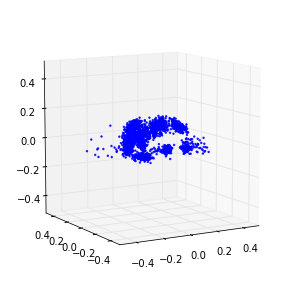

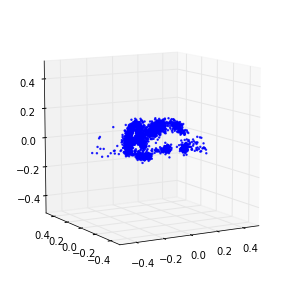

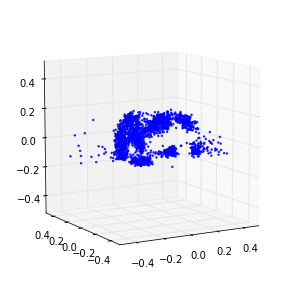

11 (-1782.2286898908944, 3.2231052004057785) 33.411231041
12 (-3252.7450725686963, 92.667868383999533) 34.4482250214
13 (-5550.888759428879, -462.69409705852638) 38.4049539566
14 (-9815.7678306842681, -346.07444921033135) 38.8256220818
15 (-15835.320117187501, -1888.2772616682382) 37.8050050735
16 (-25294.848296066812, -3052.0746081122038) 38.3957500458
17 (-40307.268157327584, -2917.7744940396014) 38.4621500969
18 (-59490.102936422416, -7570.356626313308) 36.0671098232
19 (-85999.643776939658, -12320.210036705281) 37.9248940945
20 (-125051.54304956897, -15749.474794585129) 38.4051830769
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-20 is not in all_model_checkpoint_paths. Manually adding it.


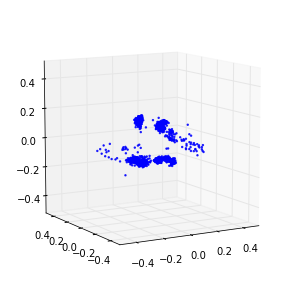

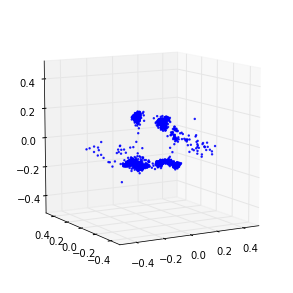

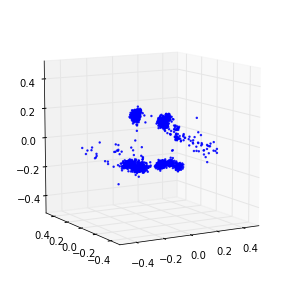

21 (-181852.5593211207, -28133.683694773707) 37.397851944
22 (-243112.1036637931, -38393.9951171875) 36.7771370411
23 (-347884.24956896552, -35421.936590786638) 39.9838008881
24 (-439730.2592672414, -77214.892039331899) 36.75852108
25 (-597319.92500000005, -96640.540072737072) 37.2615008354
26 (-746956.68081896554, -138823.0619612069) 37.4278140068
27 (-927016.61336206901, -173091.23424030171) 37.7880349159
28 (-1170488.9125000001, -158440.20905172414) 38.511179924
29 (-1461619.1452586206, -243015.70730064655) 34.8024718761
30 (-1789746.5862068965, -220210.42551185345) 33.5608189106
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-30 is not in all_model_checkpoint_paths. Manually adding it.


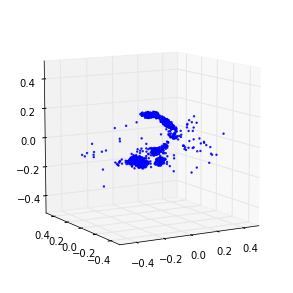

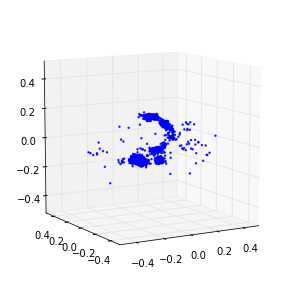

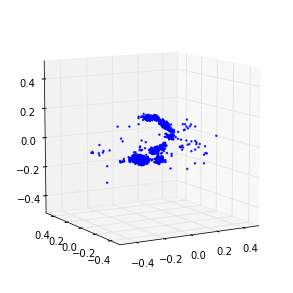

31 (-2072642.3034482759, -321858.3504849138) 38.6052670479
32 (-2405396.205172414, -294088.60560344829) 33.8412368298
33 (-2940911.3655172414, -256531.86637931035) 33.8022081852
34 (-3418933.3655172414, -466343.01885775861) 33.4494698048
35 (-3840080.0086206896, -431507.4073275862) 33.5457589626
36 (-4445520.3034482757, -557038.23221982759) 33.9504339695
37 (-5086162.8672413789, -800849.87877155177) 33.9196710587
38 (-5607333.4241379313, -1033448.4224137932) 33.5453488827
39 (-6456964.4293103451, -649431.37068965519) 33.8398451805
40 (-7035631.3913793107, -824621.62068965519) 33.9460630417
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-40 is not in all_model_checkpoint_paths. Manually adding it.


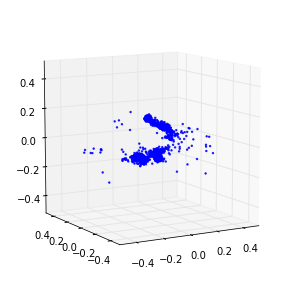

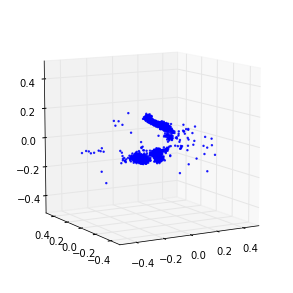

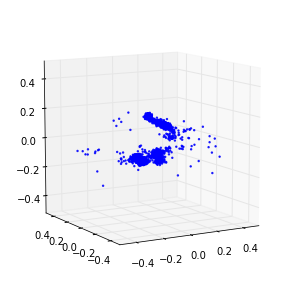

41 (-7956574.2586206896, -1445487.2532327587) 33.7979698181
42 (-8983339.6206896547, -1770441.3221982759) 33.6135189533
43 (-8731679.6793103442, -1929812.6422413792) 33.9333090782
44 (-10420964.406896552, -1326661.0387931035) 33.5586309433
45 (-10888216.720689654, -1695860.2133620689) 33.8033628464
46 (-11607737.289655173, -1233018.5484913792) 33.8858921528
47 (-12860682.106896551, -1779251.3965517241) 33.932186842
48 (-13195079.58275862, -1663107.6681034483) 33.5665440559
49 (-14306033.631034482, -235803.72629310345) 33.8033590317
50 (-15309205.344827587, -1260695.0301724137) 33.891628027
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-50 is not in all_model_checkpoint_paths. Manually adding it.


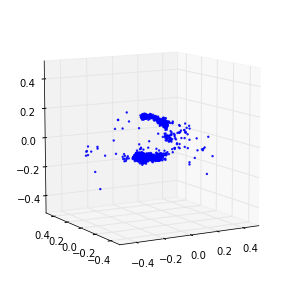

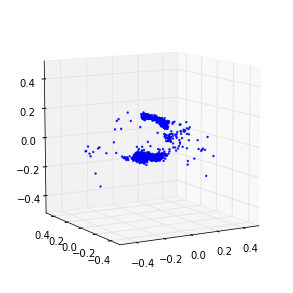

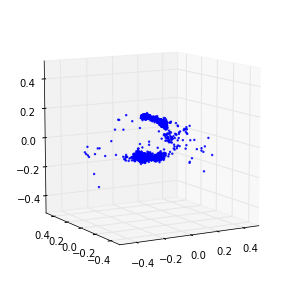

51 (-15946925.248275861, -2163593.9202586208) 33.6960120201
52 (-16668646.234482758, -310004.5301724138) 33.4990408421
53 (-17432725.124137931, -960076.18965517241) 33.91305089
54 (-18891237.955172412, -225638.80387931035) 33.9247970581
55 (-18706289.986206897, 779692.56034482759) 33.9354059696
56 (-19310217.424137931, -1319881.9353448276) 33.595279932
57 (-19503055.020689655, 2090201.9396551724) 33.9221539497
58 (-20987746.872413792, 4398183.8706896547) 33.8324668407
59 (-19880359.91724138, 5367019.8836206896) 34.0314011574
60 (-20726944.062068965, 2395205.4482758623) 33.6175379753
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-60 is not in all_model_checkpoint_paths. Manually adding it.


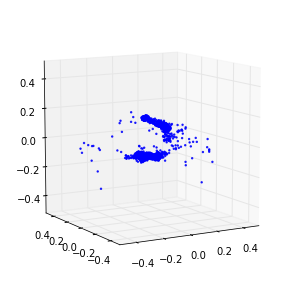

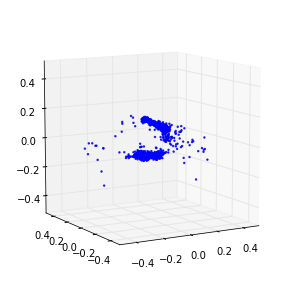

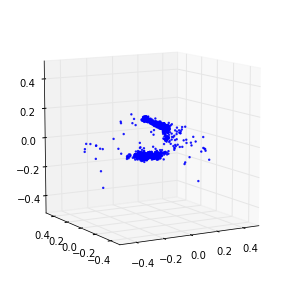

61 (-21358659.431034483, 4173723.9267241377) 33.6800808907
62 (-22053088.393103447, 7324030.2413793104) 33.8611969948
63 (-21269836.786206897, 6992373.7931034481) 33.6101880074
64 (-19977825.54137931, 6826192.193965517) 33.8507668972
65 (-21374960.572413795, 12416657.03663793) 33.8425080776
66 (-19845553.786206897, 14217058.051724138) 33.6674990654
67 (-20669806.770689655, 19347684.758620691) 33.9643008709
68 (-20068947.786206897, 14634775.146551725) 33.9264202118
69 (-19661956.95862069, 17316625.724137932) 34.9119868279
70 (-20372147.151724137, 16285785.155172413) 33.6060700417
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-70 is not in all_model_checkpoint_paths. Manually adding it.


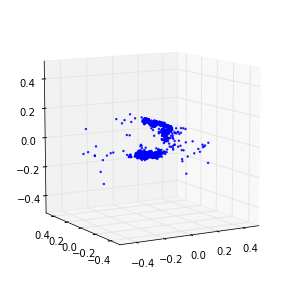

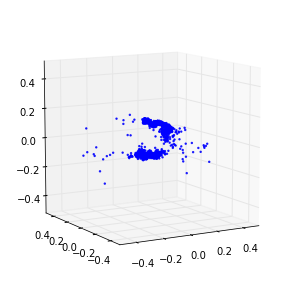

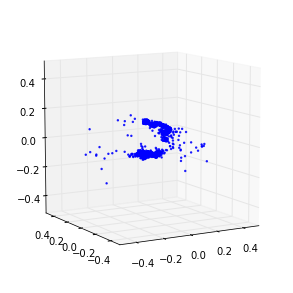

71 (-20636897.737931035, 24479085.275862068) 33.1740489006
72 (-17704378.808620691, 18694200.224137932) 34.3259220123
73 (-17072165.355172414, 23780873.689655174) 33.5636050701
74 (-14773797.068965517, 41787945.206896551) 34.3678359985
75 (-15983617.593103448, 44008879.379310347) 34.2102618217
76 (-16590326.68275862, 43822991.517241381) 34.2457311153
77 (-15359801.418965517, 50206961.034482762) 33.700758934
78 (-11066853.72413793, 63582432.482758619) 34.1959657669
79 (-11910492.572413793, 54212263.137931034) 33.6125400066
80 (-14263792.910344828, 57929851.793103449) 34.4524018764
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-80 is not in all_model_checkpoint_paths. Manually adding it.


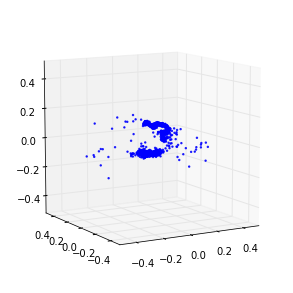

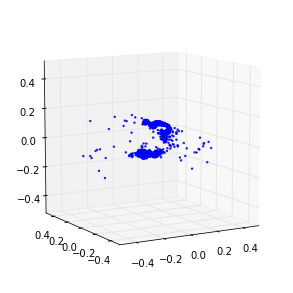

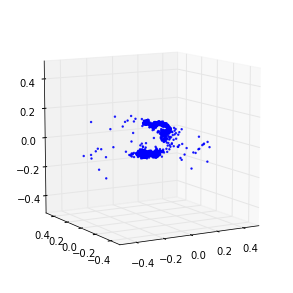

81 (-14399619.08275862, 57283678.206896551) 34.3986198902
82 (-10467186.018965518, 51923034.379310347) 34.2241361141
83 (-10021259.413793104, 61418814.344827585) 34.4041700363
84 (-6939233.5172413792, 78801966.896551728) 34.1932041645
85 (-12117508.634482758, 72072248.68965517) 34.630920887
86 (-7341333.8896551728, 80437372.413793102) 34.2992539406
87 (-5723499.2827586206, 83917828.275862068) 34.3106100559
88 (2296873.4896551725, 153663598.34482759) 34.47696805
89 (2459709.9034482758, 191504989.79310346) 34.3788950443
90 (-28448716.496551722, 142214051.03448275) 34.5633158684
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-90 is not in all_model_checkpoint_paths. Manually adding it.


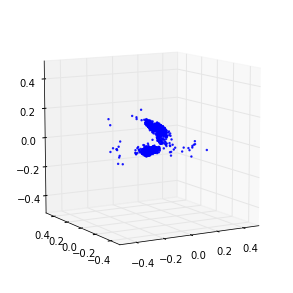

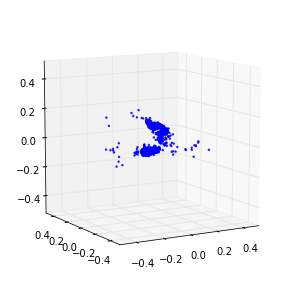

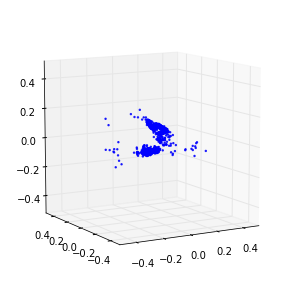

91 (-39690673.26896552, -18158985.810344826) 34.0785360336
92 (-33860839.793103449, -19967392.913793102) 34.3360879421
93 (-22889688.317241378, 7698890.0969827585) 34.274723053
94 (8433446.8413793109, 122237410.5862069) 34.3465671539
95 (2935545.2689655172, 155811713.65517241) 34.5632538795
96 (-1021990.4551724138, 151005494.06896552) 34.5528621674
97 (-56282.758620689652, 159798636.68965518) 34.3286869526
98 (131888.71724137932, 148382012.41379312) 34.4397058487
99 (-1303065.3793103448, 138422622.06896552) 34.3171389103
100 (1288969.875862069, 140966675.03448275) 34.3931188583
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-100 is not in all_model_checkpoint_paths. Manually adding it.


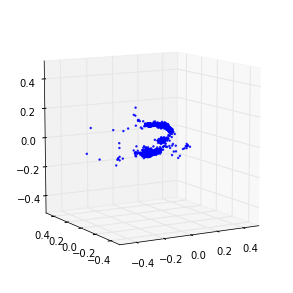

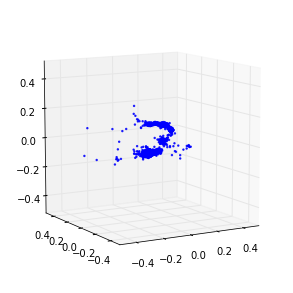

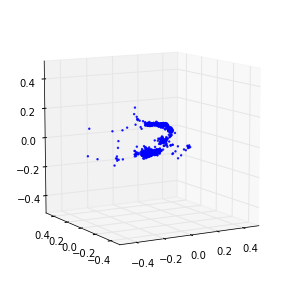

101 (-537633.6551724138, 150990762.20689654) 33.3143129349
102 (-2665040.6068965518, 138854580.41379312) 34.8022098541
103 (-2566418.1517241378, 155892779.03448275) 33.6438438892
104 (-4742186.2068965519, 167541254.62068966) 35.100315094
105 (-3060037.2413793104, 166374746.20689654) 33.6699130535
106 (-7247001.4896551725, 179828216.0) 35.2680439949
107 (-18534034.537931036, 189153881.65517241) 34.4990839958
108 (553274.48275862064, 177711271.72413793) 33.4011170864
109 (-126283.10603448276, -22113603.517241381) 34.1196920872
110 (1402513.7698275861, -1483619.1508620689) 34.3930997849
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-110 is not in all_model_checkpoint_paths. Manually adding it.


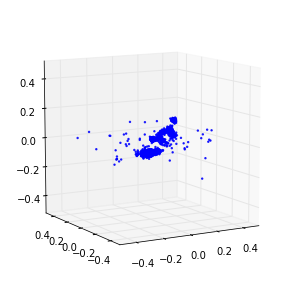

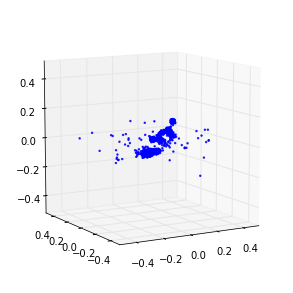

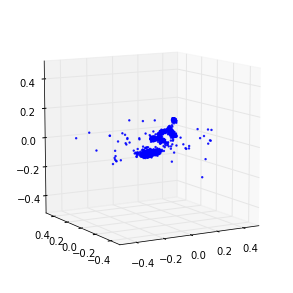

111 (-2734836.0344827585, 40474312.982758619) 33.8987109661
112 (-3356896.272413793, 37656143.258620687) 34.0089800358
113 (-2123380.8021551725, 21070121.327586208) 34.0883929729
114 (-3148138.3931034482, 54794703.482758619) 34.2343389988
115 (-2160915.8827586207, 42114631.760237068) 34.1433401108
116 (-7547241.1517241383, 13740122.70851293) 34.1640729904
117 (-5848611.6310344832, 35342019.896551721) 34.1985418797
118 (-9314440.1258620694, 2851326.5614224137) 34.1287679672
119 (-7392349.4413793106, -33874870.275862068) 34.0371570587
120 (-9063572.431034483, -30188527.344827585) 33.887609005
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-120 is not in all_model_checkpoint_paths. Manually adding it.


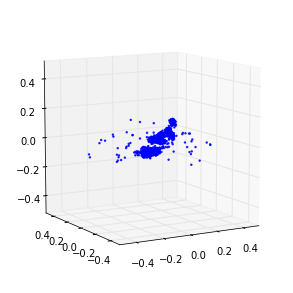

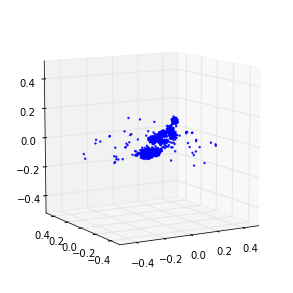

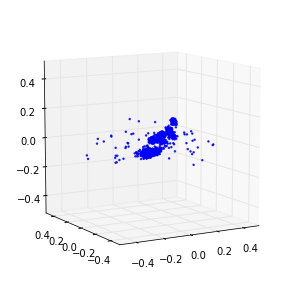

121 (-12935617.22413793, -41659095.392241381) 33.7814059258
122 (-2649326.7939655171, 7430733.6724137934) 34.016217947
123 (2183138.3931034482, -78893798.09806034) 33.8699021339
124 (-5553066.8137931032, -142209625.10344827) 34.1147060394
125 (-3435683.3655172414, -191556995.31034482) 34.0515699387
126 (-2349531.0344827585, -242910785.10344827) 33.9169399738
127 (-1778989.0206896551, -261634733.79310346) 33.9574620724
128 (-834159.66896551719, -276821020.13793105) 33.9785048962
129 (-1691729.2137931034, -276329865.37931037) 34.0943648815
130 (-1443910.2896551725, -279508558.34482759) 33.9890899658
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-130 is not in all_model_checkpoint_paths. Manually adding it.


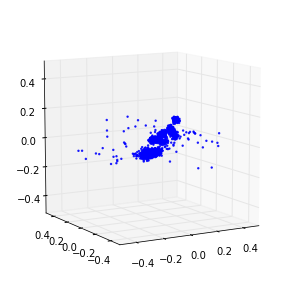

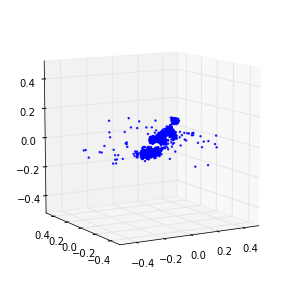

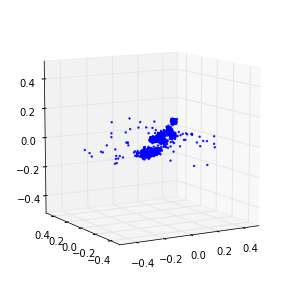

131 (-3398691.3103448274, -296895412.41379309) 33.7284269333
132 (-2939673.1586206895, -302648785.10344827) 33.8512539864
133 (-2360056.2758620689, -291652168.2758621) 34.1937282085
134 (-2936677.4068965516, -265592913.10344827) 34.0474879742
135 (-4197713.4344827589, -264012018.20689654) 33.8612968922
136 (-1364781.5724137931, -273241682.20689654) 33.9340109825
137 (-2512921.4896551725, -283832071.17241377) 33.8496899605
138 (-229295.22758620689, -283095406.34482759) 34.0212738514
139 (-4723030.5103448275, -280899452.68965518) 34.0618841648
140 (-2532745.1586206895, -280830320.0) 34.0839300156
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-140 is not in all_model_checkpoint_paths. Manually adding it.


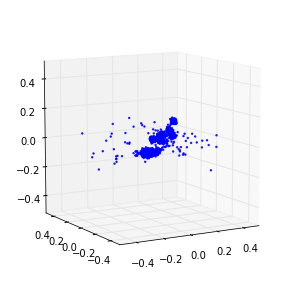

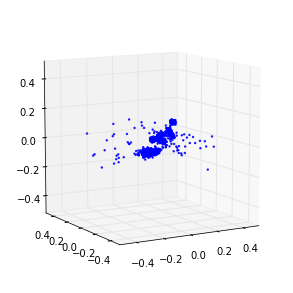

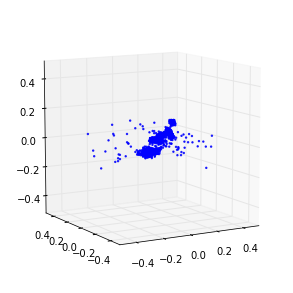

141 (-2542036.9655172415, -296493185.10344827) 33.5574438572
142 (-2872450.648275862, -292471967.44827586) 33.9244809151
143 (-5488491.6965517243, -268286194.75862068) 33.7553989887
144 (-4916704.5517241377, -264415043.31034482) 33.9459571838
145 (-5828782.8965517245, -255853231.44827586) 33.3381850719
146 (-6288651.8068965515, -282875790.34482759) 34.3700151443
147 (-6646379.9172413796, -269397264.0) 33.6882030964
148 (-7563065.3793103453, -281442648.2758621) 33.8561809063
149 (-7475301.8482758617, -278893768.2758621) 33.9060981274
150 (-7232036.9655172415, -278667828.96551722) 33.9487819672
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-150 is not in all_model_checkpoint_paths. Manually adding it.


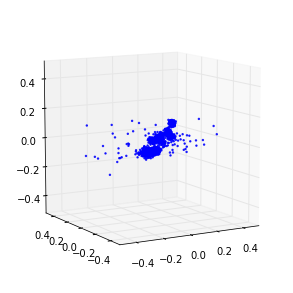

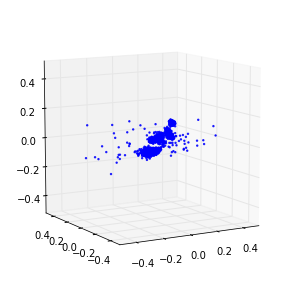

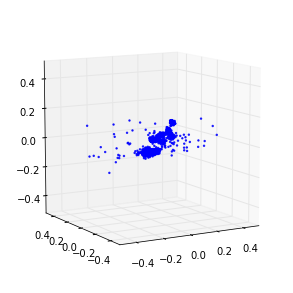

151 (-4596967.5034482758, -297071129.37931037) 33.5866630077
152 (-2675296.4413793106, -301636744.82758623) 33.8252470493
153 (-2085078.6206896552, -288655293.24137932) 33.9516499043
154 (-5454266.9793103449, -317484887.7241379) 33.8922829628
155 (-4620838.7448275862, -284534867.79310346) 33.9382650852
156 (-4814420.2137931036, -300105662.34482759) 33.9257261753
157 (-4622731.1448275866, -339874961.65517241) 33.75334692
158 (-8714609.6551724132, -329004018.20689654) 34.1960880756
159 (-7491591.1448275866, -229460496.34482759) 33.818073988
160 (-6725484.5793103445, -303781000.82758623) 33.8129348755
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-160 is not in all_model_checkpoint_paths. Manually adding it.


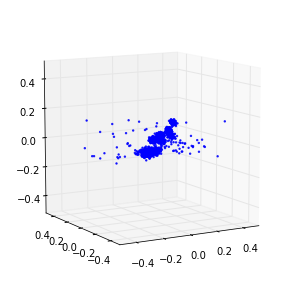

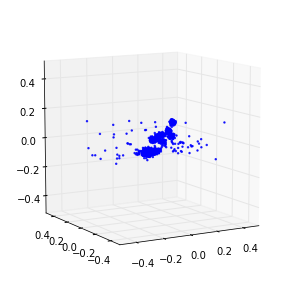

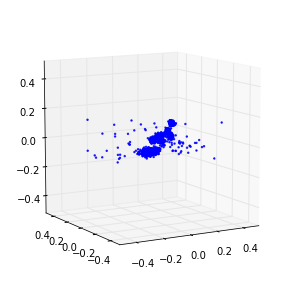

161 (-6861907.7517241379, -339039729.65517241) 33.6157040596
162 (-8426570.4965517242, -312626404.2758621) 33.8784198761
163 (-5679520.8051724136, -209438633.93103448) 34.0066819191
164 (-6596139.8620689651, -278752585.37931037) 33.9701700211
165 (-5422297.0482758619, -261684348.41379312) 33.9552810192
166 (-6262129.7379310345, -185196473.93103448) 33.7769649029
167 (-6152747.8068965515, -250891024.8275862) 33.8849210739
168 (-5502147.0896551721, -351832854.62068963) 33.9117441177
169 (-13930155.365517242, -397797390.89655173) 33.8391418457
170 (-15506266.427586207, -248095673.65517241) 34.2676239014
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-170 is not in all_model_checkpoint_paths. Manually adding it.


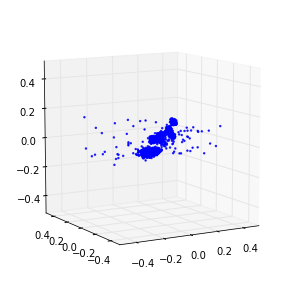

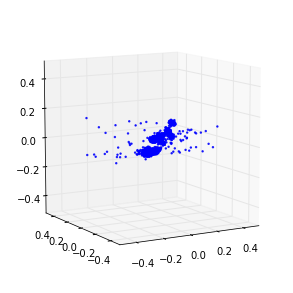

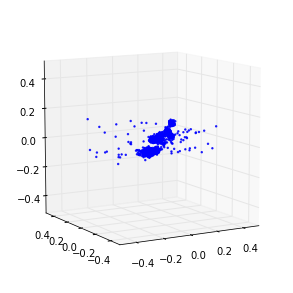

171 (-7026757.7931034481, -261394154.20689654) 33.563503027
172 (-5023342.1241379306, -268737655.44827586) 33.5011870861
173 (-6616577.8758620694, -392971928.2758621) 33.8986170292
174 (-5267621.296551724, -329802643.31034482) 33.9334869385
175 (-5846017.9862068966, -278116286.89655173) 33.8964788914
176 (-6789360.2206896553, -403291769.37931037) 33.8991229534
177 (-5618144.8827586211, -376444049.10344827) 34.2701609135
178 (-5550221.3517241376, -447956777.93103451) 33.8690259457
179 (-10276908.248275861, -426802637.79310346) 34.005646944
180 (-13894926.344827587, -377889565.24137932) 33.8904950619
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-180 is not in all_model_checkpoint_paths. Manually adding it.


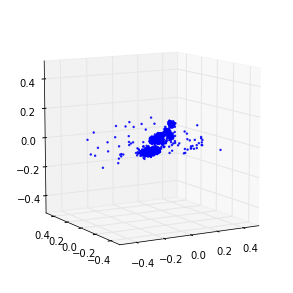

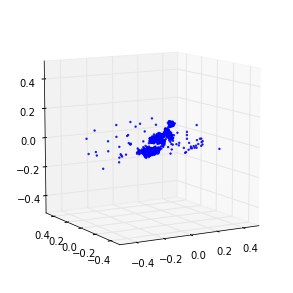

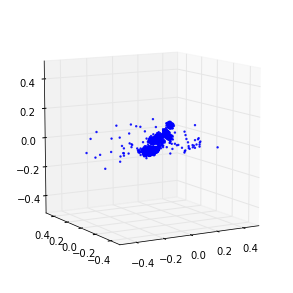

181 (-6994423.7931034481, -183791076.58620688) 33.6360108852
182 (-4223042.3517241376, -56637025.538793102) 33.8144640923
183 (-14861289.751724139, -166281739.86206895) 33.4192891121
184 (-4901805.7379310345, -240693137.93103448) 33.728659153
185 (-7828467.0896551721, -337910648.0) 33.9192430973
186 (-5384537.3793103453, -338605220.96551722) 34.1097791195
187 (-5859399.2827586206, -338458845.79310346) 34.1957039833
188 (-8267149.0206896551, -415655101.79310346) 33.9278440475
189 (-7985974.2896551723, -482427979.03448278) 33.8277440071
190 (-6345709.3517241376, -449517140.96551722) 33.830370903
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-190 is not in all_model_checkpoint_paths. Manually adding it.


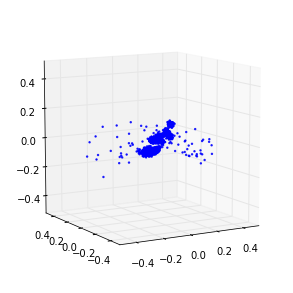

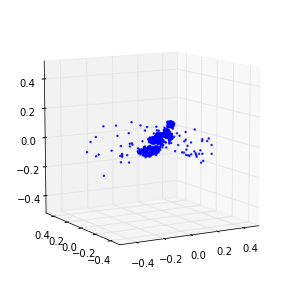

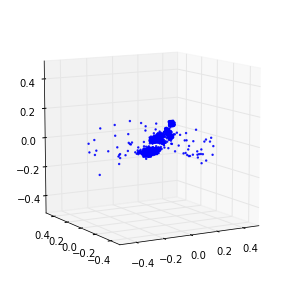

191 (-7557356.2482758621, -433348758.06896549) 33.8163440228
192 (-6045506.84137931, -337114663.44827586) 33.8475701809
193 (-5377385.9862068966, -361791347.58620691) 33.6874949932
194 (-4805602.2068965519, -410093148.68965518) 33.8311979771
195 (-4281420.0275862068, -430585826.20689654) 33.8048448563
196 (-4632086.068965517, -404597033.93103451) 34.0007679462
197 (-5389696.3310344825, -347788491.03448278) 33.9199540615
198 (-6083038.2344827587, -316610736.55172414) 34.0228760242
199 (-7772789.3517241376, -369861412.68965518) 33.8527991772
200 (-5375176.5793103445, -262721892.86206895) 34.055243969
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-200 is not in all_model_checkpoint_paths. Manually adding it.


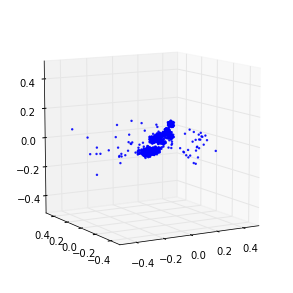

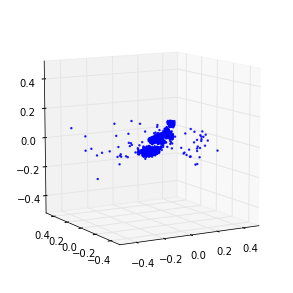

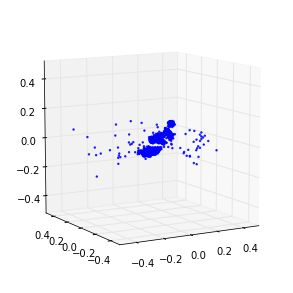

201 (-5170679.0206896551, -169249870.13793105) 33.7132399082
202 (-11784304.468965517, -184003345.65517241) 34.0010669231
203 (-12233932.532758621, -126114919.29310344) 33.7902710438
204 (-11942764.193103448, -229694521.24137932) 34.0005948544
205 (-6650057.9931034483, -207454602.89655173) 34.0139110088
206 (-8630057.6551724132, -388068037.24137932) 33.8376100063
207 (-8125821.2344827587, -277664361.44827586) 33.8107168674
208 (-3966956.772413793, -251554906.13793105) 34.2207779884
209 (-6973956.4344827589, -252421957.24137932) 33.8350849152
210 (-5089619.2465517242, -32630534.362068966) 33.9401230812
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-210 is not in all_model_checkpoint_paths. Manually adding it.


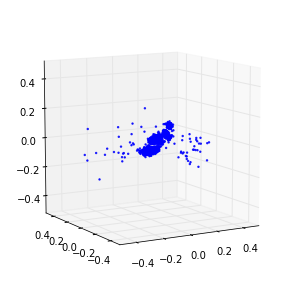

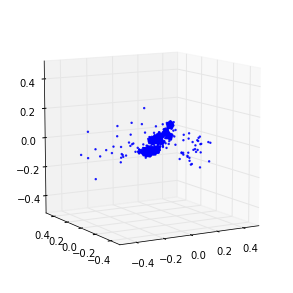

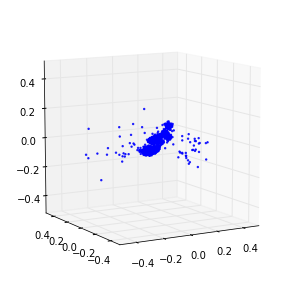

211 (-7571374.2413793104, -76963905.327586204) 33.7659349442
212 (-9298216.5137931034, 36990055.93965517) 34.1016190052
213 (-9627610.7620689664, 102899386.90948276) 34.0932149887
214 (-4741585.5965517238, 80749092.853448272) 34.0616209507
215 (-5421660.2922413796, 46755842.793103449) 34.6168310642
216 (-9148656.3103448283, -111255938.7974138) 34.0536310673
217 (-18704548.95862069, 36155737.137931034) 33.9272119999
218 (-11539780.668965517, 115001916.63793103) 33.9245319366
219 (-8152411.772413793, 36976369.965517238) 34.0812308788
220 (-7947676.4344827589, 368345304.0) 33.3810830116
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-220 is not in all_model_checkpoint_paths. Manually adding it.


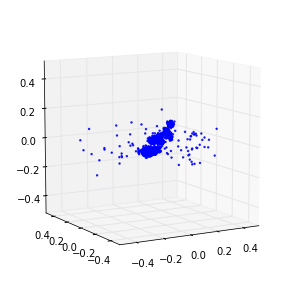

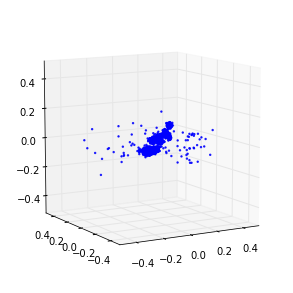

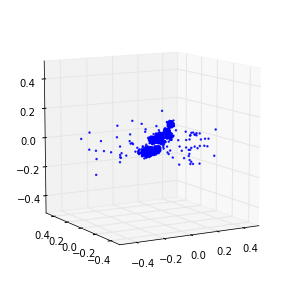

221 (-10444545.765517242, 422214002.20689654) 33.6646430492
222 (-11061326.248275861, 340034252.68965518) 33.8768789768
223 (-9788836.455172414, 297067570.34482759) 33.9681260586
224 (-9493326.7689655181, 171287297.20689654) 33.950909853
225 (-5628828.0413793102, 309324263.44827586) 34.3338901997
226 (-6616876.0965517238, 314948813.93103451) 34.0358958244
227 (-8139941.2137931036, 271602713.10344827) 34.7724220753
228 (-5577545.2310344828, 283374448.2241379) 34.0295388699
229 (-5823446.5655172411, 309199832.13793105) 33.8217840195
230 (-7178002.8137931032, 451900020.68965518) 34.1445140839
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-230 is not in all_model_checkpoint_paths. Manually adding it.


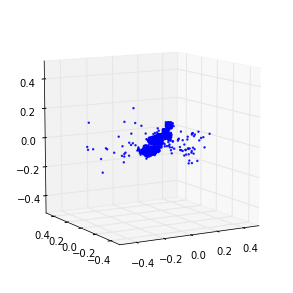

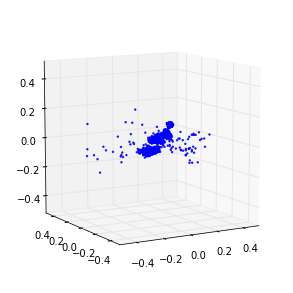

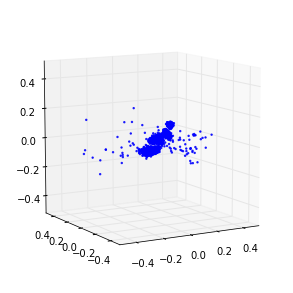

231 (-7682063.5862068962, 386021256.62068963) 33.8508350849
232 (-15851529.820689656, 468361171.86206895) 34.0922000408
233 (-16288375.303448277, 352539510.96551722) 34.6497759819
234 (-10095661.558620689, 299773834.48275864) 34.3683891296
235 (-6924799.4206896555, 369920590.89655173) 34.5828168392
236 (-9148666.4896551725, 231942776.8275862) 34.4773478508
237 (-10210484.693103448, 230318833.40948275) 34.1668908596
238 (-6976998.522413793, 99922652.206896558) 34.7492980957
239 (-6026635.1017241376, 3740775.0517241377) 34.4651591778
240 (-9576167.3120689653, -97691049.017241374) 34.3806538582
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-240 is not in all_model_checkpoint_paths. Manually adding it.


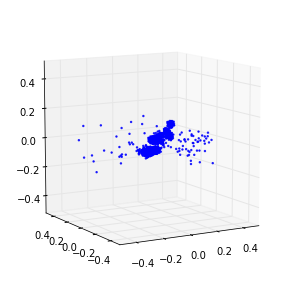

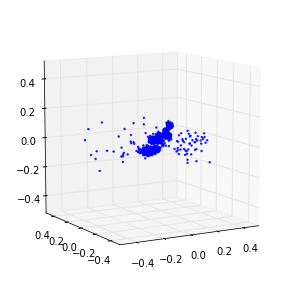

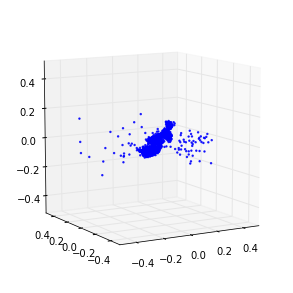

241 (-25001006.262068965, -268257830.34482759) 34.2796390057
242 (-4113037.4620689657, -135028492.46982759) 34.4590108395
243 (-7082745.9051724141, -21258682.825431034) 34.4966239929
244 (-8441113.0931034479, -37238974.288793102) 34.802560091
245 (-15427535.158620689, -106061689.93103448) 34.7040328979
246 (-7820755.7000000002, -73222763.206896558) 34.5649518967
247 (-4536970.6172413789, -74154427.724137932) 34.4998910427
248 (-10773627.156896552, -73701478.068965524) 34.8575739861
249 (-5764034.6508620689, -41327703.965517238) 34.4667599201
250 (-4279783.7189655174, 40992970.379310347) 34.3748679161
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-250 is not in all_model_checkpoint_paths. Manually adding it.


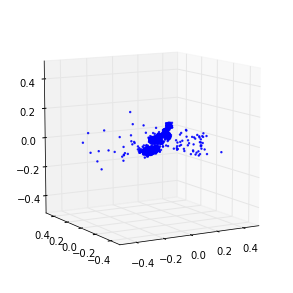

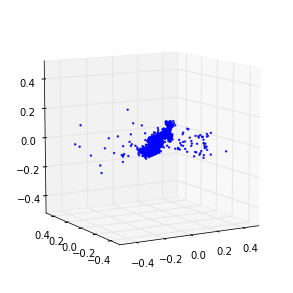

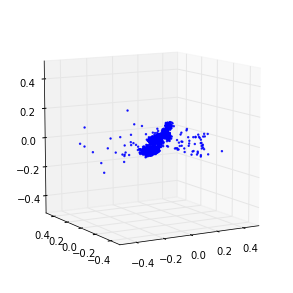

251 (-6934852.1758620692, 183050769.96551725) 34.3309140205
252 (-7915943.4206896555, 268621013.24137932) 34.5738248825
253 (-4431779.7758620689, 406947055.31034482) 34.5716850758
254 (-15831167.117241379, 717036105.93103445) 34.5532670021
255 (-8016066.2068965519, 680396564.96551728) 34.6036520004
256 (-8341681.6551724141, 507580509.79310346) 34.7698330879
257 (-7555810.4275862072, 493551268.41379309) 34.1185259819
258 (-7198973.3517241376, 551212044.68965518) 34.4227869511
259 (-10486919.282758621, 845917176.2758621) 34.414978981
260 (-6126148.6344827591, 947766834.75862074) 34.6918318272
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-260 is not in all_model_checkpoint_paths. Manually adding it.


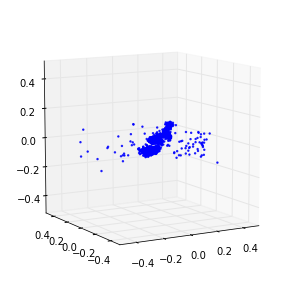

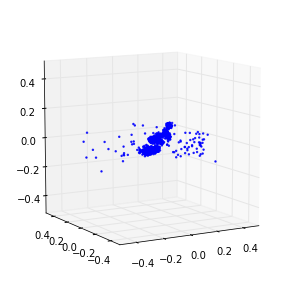

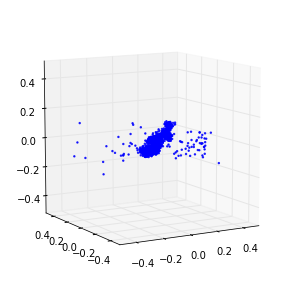

261 (-12226281.268965518, 960800890.48275864) 34.2576980591
262 (-11033800.165517241, 789307266.20689654) 34.558647871
263 (-10250748.027586207, 717184336.5517242) 34.5664348602
264 (-9973583.3379310351, 621372204.68965518) 34.3491871357
265 (-9292503.227586206, 497463069.51724136) 34.5521740913
266 (-4804177.9862068966, 671964909.24137926) 34.5044322014
267 (-6220178.0965517238, 913718223.4482758) 34.4709579945
268 (-5533380.6344827591, 934308036.41379309) 34.8090600967
269 (-2522220.1379310344, 953209827.31034482) 34.4406559467
270 (-5401097.2689655172, 976702865.65517247) 34.5848610401
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-270 is not in all_model_checkpoint_paths. Manually adding it.


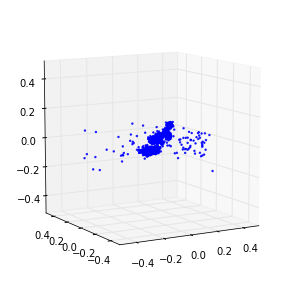

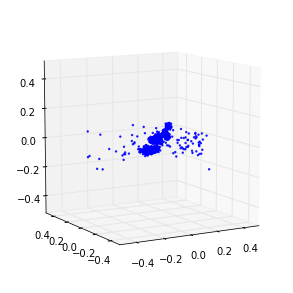

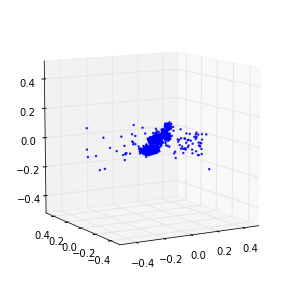

271 (-6704561.6551724141, 898467962.48275864) 34.3726480007
272 (-5072298.3724137926, 963463947.03448272) 34.6502218246
273 (-7060367.6689655175, 773603319.17241383) 34.6331651211
274 (-7174083.0896551721, 597219174.62068963) 34.5067548752
275 (-10674409.379310345, 612929833.93103445) 34.3944399357
276 (-5485744.772413793, 699654697.93103445) 34.5978360176
277 (-5394044.2482758621, 630334702.34482753) 35.0173618793
278 (-7361603.3103448274, 711749352.82758617) 34.4805409908
279 (-8281756.8620689651, 446817823.65517241) 34.6321630478
280 (-10129010.855172414, 156232563.65517241) 34.9119939804
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-280 is not in all_model_checkpoint_paths. Manually adding it.


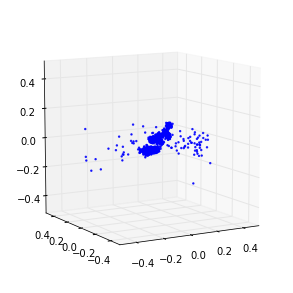

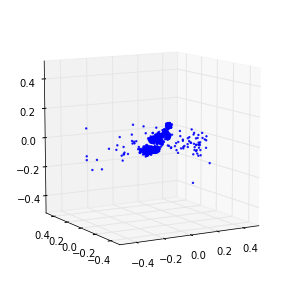

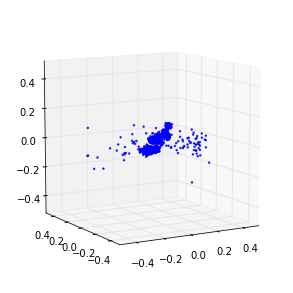

281 (-25314992.910344828, 135384263.15517241) 34.6354789734
282 (-3674969.6206896552, 248823917.72413793) 34.5811889172
283 (-1877034.324137931, 384136876.06896549) 34.7483680248
284 (-7598676.0827586204, 360036368.13793105) 34.956982851
285 (-6616633.3179956898, 388197320.12068963) 34.6550810337
286 (-7451867.2551724138, 492618969.37931037) 35.249890089
287 (-6570011.0206896551, 400672436.0) 34.645359993
288 (-7748984.5655172411, 271483431.35344827) 34.7709162235
289 (-10131492.253448276, 279209259.44827586) 34.8981370926
290 (-3372843.7655172413, 426628683.58620691) 34.6458311081
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-290 is not in all_model_checkpoint_paths. Manually adding it.


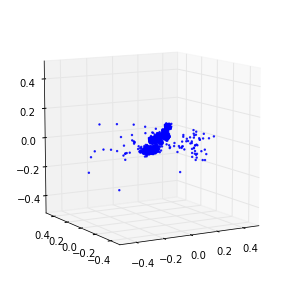

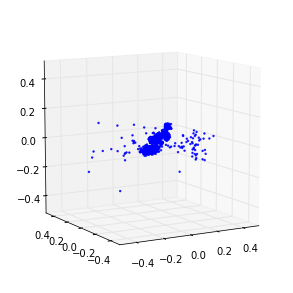

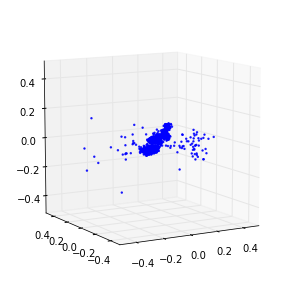

291 (-7614393.455172414, 266953558.10344827) 34.5834538937
292 (-11853959.862068966, 511914850.20689654) 34.4054698944
293 (-11013415.944827586, 810038272.0) 34.5221920013
294 (-3005139.420689655, 989002107.58620691) 34.1050999165
295 (-52746030.124137931, 736686849.10344827) 34.4514188766
296 (-7662931.8068965515, 716917116.13793099) 34.4939448833
297 (-29028166.67586207, 608904630.62068963) 34.5619449615
298 (-40810733.600000001, 846746867.03448272) 34.5303499699
299 (-4106552.0551724136, 1047446605.2413793) 34.5885779858
300 (-33666136.937931031, 1175615918.3448277) 34.5981521606
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-300 is not in all_model_checkpoint_paths. Manually adding it.


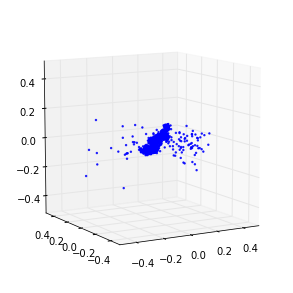

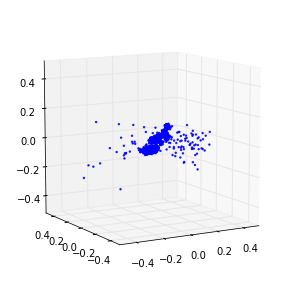

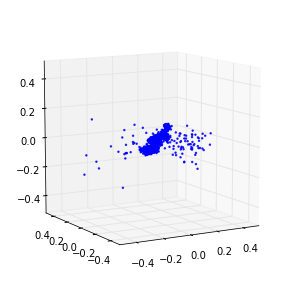

301 (-7894160.3310344825, 1070263051.0344827) 34.5061571598
302 (-9337607.0620689653, 1644009577.9310346) 34.7214770317
303 (-25663903.779310346, 1793299641.3793104) 34.5265948772
304 (-11278361.6, 1804866454.0689654) 34.5274910927
305 (-6273252.6344827591, 1874502603.0344827) 34.2495298386
306 (-5112056.9379310347, 1837131361.1034484) 34.4303309917
307 (-5335315.4206896555, 1898263631.4482758) 34.8418340683
308 (-6266621.3517241376, 1848896653.2413793) 34.562969923
309 (-15717339.806896552, 1935341431.1724138) 34.7446320057
310 (-3885172.5241379309, 1921195520.0) 35.1302781105
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-310 is not in all_model_checkpoint_paths. Manually adding it.


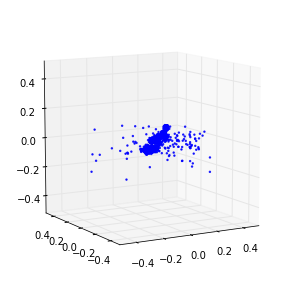

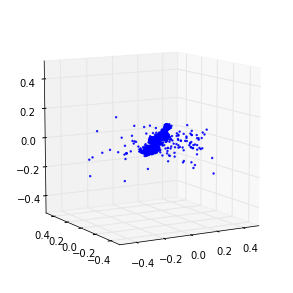

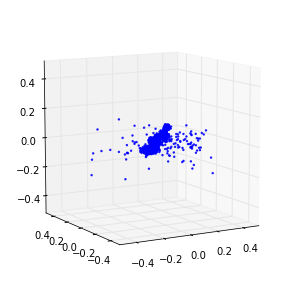

311 (-5729402.703448276, 1877232392.8275862) 34.6583590508
312 (-6403046.4000000004, 1857968251.5862069) 34.4807670116
313 (-514296.05517241382, 1880371787.0344827) 34.7950279713
314 (-3876450.8689655173, 1782636182.0689654) 34.8065109253
315 (-1460049.2137931034, 1895871642.4827585) 34.8071250916
316 (-670763.25517241377, 1833420548.4137931) 35.4421889782
317 (-3043733.1862068963, 1677553321.9310346) 34.7395329475
318 (-1531413.6275862069, 1741824940.1379311) 34.8888299465
319 (-5532225.3241379308, 1734731802.4827585) 34.6346759796
320 (-1697844.9655172413, 1742828835.3103449) 34.6695549488
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-320 is not in all_model_checkpoint_paths. Manually adding it.


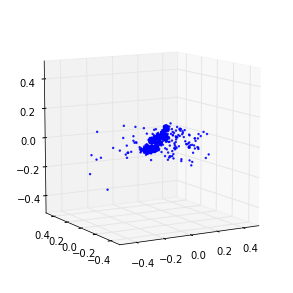

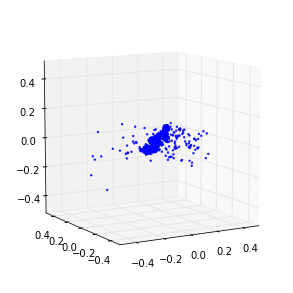

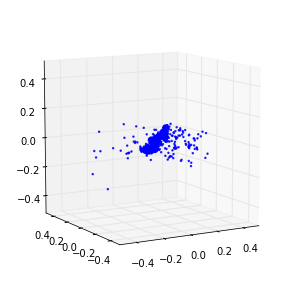

321 (-3523690.8137931037, 1675720297.9310346) 34.4943540096
322 (-1572825.1586206898, 1739804032.0) 34.5215878487
323 (-2175287.6137931035, 1602996082.7586207) 34.5405550003
324 (-4905135.6689655175, 1624815020.1379311) 34.4931621552
325 (-5958452.9655172415, 1608278739.8620689) 34.4013900757
326 (-81151.11724137931, 1598449584.5517242) 34.8121628761
327 (-4443253.4068965521, 1613281544.8275862) 34.2774629593
328 (-7142445.4620689657, 1567413841.6551723) 34.601788044
329 (-8391026.7586206906, 1635426281.9310346) 34.6301598549
330 (-22162371.089655172, 1603761774.3448277) 34.3623569012
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-330 is not in all_model_checkpoint_paths. Manually adding it.


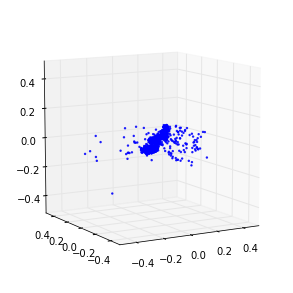

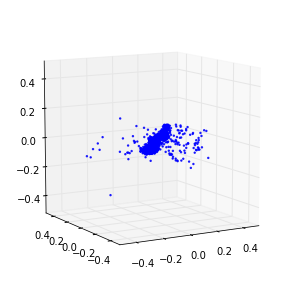

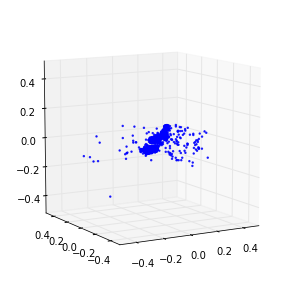

331 (-35709729.544827588, 1748401677.2413793) 34.5055918694
332 (-10292002.427586207, 1689708601.3793104) 34.1342358589
333 (-12513991.503448276, 1474443700.9655173) 34.5915780067
334 (-7671086.3448275859, 1641906109.7931035) 34.9786338806
335 (-5368190.2344827587, 1647939328.0) 34.4319961071
336 (-5767245.6827586209, 1602111929.3793104) 34.2943089008
337 (-3563190.7310344828, 1594688229.5172415) 34.7557079792
338 (-3460600.9379310347, 1543878400.0) 34.4038281441
339 (-2625317.9586206898, 1557045910.0689654) 34.5679700375
340 (-5803798.9517241381, 1615777310.8965516) 34.6210329533
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-340 is not in all_model_checkpoint_paths. Manually adding it.


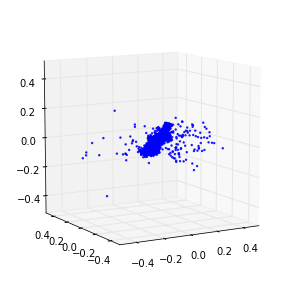

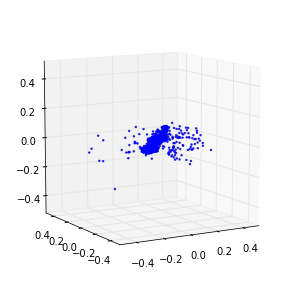

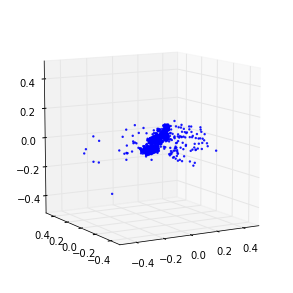

341 (-4571070.6758620692, 1579948049.6551723) 34.1086080074
342 (-6411770.703448276, 1589393129.9310346) 34.5314509869
343 (-770186.59310344828, 1535068460.1379311) 34.4784817696
344 (-1933491.6413793103, 1494679291.5862069) 34.546225071
345 (-3386641.6551724137, 1514988054.0689654) 34.4574811459
346 (-1392483.7517241379, 1436355738.4827585) 34.7114219666
347 (-4156036.8551724139, 1452392944.5517242) 35.0375847816
348 (98735.227586206893, 1474576620.1379311) 34.7669548988
349 (-4211334.6206896547, 1421928862.8965516) 35.0035030842
350 (-1520595.4206896552, 1447370659.3103449) 34.5664768219
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-350 is not in all_model_checkpoint_paths. Manually adding it.


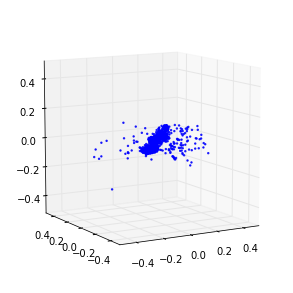

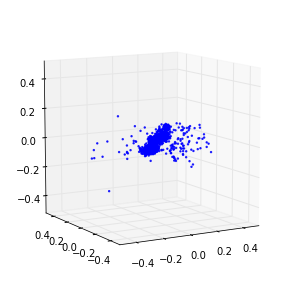

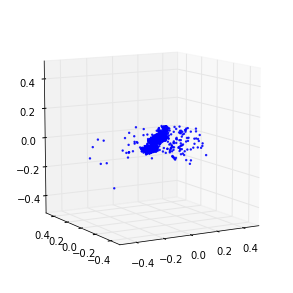

351 (-5115236.6344827591, 1398177092.4137931) 34.4023160934
352 (-2542326.2896551723, 1423072304.5517242) 34.4740869999
353 (-3280763.1448275861, 1433451358.8965516) 34.4877870083
354 (-709296.9931034483, 1431429508.4137931) 34.6954379082
355 (-529352.82758620684, 1471139398.6206896) 34.4609861374
356 (-251078.62068965516, 1421698138.4827585) 34.6356730461
357 (96288.66206896551, 1397685779.8620689) 34.7161650658
358 (376216.71724137932, 1445649434.4827585) 34.4929478168
359 (-801723.14482758625, 1351123820.1379311) 34.7230379581
360 (34212.634482758622, 1433649600.0) 34.6852331161
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-360 is not in all_model_checkpoint_paths. Manually adding it.


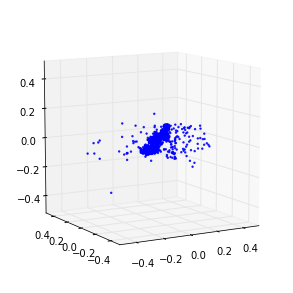

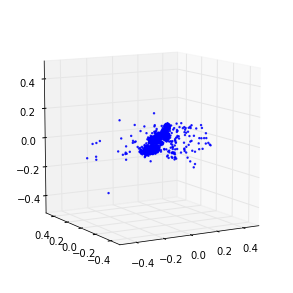

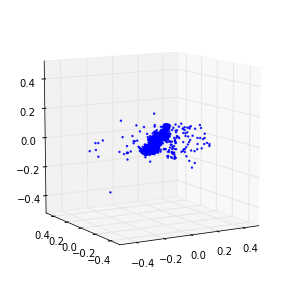

361 (-1324432.3310344827, 1426708082.7586207) 34.2559988499
362 (1237699.0896551723, 1392602070.0689654) 34.4659278393
363 (2302540.3586206897, 1372619665.6551723) 34.6945841312
364 (609263.22758620686, 1410178345.9310346) 34.7008581161
365 (2179470.124137931, 1493617756.6896551) 34.8493199348
366 (-979257.37931034481, 1403297743.4482758) 34.8295891285
367 (3136917.1862068963, 1423973022.8965516) 34.4573688507
368 (-485521.21379310347, 1532592851.8620689) 34.4815130234
369 (2086258.7586206896, 1400209683.8620689) 34.4795510769
370 (-2947282.0965517242, 1526972020.9655173) 34.6351811886
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-370 is not in all_model_checkpoint_paths. Manually adding it.


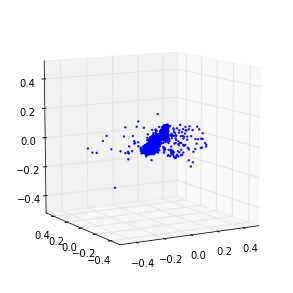

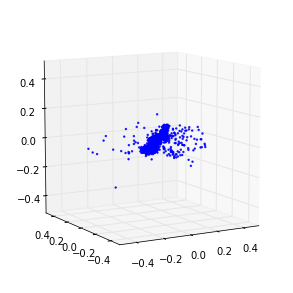

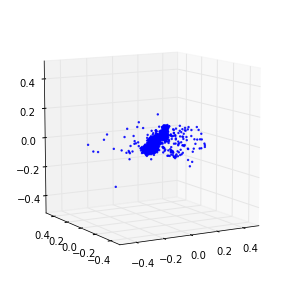

371 (5722136.2758620689, 1378464119.1724138) 35.0797162056
372 (-1345840.1103448276, 1543716627.8620689) 35.1654620171
373 (2381805.0206896551, 1385694232.275862) 34.9175779819
374 (7224769.3241379308, 1433344900.4137931) 34.8025989532
375 (-728919.39310344832, 1516831020.1379311) 34.8548810482
376 (-281048.71724137932, 1560884096.0) 35.3488869667
377 (-2544353.1034482759, 1593764329.9310346) 35.0388059616
378 (-862938.04137931031, 1543306712.275862) 34.53667593
379 (-4670933.6275862074, 1536078923.0344827) 35.0447320938
380 (-602948.85517241375, 1481679991.1724138) 34.818226099
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-380 is not in all_model_checkpoint_paths. Manually adding it.


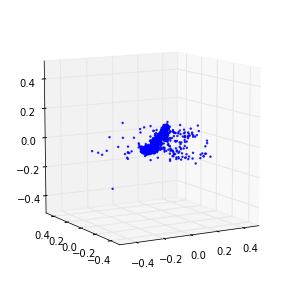

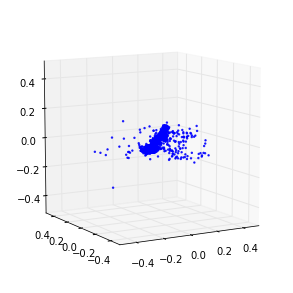

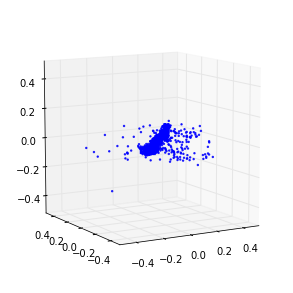

381 (-593994.15172413795, 1482733060.4137931) 34.2522330284
382 (-9208135.0620689653, 1494305986.2068965) 34.5863289833
383 (-2115176.1655172412, 1510757115.5862069) 35.3866271973
384 (-2211372.1379310344, 1487468769.1034484) 38.9399189949
385 (-2747926.0689655175, 1459289785.3793104) 37.047796011
386 (-4461258.1517241383, 1548374784.0) 36.3062181473
387 (-3582462.2344827587, 1522320706.2068965) 34.7694509029
388 (-916356.41379310342, 1512089873.6551723) 35.052929163
389 (-1275593.2689655172, 1533053342.8965516) 34.7456488609
390 (-1926510.3448275863, 1502130480.5517242) 34.639193058
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-390 is not in all_model_checkpoint_paths. Manually adding it.


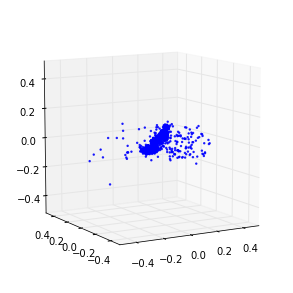

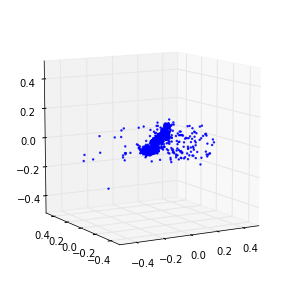

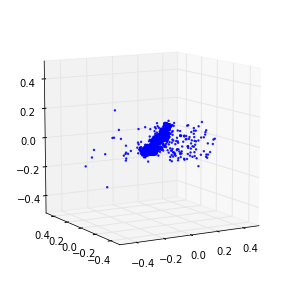

391 (-624167.72413793101, 1538699784.8275862) 34.4212300777
392 (-3776143.0068965517, 1540540742.6206896) 36.466397047
393 (-3982353.6551724137, 1582587215.4482758) 35.037350893
394 (-4112754.7586206896, 1613779182.3448277) 34.4622628689
395 (418808.93793103448, 1653991887.4482758) 34.7282991409
396 (909812.52413793106, 1681407108.4137931) 34.8425321579
397 (-1874851.3103448276, 1630741208.275862) 34.9645740986
398 (-1329653.4068965518, 1665183377.6551723) 34.6708509922
399 (-1116825.6000000001, 1609561467.5862069) 34.9777770042
400 (-921952.22068965517, 1520599106.2068965) 34.9075479507
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-400 is not in all_model_checkpoint_paths. Manually adding it.


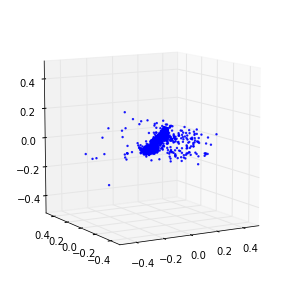

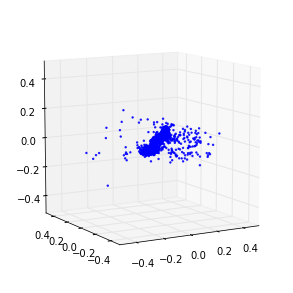

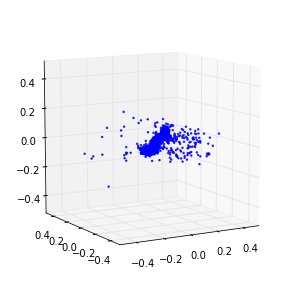

401 (-56976.7724137931, 1495333548.1379311) 34.8179368973
402 (-344954.70344827586, 1467612919.1724138) 34.6959061623
403 (-2045648.3310344827, 1484341168.5517242) 34.5929849148
404 (-2032915.4206896552, 1430775578.4827585) 34.7144799232
405 (-1960299.6965517241, 1452443842.2068965) 34.6566820145
406 (-1513330.3172413793, 1491554074.4827585) 34.4239091873
407 (635712.44137931033, 1411607035.5862069) 34.5994439125
408 (-2562169.8206896554, 1453688779.0344827) 35.1344988346
409 (-2424327.9448275864, 1498928242.7586207) 34.6337990761
410 (-2178842.4827586208, 1514485499.5862069) 34.6879599094
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-410 is not in all_model_checkpoint_paths. Manually adding it.


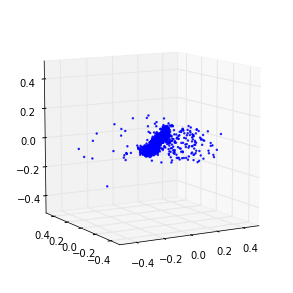

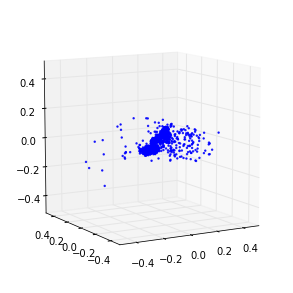

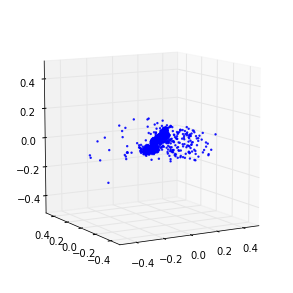

411 (-2472215.8344827588, 1507188060.6896551) 35.2544000149
412 (-2427389.351724138, 1576921167.4482758) 34.8157219887
413 (-3376622.3448275863, 1559285323.0344827) 34.7026519775
414 (-1291630.3448275863, 1554751986.7586207) 34.8695299625
415 (-833801.71034482762, 1585781530.4827585) 35.1087040901
416 (-1278823.2827586208, 1621196137.9310346) 34.8619110584
417 (-2681259.2551724138, 1667735812.4137931) 35.0116000175
418 (-988212.96551724139, 1679978676.9655173) 35.0026881695
419 (-905951.3379310345, 1738649533.7931035) 34.9627377987
420 (-705245.57241379307, 1695255768.275862) 34.7955160141
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-420 is not in all_model_checkpoint_paths. Manually adding it.


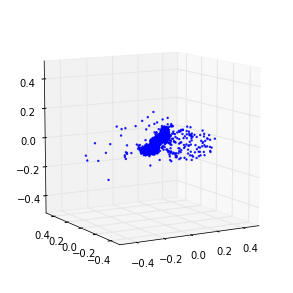

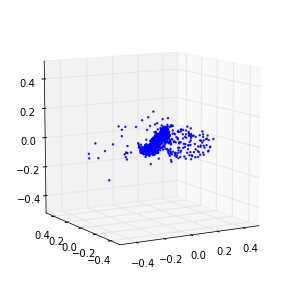

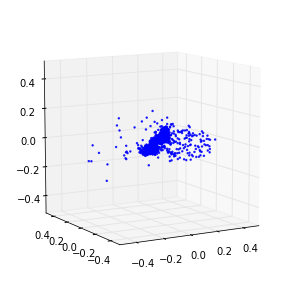

421 (-1699832.0551724138, 1627187120.5517242) 34.6131770611
422 (-2110757.9586206898, 1666781078.0689654) 37.0723388195
423 (-1743052.8, 1609111538.7586207) 34.9875020981
424 (-602927.66896551719, 1630353399.1724138) 35.0897500515
425 (-2330982.3999999999, 1774074076.6896551) 34.9958589077
426 (-797727.77931034483, 1757070013.7931035) 35.0142049789
427 (-718856.82758620684, 1728475056.5517242) 34.7023899555
428 (-1474252.8, 1721842908.6896551) 34.9573459625
429 (-757958.62068965519, 1733847300.4137931) 34.7398850918
430 (-917551.66896551719, 1668573144.275862) 34.964261055
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-430 is not in all_model_checkpoint_paths. Manually adding it.


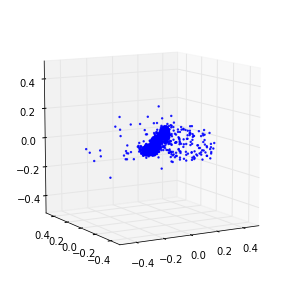

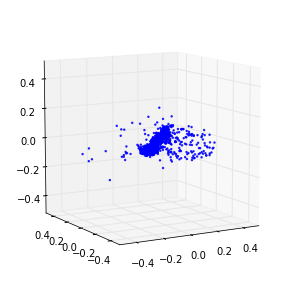

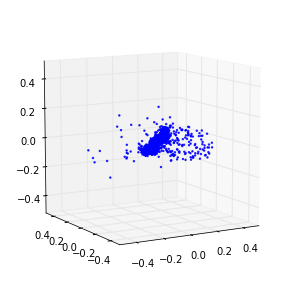

431 (-1158205.7931034483, 1684526199.1724138) 37.0298500061
432 (-1970466.4275862069, 1639903465.9310346) 34.936041832
433 (-1290295.6137931035, 1606235996.6896551) 34.774990797
434 (-1332725.4068965518, 1661205248.0) 35.1692728996
435 (-1144527.448275862, 1701794992.5517242) 34.9712250233
436 (-1581622.7310344828, 1716191139.3103449) 34.9382429123
437 (-528716.80000000005, 1780386158.3448277) 34.9340310097
438 (-781640.38620689651, 1818660153.3793104) 34.9508650303
439 (-2701026.8689655173, 1816849231.4482758) 34.8137691021
440 (-2332708.1931034485, 1902378072.275862) 34.9556751251
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-440 is not in all_model_checkpoint_paths. Manually adding it.


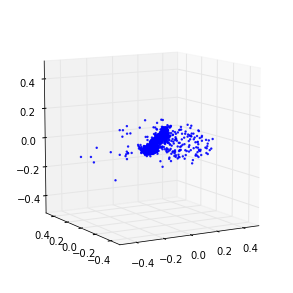

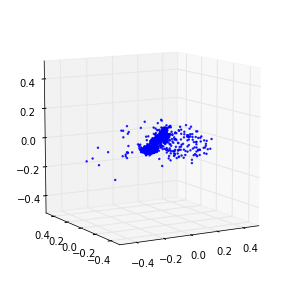

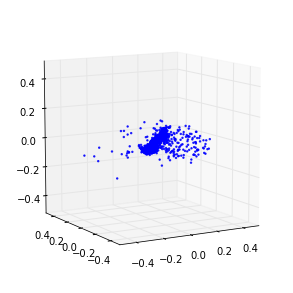

441 (-4133205.6275862069, 1936747166.8965516) 34.8617341518
442 (-1696589.6827586207, 1983087916.1379311) 35.151362896
443 (-902454.73103448271, 1970910384.5517242) 34.5650210381
444 (-5327193.15862069, 1914582086.6206896) 34.7737791538
445 (4421454.5655172411, 1857424688.5517242) 34.6713371277
446 (-13831772.689655172, 1946148162.2068965) 34.9197039604
447 (-5454744.7172413794, 1882130595.3103449) 34.9312679768
448 (-7635094.9517241381, 1882872523.0344827) 34.8040149212
449 (-5177075.6413793107, 1963532813.2413793) 34.7681050301
450 (-4037239.1724137929, 1957129873.6551723) 34.9737458229
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-450 is not in all_model_checkpoint_paths. Manually adding it.


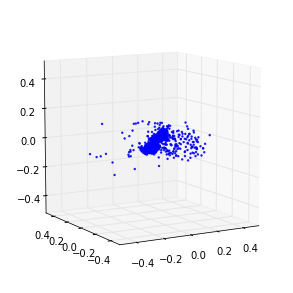

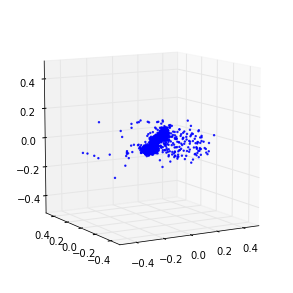

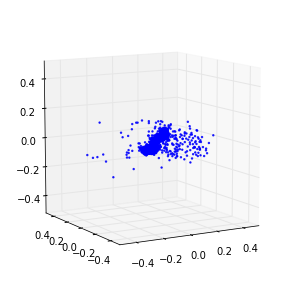

451 (-6812863.5586206894, 1874712364.1379311) 34.6005189419
452 (-1836719.6689655173, 1850482436.4137931) 34.8988919258
453 (-5237865.0482758619, 1790132312.275862) 34.7450609207
454 (-2019505.4344827586, 1710390430.8965516) 34.8287141323
455 (-606268.91034482757, 1679072264.8275862) 35.0151979923
456 (-853383.06206896552, 1717682317.2413793) 35.1531448364
457 (-468133.95862068963, 1656721708.1379311) 34.8246519566
458 (-1700262.8413793102, 1658946771.8620689) 34.9587788582
459 (-1212272.1103448276, 1719134998.0689654) 35.0846681595
460 (-2771470.124137931, 1672964616.8275862) 34.7793989182
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-460 is not in all_model_checkpoint_paths. Manually adding it.


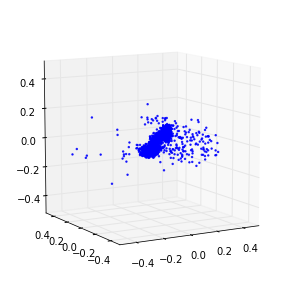

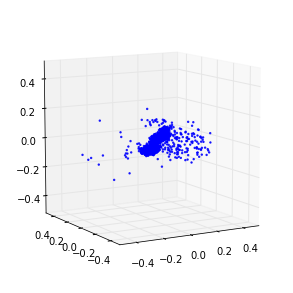

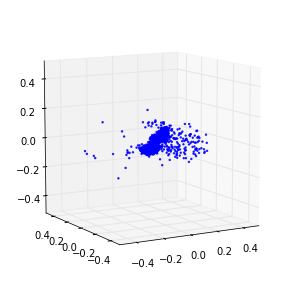

461 (-1536972.8, 1690646377.9310346) 34.6225328445
462 (-770479.66896551719, 1693789947.5862069) 35.4063508511
463 (-784369.87586206896, 1689278455.1724138) 34.670691967
464 (-1116955.3655172414, 1690272291.3103449) 34.7339398861
465 (-2503523.7517241379, 1719086375.724138) 34.8752951622
466 (-2525820.4689655174, 1641461843.8620689) 35.0240628719
467 (-2046868.3034482759, 1682018396.6896551) 37.7762949467
468 (-5808824.4965517242, 1666841675.0344827) 35.1485860348
469 (-2178806.2896551723, 1647339144.8275862) 37.2054419518
470 (-4710099.8620689651, 1661703362.2068965) 34.6820600033
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-470 is not in all_model_checkpoint_paths. Manually adding it.


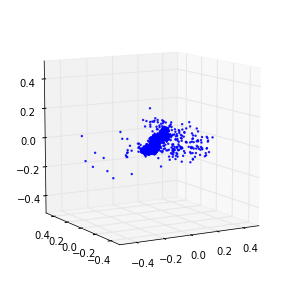

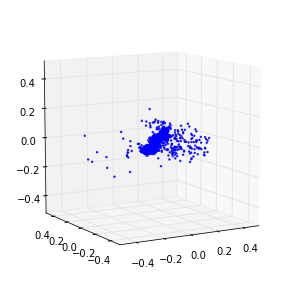

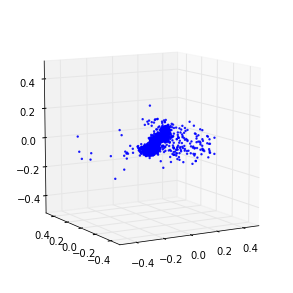

471 (-1244378.9241379311, 1690864856.275862) 35.0513501167
472 (-2664523.9172413792, 1695606038.0689654) 37.4680719376
473 (-2154274.4275862067, 1637699204.4137931) 34.9771499634
474 (-6696719.0068965517, 1689812766.8965516) 34.9628720284
475 (-8893605.9586206898, 1670867350.0689654) 35.0074691772
476 (-3547192.4965517242, 1660364817.6551723) 35.0783069134
477 (-3754993.875862069, 1649368015.4482758) 34.9339439869
478 (-6004451.7517241379, 1710113240.275862) 34.9455111027
479 (-1362814.2344827587, 1747976787.8620689) 34.9629731178
480 (-1941804.1379310344, 1735743823.4482758) 34.9097139835
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-480 is not in all_model_checkpoint_paths. Manually adding it.


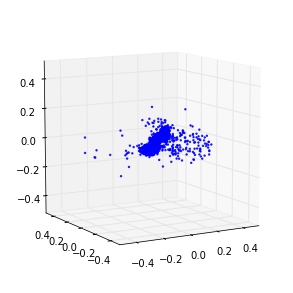

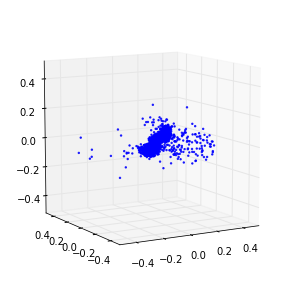

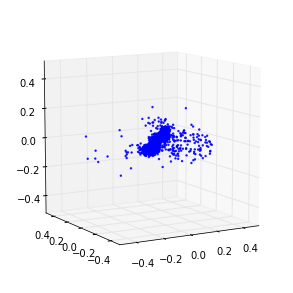

481 (-877750.73103448271, 1801312331.0344827) 34.5401120186
482 (-2876220.0275862068, 1805798117.5172415) 35.0903720856
483 (-2484761.6000000001, 1892775936.0) 35.2470788956
484 (-3706886.1793103446, 1899177026.2068965) 35.0508151054
485 (-783104.88275862066, 1916162648.275862) 35.2172160149
486 (-2913499.8068965515, 1899977948.6896551) 35.0636558533
487 (-4795938.4275862072, 1988019239.724138) 34.7800338268
488 (-1875279.448275862, 1938581861.5172415) 35.5428421497
489 (-2193347.0896551725, 1928836744.8275862) 37.1069569588
490 (-1086438.3999999999, 1905827681.1034484) 34.8161230087
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-490 is not in all_model_checkpoint_paths. Manually adding it.


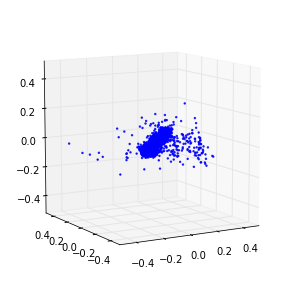

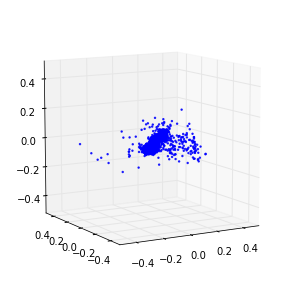

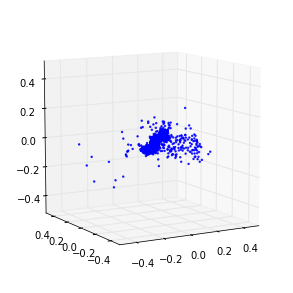

491 (-3962410.3724137931, 1816377869.2413793) 34.5836188793
492 (-3979847.5034482758, 1823777085.7931035) 35.3347220421
493 (-4990732.3586206893, 1841091200.0) 34.7011008263
494 (-4183733.8482758622, 1821332881.6551723) 35.085599184
495 (-2285972.3034482757, 1886735752.8275862) 35.4067180157
496 (-2426666.3724137931, 1893726468.4137931) 35.0726749897
497 (-2430781.7931034481, 1867767821.2413793) 35.0327949524
498 (-9932679.9448275864, 1966694558.8965516) 35.3728017807
499 (-1145488.772413793, 2089334580.9655173) 34.9283828735
500 (-2929362.9793103449, 2117751750.6206896) 34.8907659054
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-500 is not in all_model_checkpoint_paths. Manually adding it.


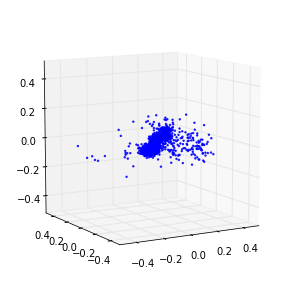

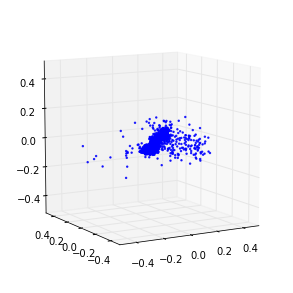

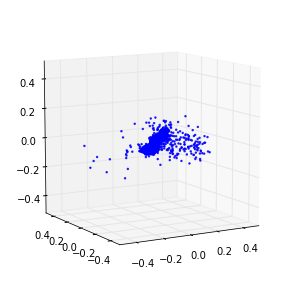

501 (-2584927.3379310346, 2173990708.965517) 35.2355499268
502 (-1385806.5655172414, 2133697580.1379311) 34.8147220612
503 (-1613036.5793103448, 2145621009.6551723) 35.0628540516
504 (-1380613.2965517242, 2168485287.7241378) 35.1335549355
505 (-1804581.0758620689, 2124528957.7931035) 35.4368288517
506 (-2174620.2482758621, 2140273350.6206896) 35.3171000481
507 (-1696783.8896551724, 2183659714.2068968) 35.1891319752
508 (-1431809.7655172413, 2201464571.5862069) 35.2187168598
509 (-2282770.5379310343, 2141858202.4827585) 35.0498900414
510 (-2887333.0758620691, 2166097028.4137931) 34.912624836
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-510 is not in all_model_checkpoint_paths. Manually adding it.


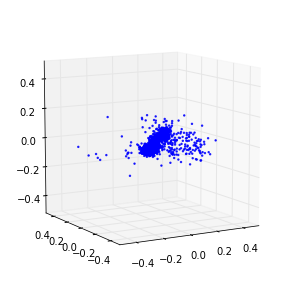

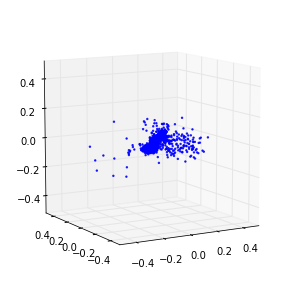

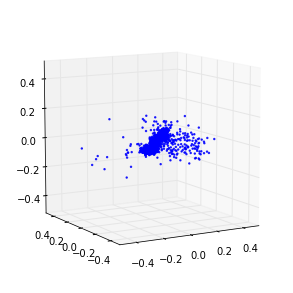

511 (-2787588.4137931033, 2084632081.6551723) 35.2079498768
512 (-2963781.7379310345, 2021796148.9655173) 35.239082098
513 (-4383818.1517241383, 2019979175.724138) 34.6102459431
514 (-3169985.3241379312, 2104211438.3448277) 39.7490780354
515 (-3417372.2482758621, 2145419828.9655173) 37.3270249367
516 (-4271443.8620689651, 2191157693.7931032) 34.8587019444
517 (-3951273.4896551725, 2140974190.3448277) 34.8652341366
518 (-1744451.9724137932, 2155118887.7241378) 34.5460760593
519 (-1876687.448275862, 2211356800.0) 35.2333829403
520 (-1178661.0758620689, 2141340257.1034484) 35.2442960739
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-520 is not in all_model_checkpoint_paths. Manually adding it.


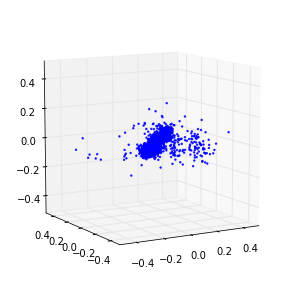

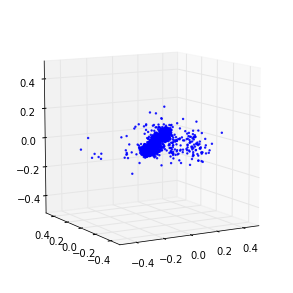

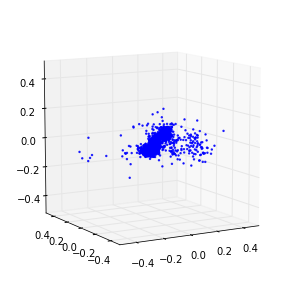

521 (-1494670.124137931, 2134315347.8620689) 35.5930418968
522 (-7384430.3448275859, 2010837905.6551723) 34.7243139744
523 (-2668443.3655172414, 2059511966.8965516) 35.0125710964
524 (-1550797.6827586207, 2092058999.1724138) 35.3215909004
525 (-2945477.7379310345, 2105526819.3103449) 34.9737710953
526 (-1897652.0827586206, 2084147950.3448277) 35.1522049904
527 (-8725605.5172413792, 2189508210.7586207) 34.8411960602
528 (-12052103.944827586, 2307390163.8620691) 35.3996601105
529 (-2031467.6965517241, 2183143168.0) 34.9461481571
530 (-4357860.6344827591, 2199510519.1724138) 34.6610438824
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-530 is not in all_model_checkpoint_paths. Manually adding it.


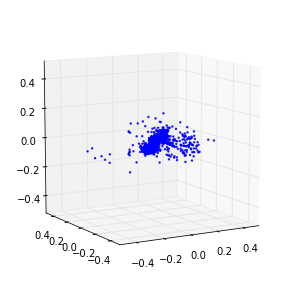

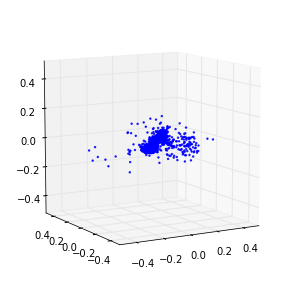

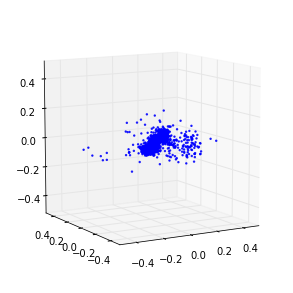

531 (144417.54482758621, 2143170913.1034484) 35.2203950882
532 (276464.11034482758, 2100521061.5172415) 35.3458628654
533 (-1448310.2896551725, 2089672425.9310346) 35.3122119904
534 (-1306910.8965517241, 2096397047.1724138) 34.7265911102
535 (-1656962.648275862, 2110915659.0344827) 35.0344281197
536 (-1384865.5448275863, 2051646918.6206896) 35.1838262081
537 (-1625462.2896551725, 1949641851.5862069) 34.7000820637
538 (-905124.19310344825, 1910473776.5517242) 35.2489728928
539 (-1055573.6275862069, 1882860605.7931035) 34.7859399319
540 (-1253932.1379310344, 1846647119.4482758) 34.981719017
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-540 is not in all_model_checkpoint_paths. Manually adding it.


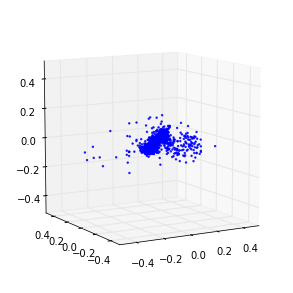

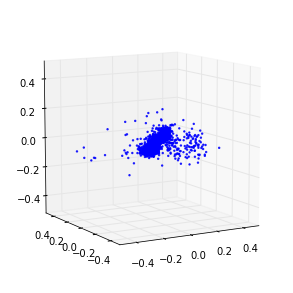

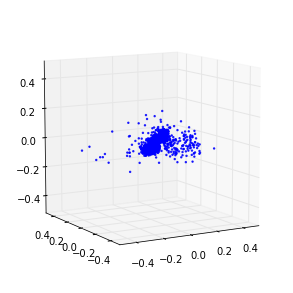

541 (-862938.92413793108, 1737975878.6206896) 35.1475088596
542 (-925910.51034482755, 1730442456.275862) 35.5323088169
543 (-1185288.8275862068, 1718420506.4827585) 34.6172909737
544 (-1415597.0206896551, 1693975578.4827585) 35.6098051071
545 (-1005980.2482758621, 1673960937.9310346) 35.0152728558
546 (-6252121.15862069, 1735499678.8965516) 35.3491170406
547 (-14475073.324137932, 1904850952.8275862) 37.5573689938
548 (-4342241.9862068966, 2039116274.7586207) 35.2378079891
549 (-14167609.379310345, 2036011462.6206896) 35.067330122
550 (-13313045.186206896, 2164280536.2758622) 34.6987919807
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-550 is not in all_model_checkpoint_paths. Manually adding it.


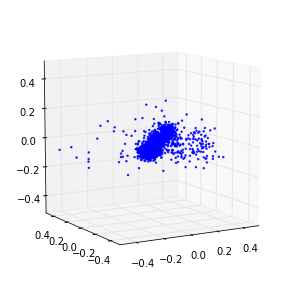

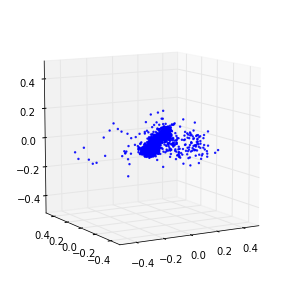

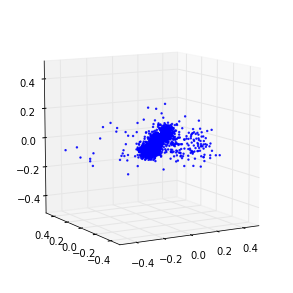

551 (-6483525.7379310345, 2064611358.8965516) 34.5692141056
552 (-21199126.951724138, 2011063040.0) 35.4879219532
553 (-23802354.758620691, 2000831390.8965516) 35.0967628956
554 (-10123324.910344828, 2055174417.6551723) 35.1121060848
555 (-18153400.496551722, 1985992456.8275862) 34.6976799965
556 (-4158457.8206896554, 1931930284.1379311) 35.0693149567
557 (-2759364.8551724139, 1911982843.5862069) 35.0986099243
558 (-4119137.1034482759, 1936235418.4827585) 35.095566988
559 (-5438392.4965517242, 1968537745.6551723) 35.2059500217
560 (-5493598.455172414, 2002403623.724138) 36.0149590969
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-560 is not in all_model_checkpoint_paths. Manually adding it.


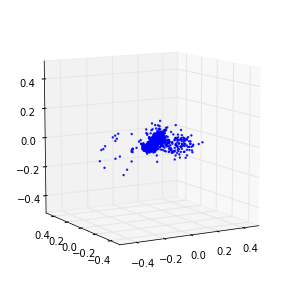

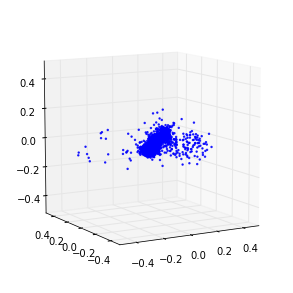

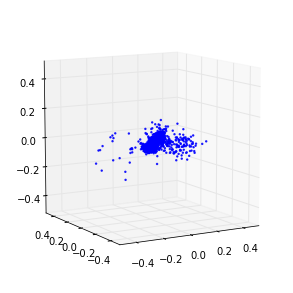

561 (-5112980.3034482757, 1975738880.0) 35.8370819092
562 (-5509388.3586206893, 1999720814.3448277) 36.7741520405
563 (-6870874.0413793102, 1985387149.2413793) 34.8795650005
564 (-5728339.8620689651, 1992489772.1379311) 35.3958718777
565 (-20809874.537931036, 1926382574.3448277) 34.9627280235
566 (-21489679.006896552, 1880123956.9655173) 35.3078389168
567 (-12761980.468965517, 1760855794.7586207) 34.9184119701
568 (-7862618.0413793102, 1771616344.275862) 35.4675459862
569 (-9787652.4137931038, 1860949737.9310346) 35.0387189388
570 (-11383914.813793104, 1789345178.4827585) 35.4408619404
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-570 is not in all_model_checkpoint_paths. Manually adding it.


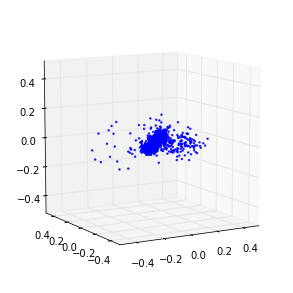

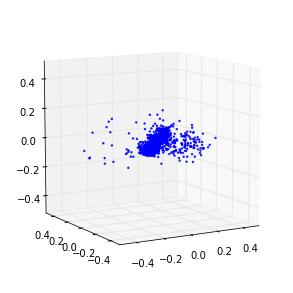

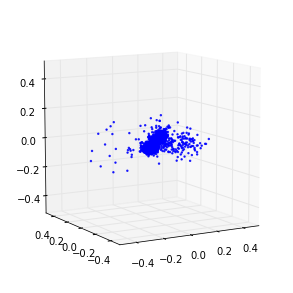

571 (-10502896.110344827, 1783791457.1034484) 35.3589031696
572 (-7384822.2896551723, 1747778251.0344827) 35.7201840878
573 (-7904535.8344827583, 1759910735.4482758) 35.2029769421
574 (-9198981.2965517249, 1743969875.8620689) 35.0529239178
575 (-6463401.4896551725, 1744684813.2413793) 35.2170238495
576 (-5333995.6965517243, 1706289964.1379311) 35.8468699455
577 (-6713760.6620689658, 1718941903.4482758) 35.1322288513
578 (-5627439.6689655175, 1734218107.5862069) 38.0121819973
579 (-6771051.6965517243, 1714011374.3448277) 35.6928339005
580 (-8137359.8896551728, 1717953836.1379311) 35.1344339848
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-580 is not in all_model_checkpoint_paths. Manually adding it.


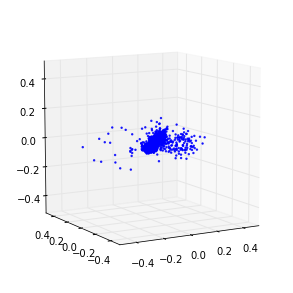

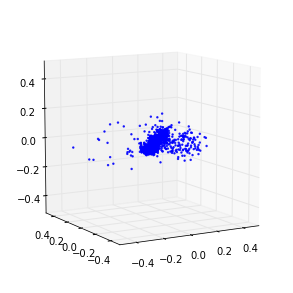

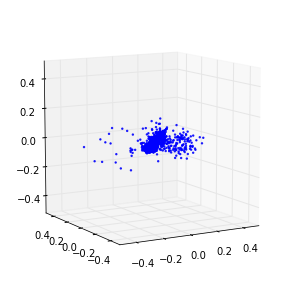

581 (-11098127.006896552, 1788149120.0) 34.520996809
582 (-8414652.0275862068, 1860767081.9310346) 34.9683308601
583 (-17508728.055172414, 1916020811.0344827) 35.4619100094
584 (-35930635.475862071, 2012727454.8965516) 34.9287259579
585 (-25004944.772413794, 2100599353.3793104) 35.1438069344
586 (-10122164.965517242, 2209094095.448276) 35.3234510422
587 (-3310900.9655172415, 2142756404.9655173) 34.8027961254
588 (-4153336.0551724136, 2156259085.2413793) 34.9941179752
589 (-4423973.0758620687, 2186761246.8965516) 34.7595949173
590 (-3571365.9586206898, 2258571471.448276) 35.8103740215
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-590 is not in all_model_checkpoint_paths. Manually adding it.


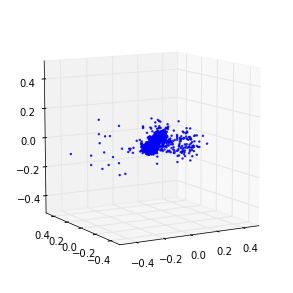

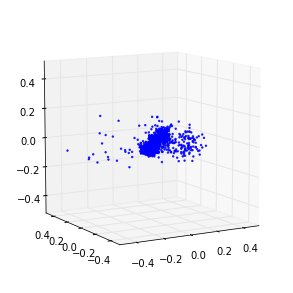

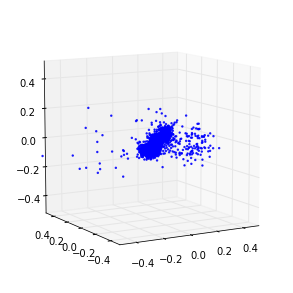

591 (-8173730.4275862072, 2302023115.034483) 35.1034679413
592 (-15939889.434482759, 2228098877.7931032) 34.5000610352
593 (-16886808.71724138, 2145869104.5517242) 35.6135349274
594 (-1764580.6344827586, 2115540758.0689654) 35.3600721359
595 (-2170312.3862068965, 2041746348.1379311) 35.064437151
596 (-3950544.3310344829, 2004914286.3448277) 35.4182159901
597 (-17898962.096551724, 2049861684.9655173) 35.2378098965
598 (-12567032.937931035, 2122064604.6896551) 35.0871210098
599 (-10985600.0, 2046878569.9310346) 34.9264581203
600 (-37558251.696551725, 2188185728.0) 35.3401250839
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-600 is not in all_model_checkpoint_paths. Manually adding it.


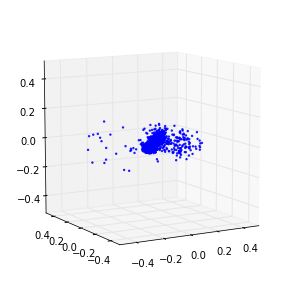

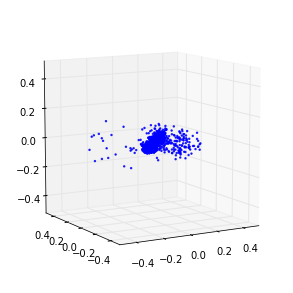

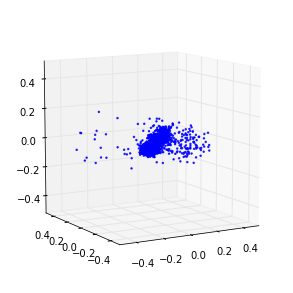

601 (-4051531.9172413792, 2211458546.7586207) 34.5120308399
602 (-1530133.1862068966, 2130337928.8275862) 34.913487196
603 (-3054565.5172413792, 2073132363.0344827) 35.4415280819
604 (-5978491.5862068962, 2120553661.7931035) 35.2891798019
605 (-8158795.0344827585, 2069347544.275862) 35.4906051159
606 (-5790979.5310344826, 2044063351.1724138) 35.258810997
607 (36204.57931034483, 1928466701.2413793) 34.8614461422
608 (-3246610.5379310343, 1872566351.4482758) 34.9416260719
609 (-1270709.8482758622, 1814985608.8275862) 35.6795721054
610 (-3939094.9517241381, 1794330240.0) 34.6510660648
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-610 is not in all_model_checkpoint_paths. Manually adding it.


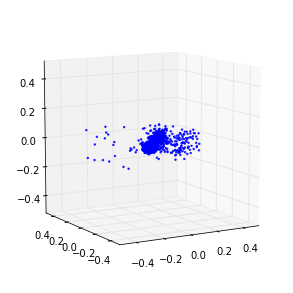

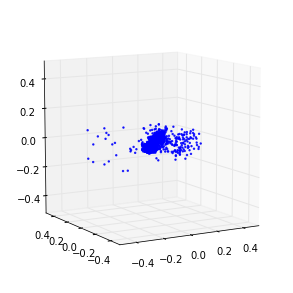

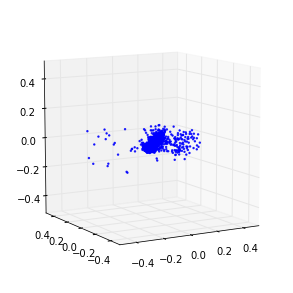

611 (-3133260.7999999998, 1792812632.275862) 34.8625619411
612 (-4106586.0413793102, 1835864200.8275862) 35.5197758675
613 (-4036499.420689655, 1836197760.0) 35.3358709812
614 (-5320877.0206896551, 1785981929.9310346) 34.964564085
615 (-21605209.158620689, 1861780877.2413793) 35.0350120068
616 (-15580205.020689655, 1959380881.6551723) 35.6039421558
617 (-19692060.248275861, 2047727461.5172415) 35.5231668949
618 (-39972352.882758617, 2132753262.3448277) 36.8777489662
619 (-9179284.3034482766, 2219263126.0689654) 35.2600579262
620 (-3571999.7793103447, 2273762189.2413793) 35.2042000294
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-620 is not in all_model_checkpoint_paths. Manually adding it.


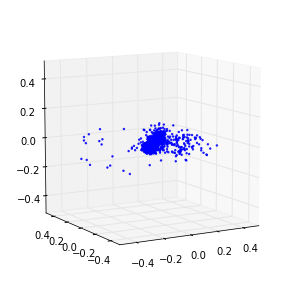

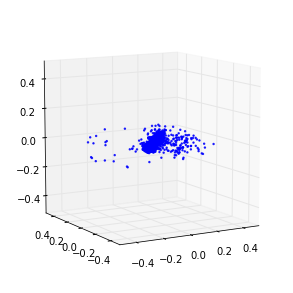

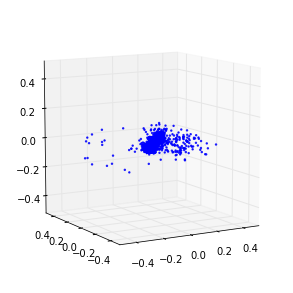

621 (-15375633.655172413, 2250864595.8620691) 35.4408750534
622 (-12490207.337931035, 2181376534.0689654) 35.7085020542
623 (-1959936.8827586207, 2179117373.7931032) 35.4956290722
624 (-4671818.1517241383, 2213503474.7586207) 35.3515450954
625 (-4531981.2413793104, 2183562840.2758622) 35.1124529839
626 (-5387860.7448275862, 2138805217.1034484) 37.4890170097
627 (-12920956.468965517, 2212647503.448276) 37.0712971687
628 (-8160476.6896551726, 2253953306.4827585) 35.0225999355
629 (-15927998.675862068, 2390279680.0) 35.3578460217
630 (-11216855.393103449, 2342015488.0) 34.9797511101
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-630 is not in all_model_checkpoint_paths. Manually adding it.


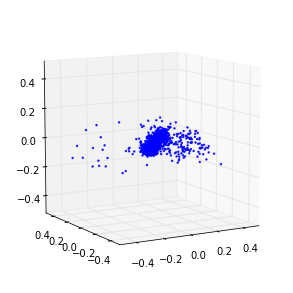

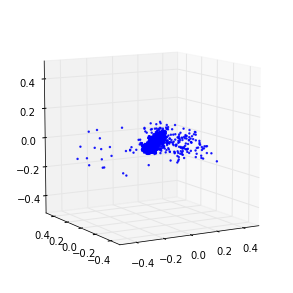

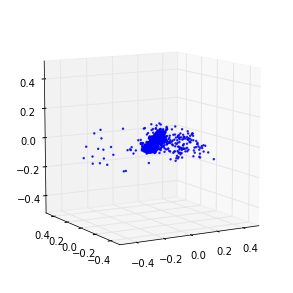

631 (-8117917.1310344832, 2337156175.448276) 34.7715709209
632 (-22453606.399999999, 2295188188.6896553) 35.3961849213
633 (-14810172.027586207, 2310985895.7241378) 37.9398560524
634 (-2769795.5310344826, 2274191368.8275862) 35.7574009895
635 (-2798173.5724137933, 2277841972.965517) 35.0934040546
636 (-3014724.8551724139, 2298181340.6896553) 36.0473539829
637 (-2605380.8551724139, 2304331802.4827585) 35.0317299366
638 (-4408914.9793103449, 2316528918.0689654) 35.4306840897
639 (-8175989.4068965521, 2289896103.7241378) 35.3487110138
640 (-9212408.9379310347, 2275776697.3793101) 37.5366609097
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-640 is not in all_model_checkpoint_paths. Manually adding it.


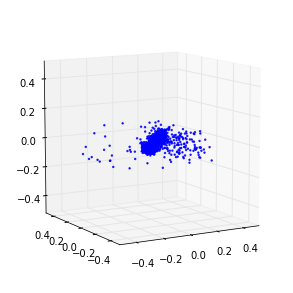

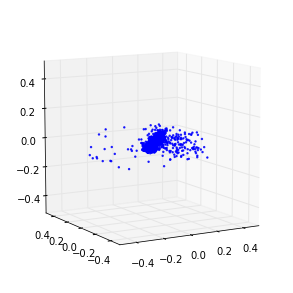

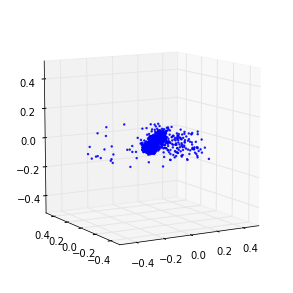

641 (-18450333.131034482, 2550894141.7931032) 35.3985128403
642 (-9224207.8896551728, 2588807521.1034484) 35.5855920315
643 (-14353116.689655172, 2781963625.9310346) 35.2811338902
644 (-5447916.5793103445, 2703694380.1379309) 35.2413859367
645 (-5394004.7448275862, 2654564802.2068968) 35.5386009216
646 (-5014545.6551724141, 2571351755.034483) 35.5038499832
647 (-7529853.3517241376, 2694563531.034483) 35.2367889881
648 (-4498444.3586206893, 2706161593.3793101) 36.0361640453
649 (-1455322.9241379311, 2732088893.7931032) 36.8606920242
650 (-4713715.6413793107, 2625616816.551724) 37.6492249966
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-650 is not in all_model_checkpoint_paths. Manually adding it.


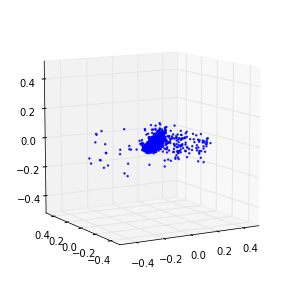

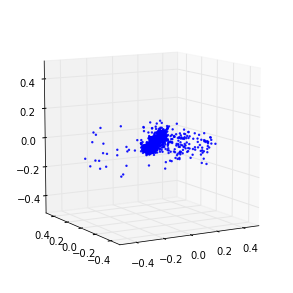

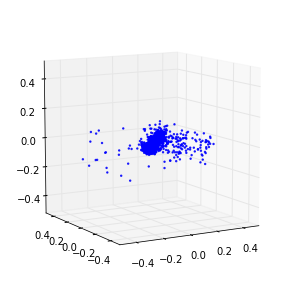

651 (-3250795.6965517243, 2578020502.0689654) 35.0235669613
652 (-7069540.6344827591, 2720239783.7241378) 34.9057490826
653 (-5043554.8689655168, 2467547074.2068968) 35.2292561531
654 (-2704574.6758620688, 2509907049.9310346) 34.9373719692
655 (-3371343.4482758623, 2553695496.8275862) 35.204128027
656 (-3957103.227586207, 2496854422.0689654) 35.3499419689
657 (-6375069.1310344832, 2488811908.4137931) 35.026211977
658 (-7764893.1310344832, 2516616730.4827585) 35.2888050079
659 (-4182561.544827586, 2576035769.3793101) 35.1922090054
660 (-4853422.7862068964, 2735723987.8620691) 35.0818340778
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-660 is not in all_model_checkpoint_paths. Manually adding it.


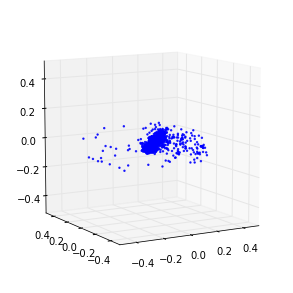

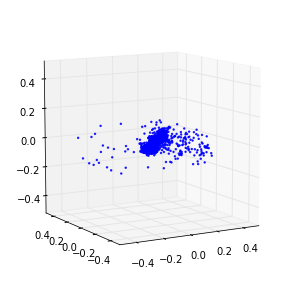

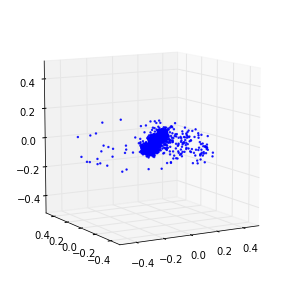

661 (-4815591.2827586206, 2681120935.7241378) 35.6423230171
662 (-2165701.7379310345, 2681054808.2758622) 35.5860040188
663 (-4973813.4068965521, 2697723595.034483) 35.2350552082
664 (-9899004.4689655174, 2785174845.7931032) 35.8173840046
665 (-11630634.372413794, 2685874264.2758622) 34.8543589115
666 (-6653560.0551724136, 2735928302.3448277) 35.2090899944
667 (-6860863.5586206894, 2758855618.2068968) 34.6460061073
668 (-1731568.1103448276, 2841342093.2413793) 35.3296661377
669 (-4770429.3517241376, 2819588678.6206899) 35.2054960728
670 (-4597855.3379310342, 2726208061.7931032) 35.7538328171
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-670 is not in all_model_checkpoint_paths. Manually adding it.


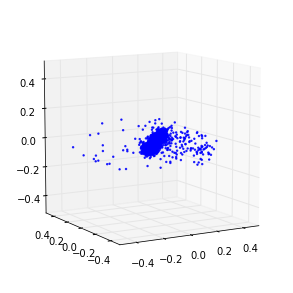

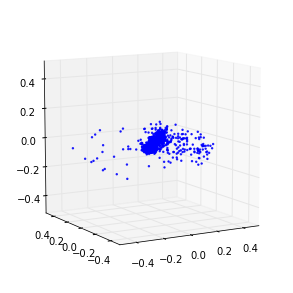

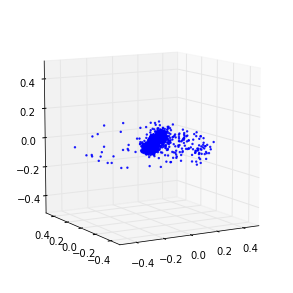

671 (-5287332.1931034485, 2728438925.2413793) 36.3591210842
672 (-8023679.1172413789, 2745687260.6896553) 35.7279720306
673 (-4526318.3448275859, 2784588288.0) 35.3148400784
674 (-4076114.9793103449, 2792329454.3448277) 35.5207769871
675 (-3986698.5931034484, 2783864169.9310346) 35.0325040817
676 (-2907515.5862068967, 2790115822.3448277) 35.1596109867
677 (-3683465.7103448277, 2798721483.034483) 35.4553990364
678 (-2842992.9931034483, 2802655488.0) 34.93821311
679 (-3232164.1931034485, 2801550062.3448277) 34.9790589809
680 (-2999160.0551724136, 2878546961.6551723) 35.2119810581
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-680 is not in all_model_checkpoint_paths. Manually adding it.


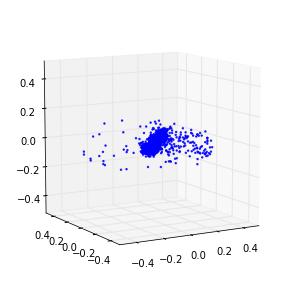

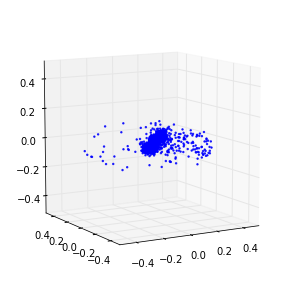

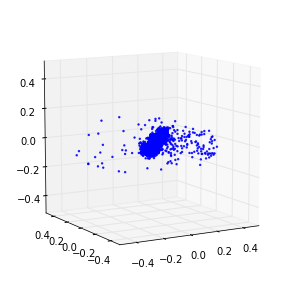

681 (-2563451.5862068967, 2825738946.2068968) 35.8624579906
682 (-6174755.3103448274, 2974418537.9310346) 35.1941299438
683 (-5945750.068965517, 2962407962.4827585) 37.7779810429
684 (-3561946.9241379309, 2940936960.0) 35.1057598591
685 (-3263329.1034482759, 2894068506.4827585) 35.4096488953
686 (-5498274.4275862072, 2985574611.8620691) 35.3872349262
687 (-859861.62758620689, 2902394906.4827585) 35.4404981136
688 (-347014.1793103448, 2972406113.1034484) 35.2727789879
689 (-1568384.8827586207, 3025135757.2413793) 36.0468740463
690 (-3788323.3103448274, 3286307804.6896553) 36.1522741318
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-690 is not in all_model_checkpoint_paths. Manually adding it.


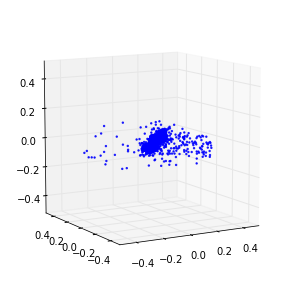

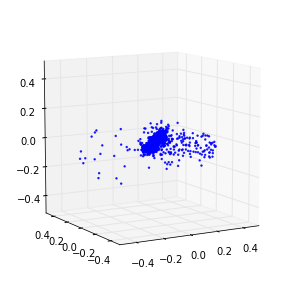

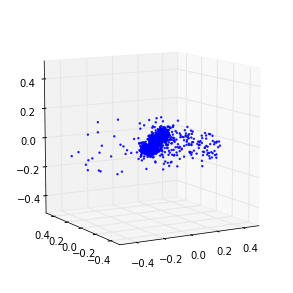

691 (-6037775.8896551728, 3288089926.6206899) 36.1813950539
692 (-20544732.689655174, 3231202427.5862069) 35.1414680481
693 (-14010036.08275862, 2991700683.034483) 35.2193310261
694 (-35268489.710344829, 2823067974.6206899) 36.0522661209
695 (-21237754.703448277, 3067227762.7586207) 36.0956029892
696 (-76490499.531034485, 3275009668.4137931) 35.7626039982
697 (-19037782.510344829, 3355116914.7586207) 36.1487219334
698 (-62675192.937931031, 3487685340.6896553) 35.0791778564
699 (-24719155.199999999, 3422879073.1034484) 36.7761099339
700 (-22268437.186206896, 3340686989.2413793) 35.3308739662
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-700 is not in all_model_checkpoint_paths. Manually adding it.


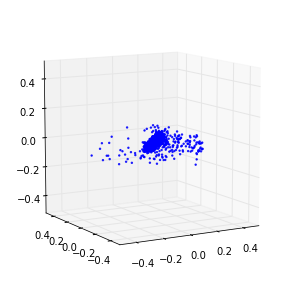

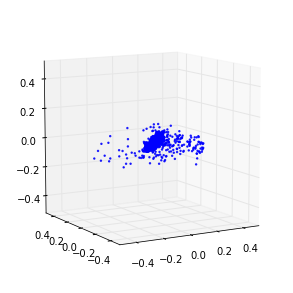

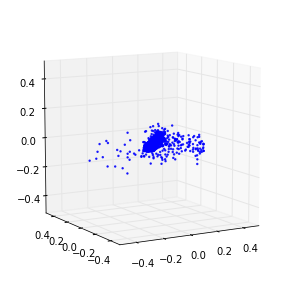

701 (-56622418.979310341, 3386965601.1034484) 36.373062849
702 (-47875188.524137929, 3544743176.8275862) 35.3554420471
703 (-10041476.413793104, 3585766682.4827585) 36.3533461094
704 (-13699649.324137932, 3465890718.8965516) 34.769436121
705 (-15855307.034482758, 3543929961.9310346) 35.5202200413
706 (-48366893.903448276, 3770529641.9310346) 35.9055027962
707 (-53032018.979310341, 3795916288.0) 35.2768790722
708 (-24287638.068965517, 3594191580.6896553) 35.8577330112
709 (-23470613.186206896, 3938542168.2758622) 35.2109069824
710 (-3716599.1724137929, 3657972206.3448277) 35.5847630501
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-710 is not in all_model_checkpoint_paths. Manually adding it.


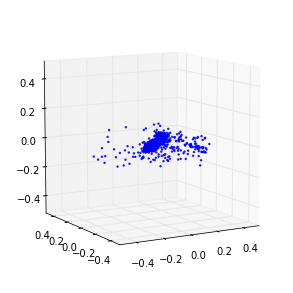

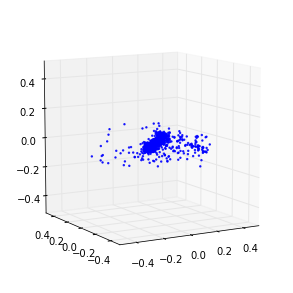

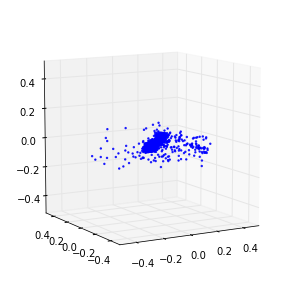

711 (-2782255.6689655171, 3481604740.4137931) 35.8530650139
712 (-5325855.7793103447, 3684211067.5862069) 35.9733419418
713 (-8498959.8896551728, 3810316137.9310346) 35.6882181168
714 (-19179760.110344827, 3770133751.1724138) 35.1091170311
715 (-42936457.710344829, 3708071141.5172415) 35.354801178
716 (-4764815.0068965517, 3936969895.7241378) 35.8515951633
717 (-2751025.4344827584, 3634119062.0689654) 35.8228580952
718 (-4081679.8896551724, 3752571030.0689654) 35.9643201828
719 (-6764538.703448276, 3733933356.1379309) 36.7633230686
720 (-14678000.110344827, 3896738816.0) 35.5416388512
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-720 is not in all_model_checkpoint_paths. Manually adding it.


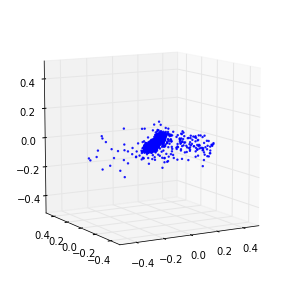

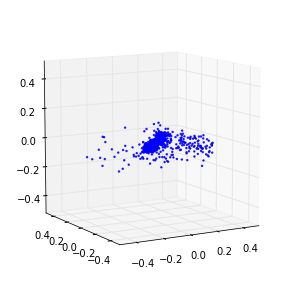

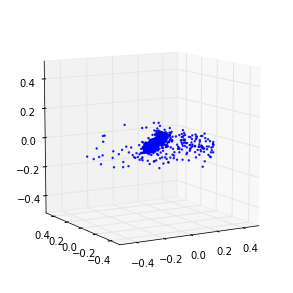

721 (2754851.3103448274, 3466474001.6551723) 35.2095880508
722 (-8436534.7310344819, 3447656933.5172415) 35.752959013
723 (-6983484.0275862068, 3398971851.034483) 36.3774061203
724 (-4615187.4206896555, 3511401366.0689654) 36.1603460312
725 (-4788269.9034482762, 3628888214.0689654) 36.5811159611
726 (-6239821.6827586209, 3677508104.8275862) 35.476197958
727 (-4383789.9034482762, 3637601024.0) 35.5639138222
728 (-4846396.0275862068, 3671391143.7241378) 35.908400774
729 (-2798923.9172413792, 3740461312.0) 35.3601229191
730 (-2070305.5448275863, 3836995248.551724) 35.0106668472
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-730 is not in all_model_checkpoint_paths. Manually adding it.


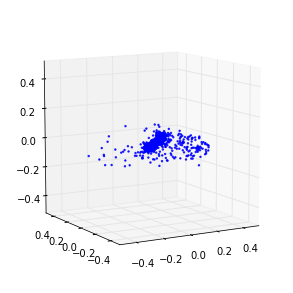

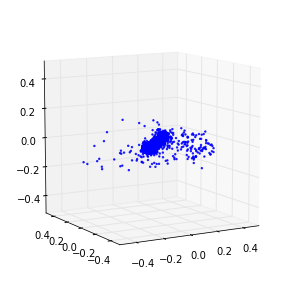

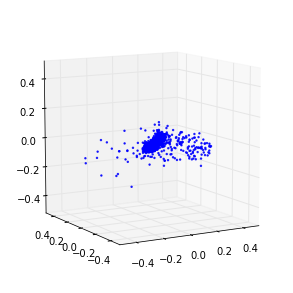

731 (-2690439.9448275864, 3926646227.8620691) 35.6793329716
732 (-3925265.6551724137, 3944179217.6551723) 35.4254660606
733 (-3723521.7655172413, 3924988636.6896553) 35.5524299145
734 (-4550378.8137931032, 3877786650.4827585) 35.1892089844
735 (-3436748.7999999998, 3812533133.2413793) 35.8791320324
736 (-3312320.4413793106, 3800754484.965517) 35.2596569061
737 (-1233810.5379310346, 3786560256.0) 35.1032128334
738 (-4419320.9379310347, 3861242359.1724138) 35.6150839329
739 (463559.50344827585, 3821444731.5862069) 35.5552630424
740 (-3763486.0137931034, 3617426184.8275862) 35.5905258656
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-740 is not in all_model_checkpoint_paths. Manually adding it.


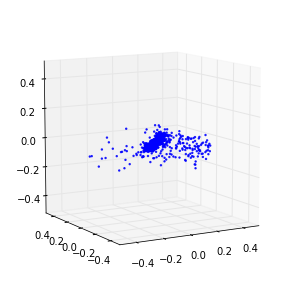

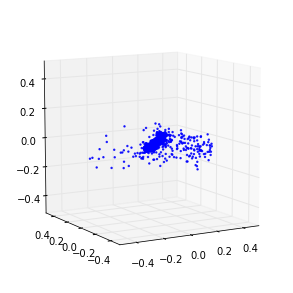

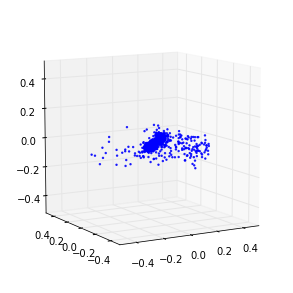

741 (-2769259.6965517243, 3608243756.1379309) 35.2654728889
742 (-8908528.1103448272, 3430402710.0689654) 35.3429379463
743 (-1226483.6413793103, 3354114118.6206899) 35.383728981
744 (1443887.6689655173, 3171026899.8620691) 35.1127090454
745 (-201920.44137931033, 3219340323.3103447) 35.8796679974
746 (-3921971.2000000002, 3114554809.3793101) 34.8452231884
747 (-3023481.8206896554, 3132926693.5172415) 35.4156980515
748 (-7020658.7586206896, 3051784209.6551723) 35.9653840065
749 (-15905195.255172415, 3054102836.965517) 34.7096538544
750 (-12360297.931034483, 3453650281.9310346) 35.4513940811
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-750 is not in all_model_checkpoint_paths. Manually adding it.


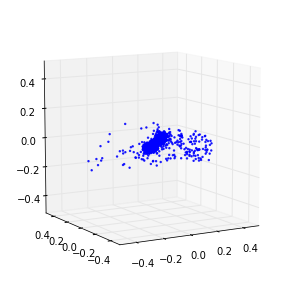

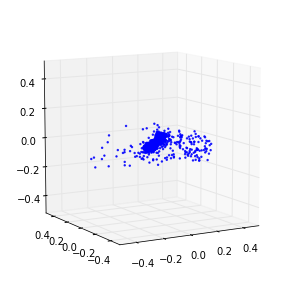

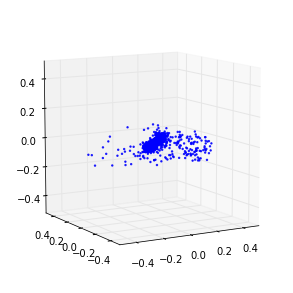

751 (-5752696.0551724136, 3469688364.1379309) 35.2353820801
752 (-5911661.4620689657, 3567381406.8965516) 35.2950060368
753 (-35817916.910344824, 3836361657.3793101) 35.247262001
754 (6270403.9724137932, 3786259041.1034484) 35.190844059
755 (-9099346.9793103449, 3474099747.3103447) 35.5562770367
756 (-22567298.648275863, 3217130275.3103447) 35.5197510719
757 (-10417383.282758621, 3180898983.7241378) 35.7126019001
758 (-11742615.834482759, 3263100539.5862069) 35.7559998035
759 (361671.50344827585, 3589219054.3448277) 35.5067059994
760 (-23868596.08275862, 3514701161.9310346) 35.2660229206
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-760 is not in all_model_checkpoint_paths. Manually adding it.


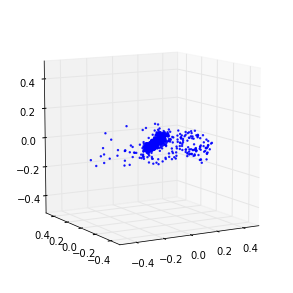

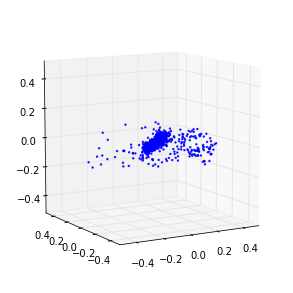

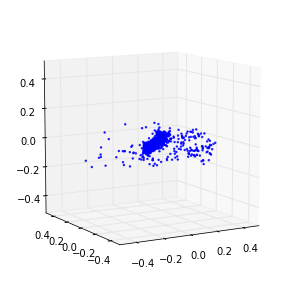

761 (-21608841.710344829, 3618574856.8275862) 34.7778189182
762 (-18465585.434482757, 3362758188.1379309) 35.624284029
763 (-22598502.399999999, 3507030889.9310346) 36.0941648483
764 (-22519398.399999999, 3685055505.6551723) 35.6507899761
765 (-4607380.3034482757, 3744127258.4827585) 35.3084199429
766 (-16351825.213793103, 3825787542.0689654) 35.5118179321
767 (-28806906.703448277, 3794002025.9310346) 35.6883687973
768 (-36964369.655172415, 4133035952.551724) 35.1228780746
769 (-23920025.600000001, 4118396416.0) 35.6760349274
770 (-22022308.193103448, 4040836140.1379309) 35.3402180672
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-770 is not in all_model_checkpoint_paths. Manually adding it.


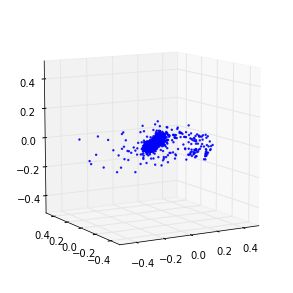

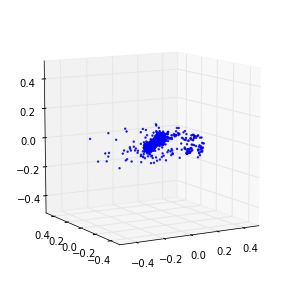

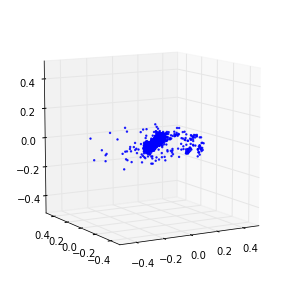

771 (-23077612.579310346, 4261607900.6896553) 35.8602249622
772 (-34715640.937931031, 4190061506.2068968) 35.3759381771
773 (-32822584.496551722, 4184772104.8275862) 35.5570418835
774 (-31624543.337931033, 4276751368.8275862) 35.4033041
775 (-24028786.758620691, 4195351516.6896553) 35.4529378414
776 (-21246958.344827585, 4257899811.3103447) 36.3450109959
777 (-3757105.4344827584, 4297780921.3793106) 34.9989979267
778 (-16384487.282758621, 4358672737.1034479) 35.7595610619
779 (-7929635.3103448274, 4343691246.3448277) 35.1114368439
780 (-21555065.820689656, 4192149556.965517) 35.7486701012
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-780 is not in all_model_checkpoint_paths. Manually adding it.


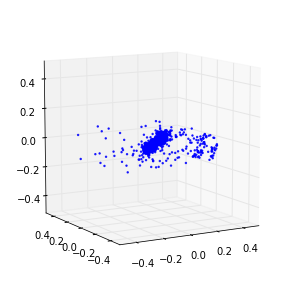

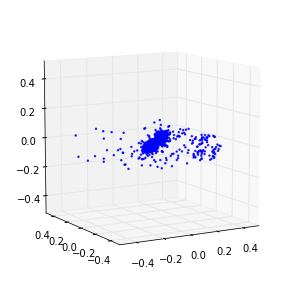

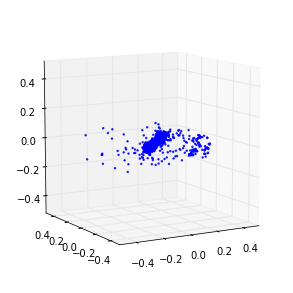

781 (-14022972.027586207, 3943517033.9310346) 35.7476801872
782 (-5495394.8689655168, 4059328150.0689654) 35.6841878891
783 (-9391289.3793103453, 4052522513.6551723) 35.5760121346
784 (-9269878.2896551732, 4137706407.7241378) 35.9148321152
785 (-6451044.6344827591, 4130477409.1034484) 35.5879731178
786 (-10814391.613793103, 4136294894.3448277) 35.1078660488
787 (-14109771.91724138, 4118262660.4137931) 35.3038351536
788 (-12403406.565517241, 4250873035.034483) 36.1267309189
789 (-15775747.531034483, 4200470616.2758622) 35.3112380505
790 (-7681479.5034482758, 4320541651.8620691) 35.6948060989
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-790 is not in all_model_checkpoint_paths. Manually adding it.


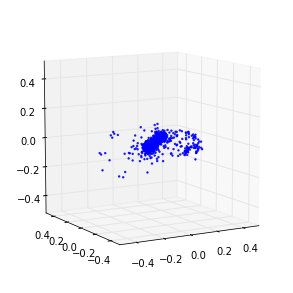

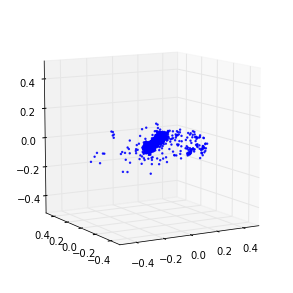

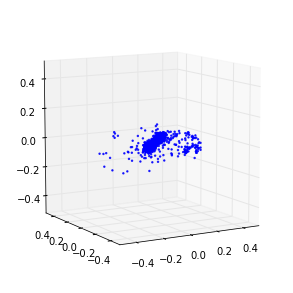

791 (-10359684.413793104, 4263697611.034483) 35.987678051
792 (-9282632.386206897, 4357457284.4137936) 35.7945320606
793 (-9370899.4206896555, 4411825001.9310341) 35.2754349709
794 (-6486997.6275862074, 4199949779.8620691) 35.7304627895
795 (-4464775.9448275864, 4098202376.8275862) 35.3721330166
796 (-4657199.6689655175, 4087656015.448276) 35.8916559219
797 (-4954256.772413793, 3961472512.0) 35.684221983
798 (-7192353.544827586, 3900473776.551724) 35.7375750542
799 (-14718027.91724138, 4082626692.4137931) 35.462348938
800 (-6115709.3517241376, 4243970259.8620691) 35.4304890633
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-800 is not in all_model_checkpoint_paths. Manually adding it.


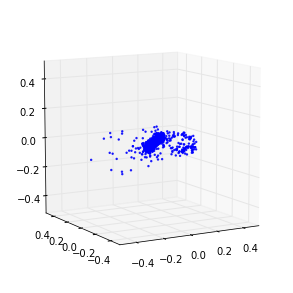

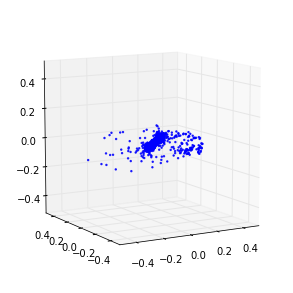

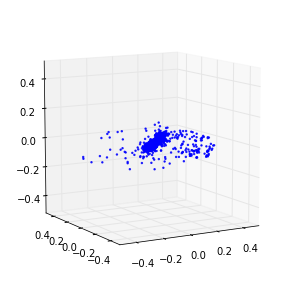

801 (-11294908.910344828, 4313251133.7931032) 35.6166961193
802 (-5546748.4689655174, 4222186557.7931032) 36.3172800541
803 (-7074242.2068965519, 4170158283.034483) 35.6676180363
804 (-55791042.206896551, 4009103792.551724) 35.4727208614
805 (-56356600.937931031, 4178296284.6896553) 35.2090089321
806 (-54746992.993103445, 4252074284.1379309) 35.8516259193
807 (-55720515.089655176, 3842545840.551724) 35.4669930935
808 (-25913211.586206898, 3846815311.448276) 35.1551048756
809 (-13269323.91724138, 3787722151.7241378) 35.9869549274
810 (-15320598.951724138, 3932501512.8275862) 35.5120630264
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-810 is not in all_model_checkpoint_paths. Manually adding it.


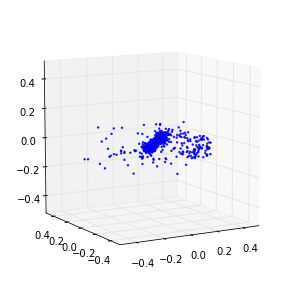

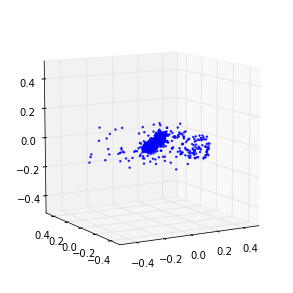

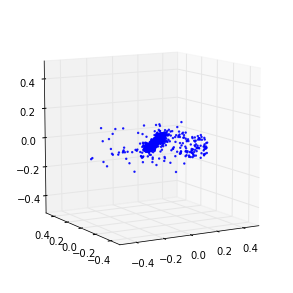

811 (-8548194.8689655177, 3702193513.9310346) 35.8957490921
812 (-10828378.04137931, 3606691363.3103447) 35.7532730103
813 (-13662635.255172415, 3646394129.6551723) 35.4077091217
814 (-14570303.558620689, 3646471247.448276) 35.8590118885
815 (-14260345.820689656, 3700118660.4137931) 35.6081168652
816 (-19355649.765517242, 3728130153.9310346) 34.9573287964
817 (-13868561.655172413, 3757508131.3103447) 35.6677010059
818 (-10994338.427586207, 3830900056.2758622) 35.7304370403
819 (-14381266.096551724, 3930329591.1724138) 35.499765873
820 (-17816468.303448275, 3938478185.9310346) 35.5534880161
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-820 is not in all_model_checkpoint_paths. Manually adding it.


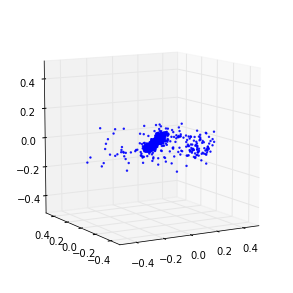

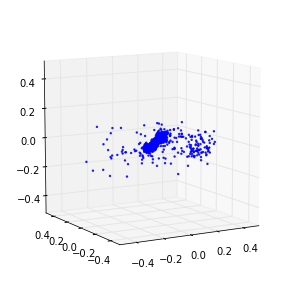

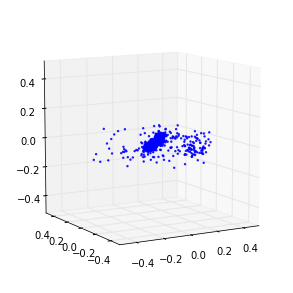

821 (-13496745.489655172, 4015907584.0) 36.8459770679
822 (-12028802.648275862, 4106122531.3103447) 35.9027400017
823 (-9204903.7241379302, 3974167887.448276) 35.1150331497
824 (-7382573.9034482762, 4064505741.2413793) 35.4058289528
825 (-13828034.206896551, 4258638132.965517) 35.7874901295
826 (-2329102.124137931, 4232064203.034483) 36.0356719494
827 (-9599569.2137931027, 4031354835.8620691) 35.3671069145
828 (-31001269.848275863, 4216639302.6206899) 36.4637999535
829 (-79523836.468965515, 4178838651.5862069) 37.3070800304
830 (9362896.3310344834, 4464603736.2758617) 37.9331288338
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-830 is not in all_model_checkpoint_paths. Manually adding it.


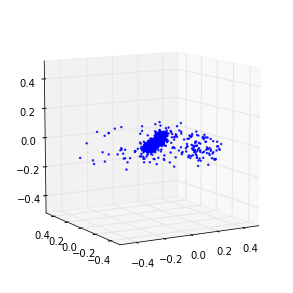

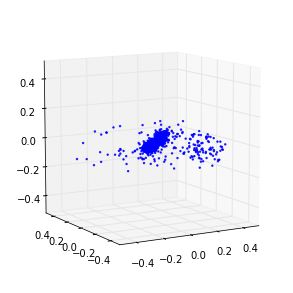

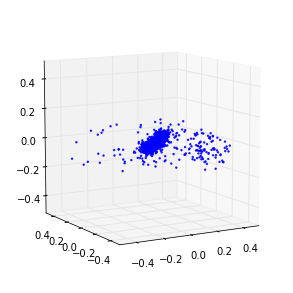

831 (-58999408.993103445, 4573290699.034483) 35.8417990208
832 (-42891497.048275866, 4996929129.9310341) 35.9338488579
833 (-47404649.931034483, 5040960476.6896553) 36.1111118793
834 (-5715996.2482758621, 4625759390.8965521) 35.1928360462
835 (-5330723.3103448274, 4576563288.2758617) 36.028124094
836 (-20988935.062068965, 4569614636.1379309) 36.3207728863
837 (-17017817.158620689, 4557873363.8620691) 35.3026309013
838 (-9593794.206896551, 4694065152.0) 35.0678019524
839 (-8145282.6482758624, 4598507122.7586203) 35.9402151108
840 (-9003906.6482758615, 4517769622.0689659) 35.8219370842
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-840 is not in all_model_checkpoint_paths. Manually adding it.


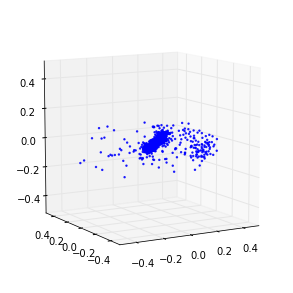

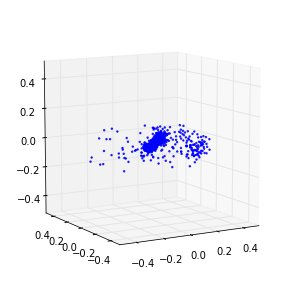

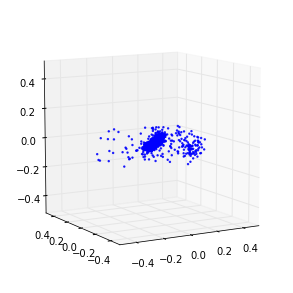

841 (-7014973.7931034481, 4472047969.1034479) 36.4747998714
842 (-1526480.3310344827, 4643297862.6206894) 35.8934979439
843 (-7967341.4620689657, 4640779458.2068968) 36.7527580261
844 (-8810972.6896551717, 4699974920.8275862) 35.8987159729
845 (-12549211.806896552, 4537265681.6551723) 35.968722105
846 (-5978129.6551724141, 4617567143.7241383) 35.7871499062
847 (-6447764.3034482757, 4738570134.0689659) 35.4076120853
848 (-4708193.1034482755, 4593396736.0) 35.4564480782
849 (-3852210.3172413795, 4820799170.2068968) 35.7831008434
850 (-5588670.6758620692, 4821660654.3448277) 35.3611700535
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-850 is not in all_model_checkpoint_paths. Manually adding it.


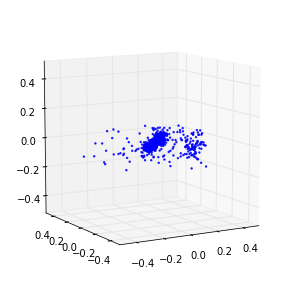

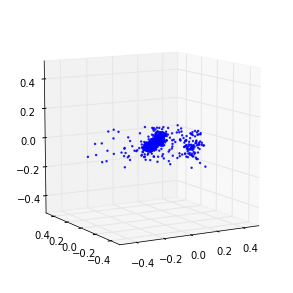

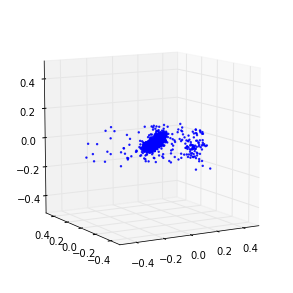

851 (-7790581.4068965521, 4858834008.2758617) 36.0189449787
852 (-21713941.186206896, 5128989660.6896553) 35.2200250626
853 (-74837814.731034487, 5101135307.034483) 35.4675109386
854 (-28853466.924137931, 5119267557.5172415) 35.9344799519
855 (-40120468.303448275, 5361394829.2413797) 35.6894190311
856 (-8308033.3241379308, 5362402339.3103447) 36.2423429489
857 (-84852351.117241383, 5266046834.7586203) 35.9500761032
858 (-30452961.986206897, 5249536476.6896553) 35.4651989937
859 (-18823425.765517242, 5274166678.0689659) 35.4729089737
860 (-17360373.40689655, 5425097374.8965521) 35.9635670185
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-860 is not in all_model_checkpoint_paths. Manually adding it.


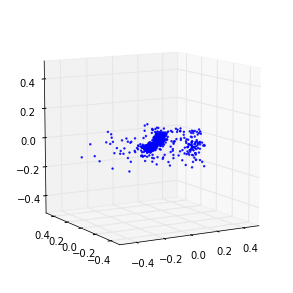

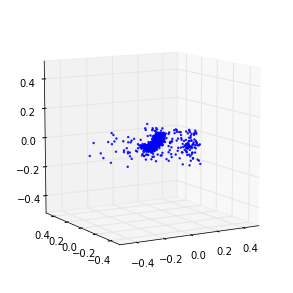

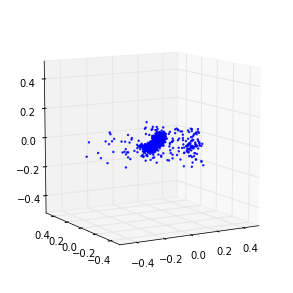

861 (-13417111.834482759, 5577042520.2758617) 36.0453629494
862 (-75055400.606896549, 5741006247.7241383) 36.6440207958
863 (-80726065.434482753, 5942423975.7241383) 35.6612260342
864 (-72573853.131034479, 5843474679.1724138) 35.5253310204
865 (-41543888.331034482, 5961487872.0) 36.1424820423
866 (-11894784.0, 5820276329.9310341) 35.9567699432
867 (-48502706.317241378, 5827842295.1724138) 35.5726048946
868 (-93710823.282758623, 5673782483.8620691) 36.2373099327
869 (-46194606.786206894, 5248310113.1034479) 35.5686738491
870 (-40240170.372413792, 5328985900.1379309) 35.8666918278
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-870 is not in all_model_checkpoint_paths. Manually adding it.


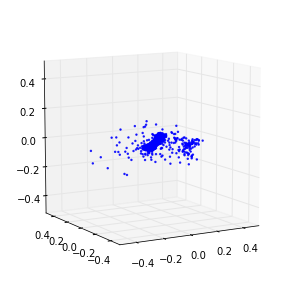

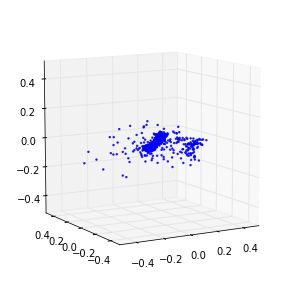

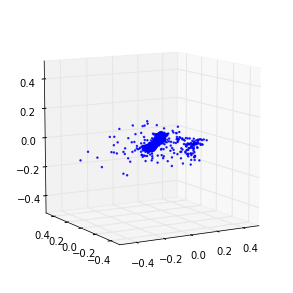

871 (-45936897.765517242, 5303272200.8275862) 36.4908149242
872 (-39196117.627586208, 5248487847.7241383) 36.2356410027
873 (-23744074.151724137, 5073585699.3103447) 35.8885540962
874 (-24950204.910344828, 5126646678.0689659) 35.6429290771
875 (-17114578.096551724, 5114217931.034483) 36.1145379543
876 (-17897373.131034482, 5138807702.0689659) 35.6746439934
877 (-15672302.344827587, 5258167066.4827585) 36.1374289989
878 (-4482771.8620689651, 5258347096.2758617) 35.9836602211
879 (-20859674.482758619, 5498889321.9310341) 36.3500759602
880 (-12930115.089655172, 5431116711.7241383) 35.9042308331
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-880 is not in all_model_checkpoint_paths. Manually adding it.


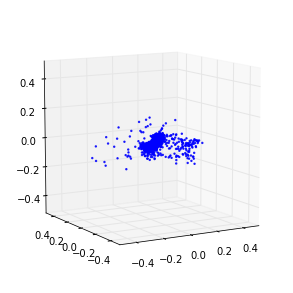

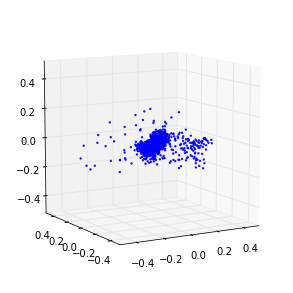

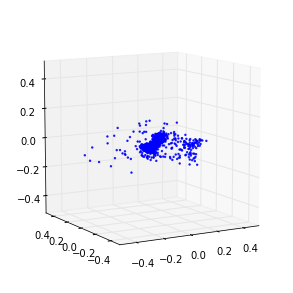

881 (-20552276.744827587, 5500407437.2413797) 35.644097805
882 (-29545327.227586206, 5281595233.1034479) 36.0740339756
883 (-16809122.427586205, 5142447086.3448277) 37.0501079559
884 (-16978156.579310346, 5077247664.5517244) 38.3971729279
885 (-19649260.579310346, 5093840101.5172415) 36.7340710163
886 (-13779710.234482758, 5099801917.7931032) 36.3654279709
887 (-5307872.2206896553, 5171817825.1034479) 35.596282959
888 (-6853670.84137931, 5302266844.6896553) 36.38072896
889 (-8668569.5999999996, 5370391975.7241383) 35.7607109547
890 (-7305893.9586206898, 5358536262.6206894) 35.5434949398
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-890 is not in all_model_checkpoint_paths. Manually adding it.


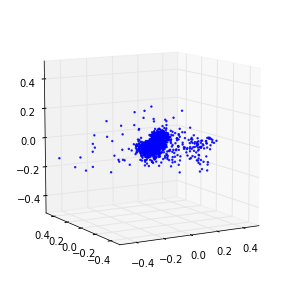

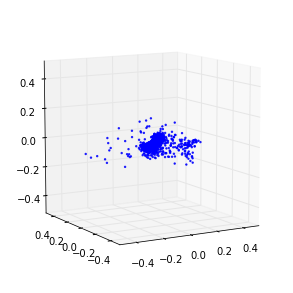

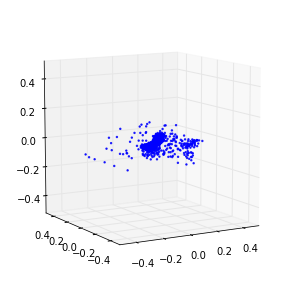

891 (-13936060.910344828, 5345775898.4827585) 35.9460470676
892 (-14153862.179310344, 5324002074.4827585) 36.7315409184
893 (-12735477.406896552, 5329626853.5172415) 35.9517149925
894 (-10922686.675862068, 5483505010.7586203) 36.1567080021
895 (-20771751.724137932, 5421854419.8620691) 36.0116000175
896 (-18091202.206896551, 5337390574.3448277) 35.8045649529
897 (-39397789.131034486, 5401155795.8620691) 36.0684669018
898 (-17273661.793103449, 5065512324.4137936) 35.9970960617
899 (-28918766.344827585, 5199015318.0689659) 36.1714398861
900 (-12461144.27586207, 5005542046.8965521) 36.2369859219
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-900 is not in all_model_checkpoint_paths. Manually adding it.


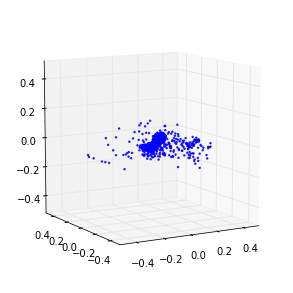

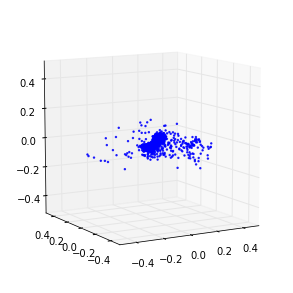

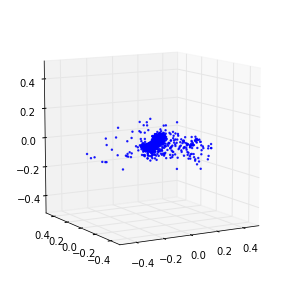

901 (-12248554.813793104, 5035803065.3793106) 36.1135919094
902 (-30830588.468965515, 5066569622.0689659) 35.8620040417
903 (-10509043.64137931, 4713175128.2758617) 36.9510490894
904 (-29505973.848275863, 4840818317.2413797) 35.8031051159
905 (-20549773.241379309, 5034764800.0) 35.7217850685
906 (-15933083.365517242, 4843467316.965517) 36.4430510998
907 (-17662202.703448277, 4573190814.8965521) 35.911659956
908 (-317913.15862068965, 4733461698.2068968) 36.0020918846
909 (-7164398.3448275859, 4761285384.8275862) 36.239759922
910 (-14023235.089655172, 4919604206.3448277) 36.46387887
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-910 is not in all_model_checkpoint_paths. Manually adding it.


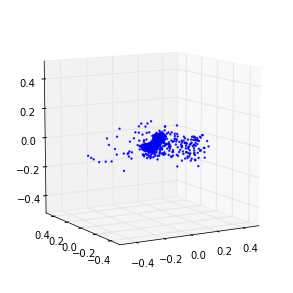

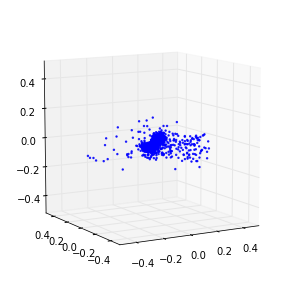

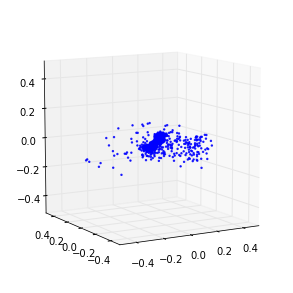

911 (-16474030.786206897, 4983518119.7241383) 36.5502538681
912 (-10893774.565517241, 5166650350.3448277) 38.0106608868
913 (-6452527.6689655175, 5016846848.0) 36.6837630272
914 (-10839011.751724139, 5026030609.6551723) 36.7129437923
915 (-15040603.806896552, 4965929878.0689659) 35.9503521919
916 (-6319344.1103448272, 4928215781.5172415) 36.4284610748
917 (-32715906.648275863, 5170948449.1034479) 36.2668790817
918 (-29847025.875862069, 5218764323.3103447) 36.1620178223
919 (-14673086.675862068, 5097019550.8965521) 35.9481101036
920 (-19984846.565517243, 5621862294.0689659) 36.1205852032
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-920 is not in all_model_checkpoint_paths. Manually adding it.


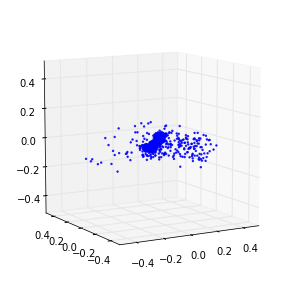

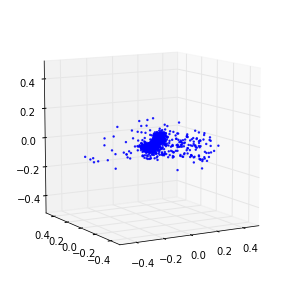

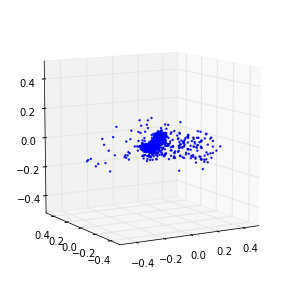

921 (-17152536.71724138, 5372135318.0689659) 35.4665050507
922 (-4847492.4137931038, 5098335337.9310341) 36.9434599876
923 (-6383079.2827586206, 4911947987.8620691) 35.8556871414
924 (-5441753.15862069, 4609728035.3103447) 36.5592918396
925 (-16137473.765517242, 4515624889.3793106) 36.4727749825
926 (-8141876.9655172415, 4799053859.3103447) 36.473526001
927 (-5805296.1103448272, 5024318057.9310341) 35.8716170788
928 (-7024339.8620689651, 4927913348.4137936) 36.4242019653
929 (-10103924.524137931, 4952468833.1034479) 35.7491919994
930 (-15016493.903448276, 5038501464.2758617) 35.7090630531
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-930 is not in all_model_checkpoint_paths. Manually adding it.


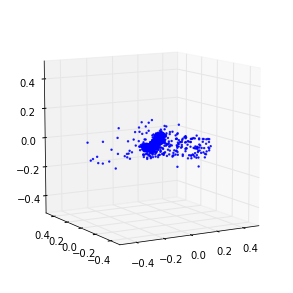

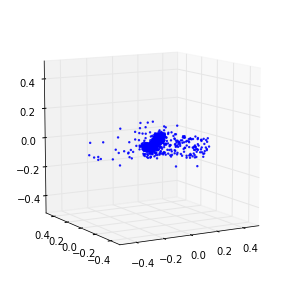

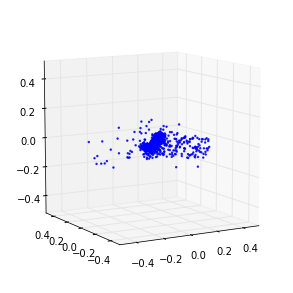

931 (-7840962.2068965519, 5177773691.5862064) 36.1736469269
932 (-14684474.262068966, 5056104783.4482756) 37.0255029202
933 (-10445153.103448275, 4869309740.1379309) 36.6374909878
934 (-7883288.7172413794, 4969227087.4482756) 36.1273121834
935 (-4692070.4000000004, 4797213696.0) 36.3571751118
936 (-3484272.9931034483, 4785816576.0) 36.2365372181
937 (-6889683.8620689651, 4773830505.9310341) 36.4155070782
938 (-7609245.1310344832, 4929699433.9310341) 36.3792090416
939 (-5215242.5931034479, 5024358294.0689659) 36.4767770767
940 (-5560376.4965517242, 5072919587.3103447) 35.8248109818
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-940 is not in all_model_checkpoint_paths. Manually adding it.


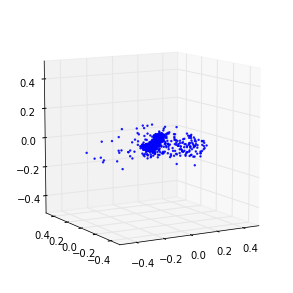

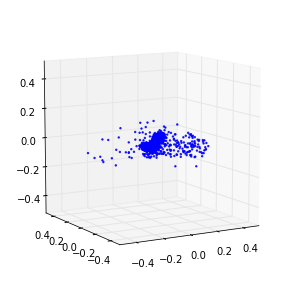

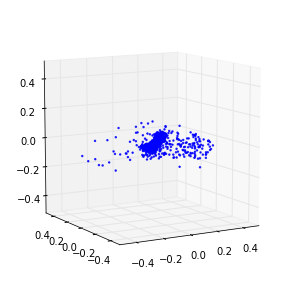

941 (-16045928.165517241, 4950935587.3103447) 35.4665250778
942 (-13393842.31724138, 4985609957.5172415) 36.65553689
943 (-4792281.15862069, 5047203557.5172415) 36.9563550949
944 (-3977290.1517241378, 5126383351.1724138) 36.7085540295
945 (-4947456.0, 5157854931.8620691) 36.3644340038
946 (-5404894.455172414, 4986841176.2758617) 36.2156460285
947 (-17027358.013793103, 4859956594.7586203) 36.2656810284
948 (-9407897.5999999996, 4862120518.6206894) 35.8359909058
949 (-3288353.544827586, 4754789040.5517244) 36.4610061646
950 (-3358668.7999999998, 4606698187.034483) 35.881016016
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-950 is not in all_model_checkpoint_paths. Manually adding it.


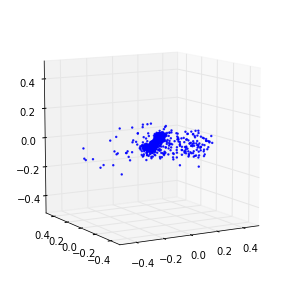

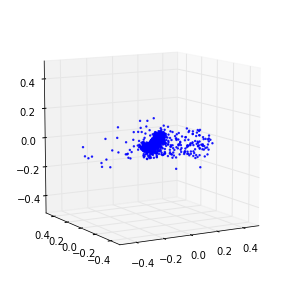

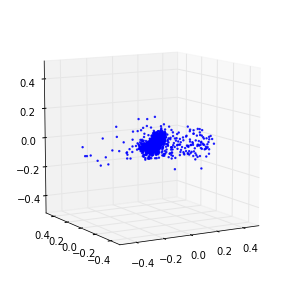

951 (-6221453.2413793104, 5107816536.2758617) 35.522277832
952 (-2431890.5379310343, 5044513068.1379309) 36.2915990353
953 (-3941838.5655172416, 4995993600.0) 36.2058010101
954 (-1200233.9310344828, 4825556515.3103447) 36.3918869495
955 (-4799226.703448276, 4709692186.4827585) 36.1311869621
956 (-3719637.6275862069, 4628485720.2758617) 36.6601347923
957 (-5490606.7862068964, 4672794959.4482756) 36.6481568813
958 (-6676158.6758620692, 4948864529.6551723) 35.5712270737
959 (-7353096.8275862066, 5317248441.3793106) 36.2365529537
960 (-2364306.5379310343, 5258562966.0689659) 36.3722519875
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-960 is not in all_model_checkpoint_paths. Manually adding it.


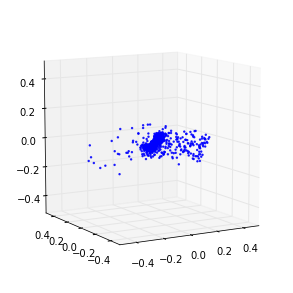

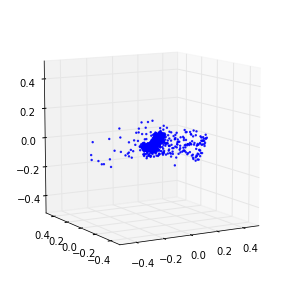

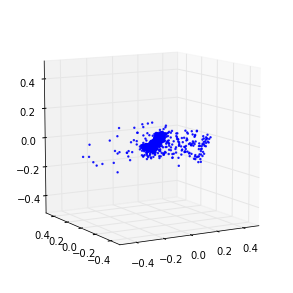

961 (-1055447.3931034482, 5628060477.7931032) 36.3017890453
962 (-1940183.3931034482, 5702146118.6206894) 37.3665590286
963 (-4975940.8551724134, 5564684288.0) 36.9942469597
964 (-26218979.751724139, 5500739866.4827585) 37.1547789574
965 (-66680033.986206897, 5233020698.4827585) 35.9420678616
966 (-739741.13103448274, 4814967490.2068968) 36.071254015
967 (-18259561.931034483, 4997151796.965517) 36.169481039
968 (-152014.56551724137, 5002145368.2758617) 36.3442060947
969 (-6472354.4275862072, 4732168615.7241383) 36.0999720097
970 (-11673158.620689655, 4710602999.1724138) 35.8250591755
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-970 is not in all_model_checkpoint_paths. Manually adding it.


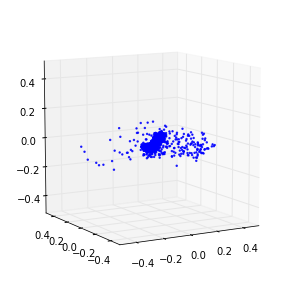

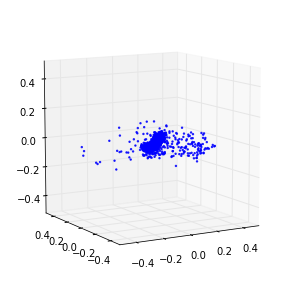

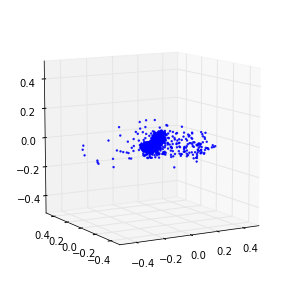

971 (-6006556.2482758621, 4573986198.0689659) 36.3723759651
972 (-2378155.2551724138, 4506098749.7931032) 36.5021309853
973 (-3805643.0344827585, 4599326066.7586203) 36.4184861183
974 (-8016631.1724137934, 4571112589.2413797) 36.2602889538
975 (-21324016.110344827, 4815861601.1034479) 36.5095579624
976 (-9787639.1724137925, 4867435113.9310341) 36.4599730968
977 (-3691456.4413793106, 5035902764.1379309) 37.3245799541
978 (-2373208.2758620689, 5092796592.5517244) 36.1839940548
979 (-4503802.703448276, 5276127973.5172415) 35.512868166
980 (-556999.50344827585, 5452158234.4827585) 36.2166879177
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-980 is not in all_model_checkpoint_paths. Manually adding it.


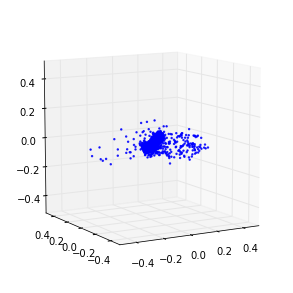

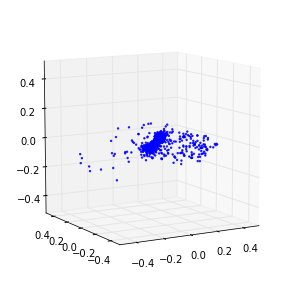

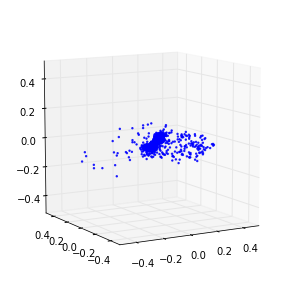

981 (-1550180.6344827586, 5288575788.1379309) 36.3109989166
982 (-2018035.6413793103, 5225104419.3103447) 36.3080539703
983 (-24547970.648275863, 5244406660.4137936) 36.8585178852
984 (-11407773.131034482, 5025932517.5172415) 36.9528419971
985 (-5942656.8827586211, 5069187760.5517244) 37.0208690166
986 (-3845197.6827586205, 5171792684.1379309) 36.7321839333
987 (-4223096.0551724136, 5228574225.6551723) 36.3083100319
988 (-9535887.0068965517, 5191366708.965517) 36.3868780136
989 (-7043086.1241379306, 5308854536.8275862) 36.6425230503
990 (-11746254.565517241, 5228213830.6206894) 36.1120710373
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-990 is not in all_model_checkpoint_paths. Manually adding it.


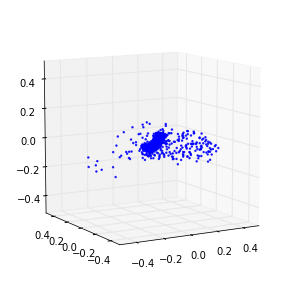

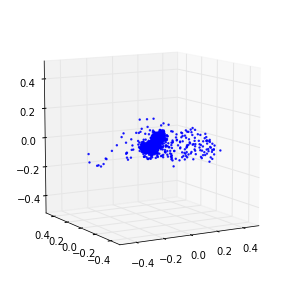

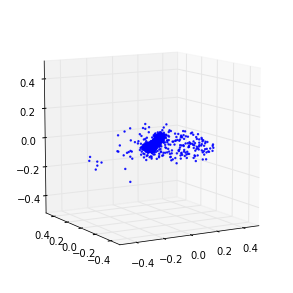

991 (-8979487.7793103456, 5397587173.5172415) 35.9982440472
992 (-7694519.613793103, 5594767571.8620691) 36.5862951279
993 (-1422106.4827586208, 5609758525.7931032) 36.8410680294
994 (-5816217.5999999996, 5979869625.3793106) 36.5261371136
995 (-5262120.6068965513, 5981417330.7586203) 36.4110682011
996 (-5167149.9034482762, 5977013777.6551723) 36.1836950779
997 (-1732512.6620689656, 6069669146.4827585) 36.5903220177
998 (-4307350.068965517, 6206654940.6896553) 36.3670089245
999 (-3902192.1103448276, 6342865337.3793106) 36.5575659275
1000 (-5374672.3310344825, 6226606009.3793106) 36.35668993
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1000 is not in all_model_checkpoint_paths. Manually adding it.


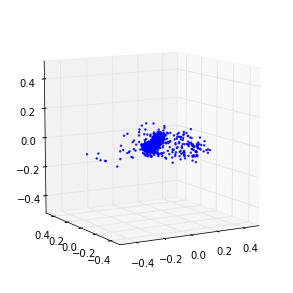

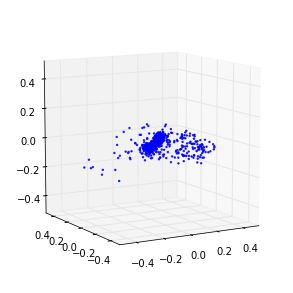

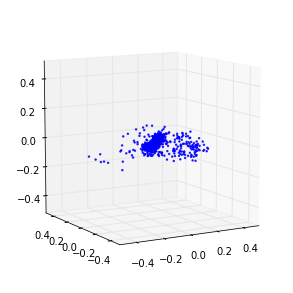

1001 (-11624063.117241379, 6406791485.7931032) 36.6480751038
1002 (-21751024.110344827, 6679966384.5517244) 36.6612949371
1003 (-28432203.91724138, 7149667275.034483) 36.7141900063
1004 (-4230648.9379310347, 7165217068.1379309) 36.3675780296
1005 (1001468.4689655172, 6612176066.2068968) 36.2703180313
1006 (-77405688.937931031, 6717055823.4482756) 36.3492062092
1007 (-75782673.655172408, 7295164875.034483) 36.9235548973
1008 (-20130028.579310346, 7249178871.1724138) 36.3206601143
1009 (-44754573.241379313, 7369500672.0) 36.3668749332
1010 (-244691378.31724137, 7923347350.0689659) 36.3295707703
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1010 is not in all_model_checkpoint_paths. Manually adding it.


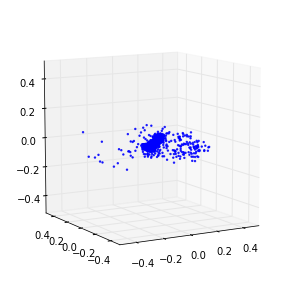

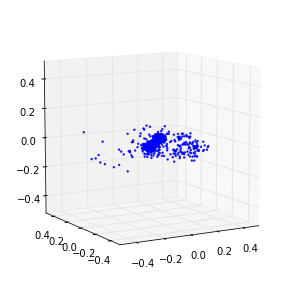

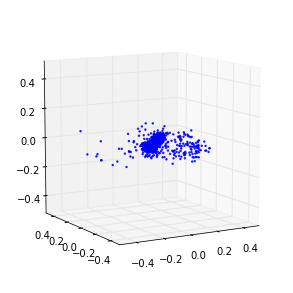

1011 (-345207543.17241377, 8480616306.7586203) 36.2367169857
1012 (-252233936.33103448, 9237590934.0689659) 35.759524107
1013 (-57766954.372413792, 9499139425.1034489) 36.6224110126
1014 (-125201852.91034482, 9636968448.0) 36.0973668098
1015 (-96470079.558620691, 9904195548.6896553) 36.0932559967
1016 (-13098767.889655173, 9635634140.6896553) 36.5789299011
1017 (-43101763.089655176, 9534163508.965517) 36.6964759827
1018 (-76266905.599999994, 9928151145.9310341) 36.7623839378
1019 (-29408743.28275862, 9032247101.7931042) 36.5444960594
1020 (-21540874.59310345, 9079393915.5862064) 36.8466658592
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1020 is not in all_model_checkpoint_paths. Manually adding it.


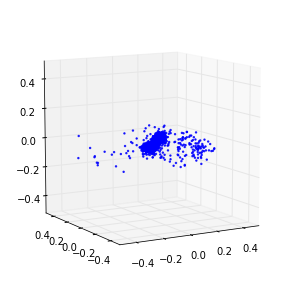

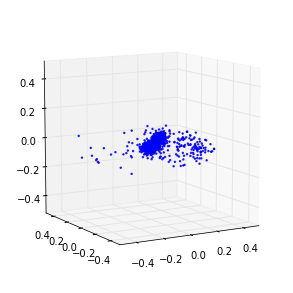

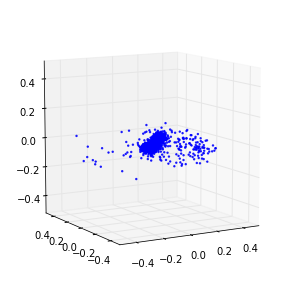

1021 (-29205722.924137931, 8869588921.3793106) 38.2466270924
1022 (-18154065.213793103, 8560480997.5172415) 38.9443559647
1023 (-27762207.779310346, 8568662104.2758617) 36.4844019413
1024 (-19636368.772413794, 8720312990.8965511) 36.5407409668
1025 (-16313163.91724138, 8601319017.9310341) 36.8832778931
1026 (-23671786.813793104, 8873493927.7241383) 35.9317288399
1027 (-20687681.32413793, 9155988727.1724129) 36.6270768642
1028 (-19898862.344827585, 9142769734.6206894) 36.0261251926
1029 (-29597123.972413793, 9273005161.9310341) 36.6814789772
1030 (-31145807.44827586, 9105844118.0689659) 36.8603179455
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1030 is not in all_model_checkpoint_paths. Manually adding it.


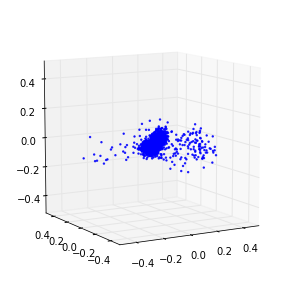

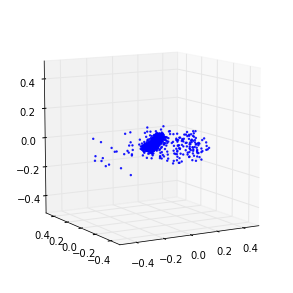

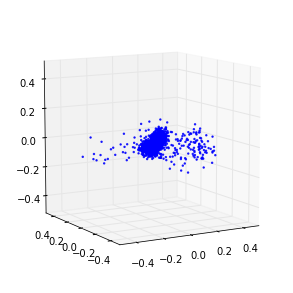

1031 (-74403871.779310346, 9074931252.965517) 36.7825119495
1032 (-41657750.068965517, 9250114348.1379318) 37.2475130558
1033 (-30179024.331034482, 9608700680.8275871) 37.0925581455
1034 (-24873157.737931035, 9491068822.0689659) 35.9916648865
1035 (-31928341.186206896, 9391277267.8620682) 36.9915349483
1036 (-33369801.268965516, 9677352783.4482765) 35.5783960819
1037 (-10858983.282758621, 9506610352.5517235) 36.6045949459
1038 (-9930384.772413794, 9307089178.4827595) 35.9562180042
1039 (-3412773.0758620691, 9063526558.8965511) 35.9943189621
1040 (-7936017.6551724141, 8917637437.7931042) 38.5096790791
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1040 is not in all_model_checkpoint_paths. Manually adding it.


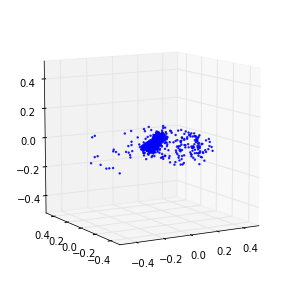

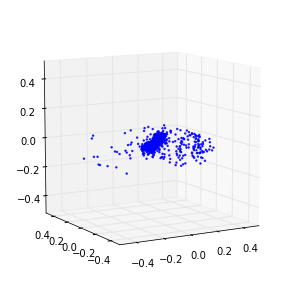

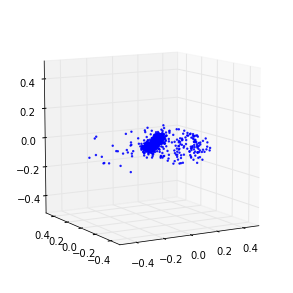

1041 (2836776.6068965518, 8818408147.8620682) 36.5447559357
1042 (-5537890.8689655168, 8851994412.1379318) 38.4749360085
1043 (-10758468.855172414, 9002414892.1379318) 36.5093228817
1044 (-23376348.689655174, 8870486280.8275871) 36.3431282043
1045 (-18428154.703448277, 8709602304.0) 36.7777869701
1046 (-16240438.731034482, 8952503931.5862064) 36.2184250355
1047 (-9436096.4413793106, 9083431512.2758617) 36.6972379684
1048 (-6263574.9517241381, 8846584408.2758617) 36.1275520325
1049 (-87216770.648275867, 8635154379.034483) 36.5322539806
1050 (-135758396.02758622, 8972684499.8620682) 36.8922560215
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1050 is not in all_model_checkpoint_paths. Manually adding it.


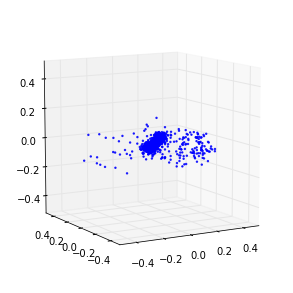

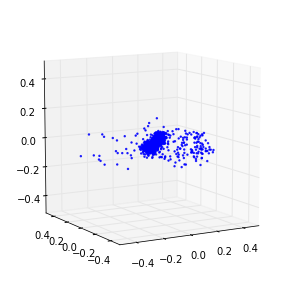

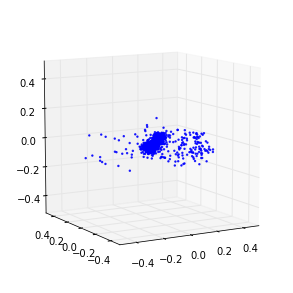

1051 (-57089539.531034485, 9377841399.1724129) 37.2326438427
1052 (-20111794.317241378, 9119572709.5172405) 36.9500541687
1053 (-14864687.668965517, 9051786769.6551723) 37.1404979229
1054 (-39544902.620689653, 9415639675.5862064) 37.1645371914
1055 (-21026088.606896553, 9613550486.0689659) 36.1626827717
1056 (-33283163.806896552, 9621473491.8620682) 36.6367959976
1057 (-26593548.358620688, 9294291367.7241383) 36.3774080276
1058 (-21455384.71724138, 9007606854.6206894) 36.5366520882
1059 (-10493803.696551723, 8827327399.7241383) 36.7881300449
1060 (-452032.44137931033, 8960068660.965517) 37.0926971436
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1060 is not in all_model_checkpoint_paths. Manually adding it.


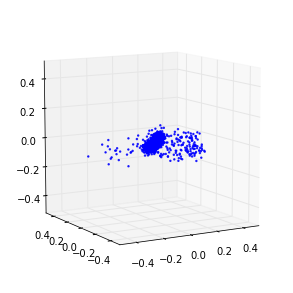

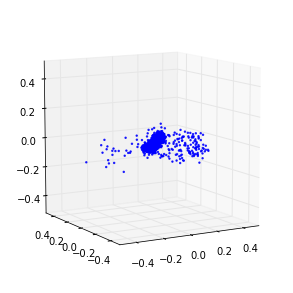

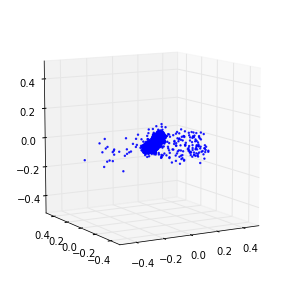

1061 (-13242918.841379311, 9456057555.8620682) 35.7724750042
1062 (-8128879.227586207, 9783542536.8275871) 36.4559810162
1063 (-8264944.1103448272, 9912110927.4482765) 37.1267299652
1064 (-570156.13793103443, 9813247894.0689659) 36.7236659527
1065 (-3891284.7448275862, 9728352114.7586212) 36.8842279911
1066 (-10288791.834482759, 9697569792.0) 38.624158144
1067 (-2100224.0, 9601055708.6896553) 36.2658638954
1068 (-679356.91034482757, 9327739056.5517235) 36.3044660091
1069 (-7858338.4275862072, 9397641321.9310341) 36.208782196
1070 (-28762938.262068965, 9215409928.8275871) 36.5481450558
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1070 is not in all_model_checkpoint_paths. Manually adding it.


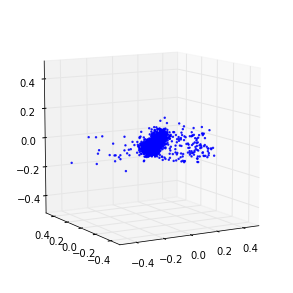

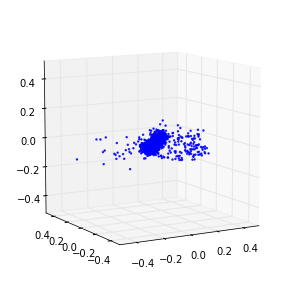

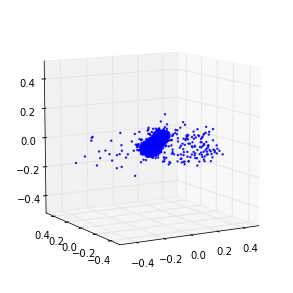

1071 (-14418047.117241379, 9226694196.965517) 36.697715044
1072 (-21026356.965517242, 9712763374.3448277) 37.3050019741
1073 (-8560788.3034482766, 9706338515.8620682) 38.4147520065
1074 (-8442223.227586206, 9793055214.3448277) 39.6345849037
1075 (-22599171.531034485, 9814005618.7586212) 35.9457800388
1076 (-16810803.199999999, 9508107899.5862064) 35.9330148697
1077 (-32599643.806896552, 8865044003.3103447) 35.960133791
1078 (-99669069.682758614, 8729747456.0) 36.7311010361
1079 (-76670488.717241377, 8714969035.034483) 36.7825639248
1080 (-4117066.1517241378, 8767412594.7586212) 35.7944028378
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1080 is not in all_model_checkpoint_paths. Manually adding it.


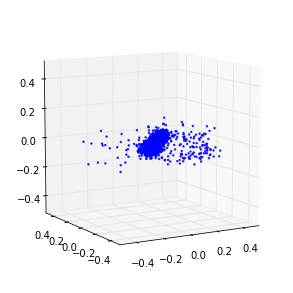

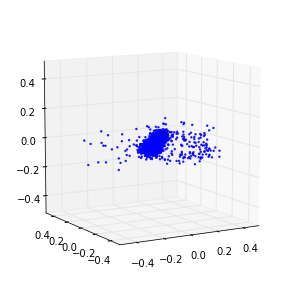

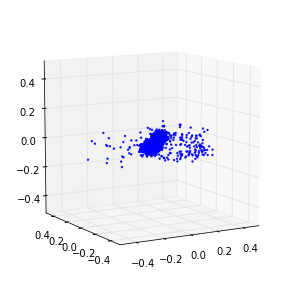

1081 (-43833721.820689656, 9242405976.2758617) 35.5796928406
1082 (-69234677.406896546, 8941467595.034483) 36.5172579288
1083 (-64873542.620689653, 8714424902.6206894) 36.4030520916
1084 (-70437902.124137938, 8590869027.3103447) 36.0857429504
1085 (-61725678.344827585, 8778358219.034483) 36.5282649994
1086 (-67609783.613793105, 8933745487.4482765) 35.8112440109
1087 (-46826926.786206894, 8890804259.3103447) 37.0678839684
1088 (-41959579.365517244, 8879311660.1379318) 36.4810829163
1089 (-48637641.26896552, 9043771533.2413788) 36.641546011
1090 (-51267329.765517242, 9412776183.1724129) 36.0283110142
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1090 is not in all_model_checkpoint_paths. Manually adding it.


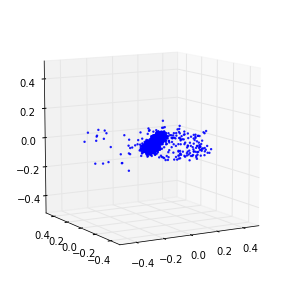

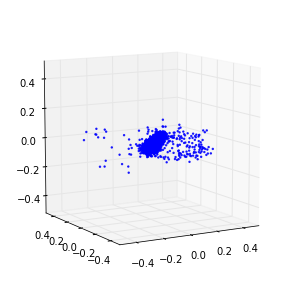

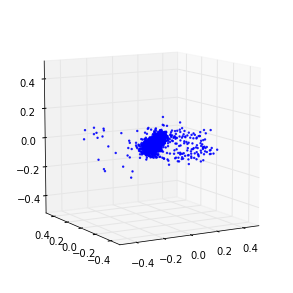

1091 (-40464489.931034483, 9337112752.5517235) 36.5999269485
1092 (-41587090.537931032, 9088749356.1379318) 36.0630459785
1093 (-44277809.434482761, 9185864739.3103447) 35.969342947
1094 (-37618419.641379312, 9248386718.8965511) 36.0817279816
1095 (-33301881.820689656, 8995550737.6551723) 36.2066340446
1096 (-29041628.689655174, 8757587862.0689659) 36.8353540897
1097 (-24688519.944827586, 8952175757.2413788) 36.5157990456
1098 (-35261185.765517242, 9289590395.5862064) 36.3725130558
1099 (-30489020.910344828, 9391097255.7241383) 36.5283908844
1100 (-25801537.32413793, 9198646801.6551723) 36.6288909912
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1100 is not in all_model_checkpoint_paths. Manually adding it.


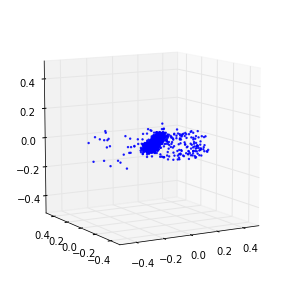

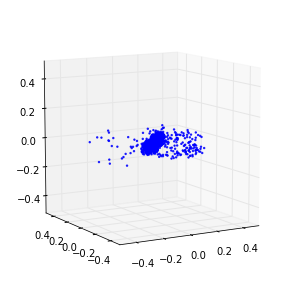

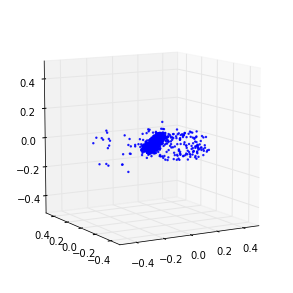

1101 (-32581727.337931033, 8953740429.2413788) 36.9473650455
1102 (-32997559.613793105, 8708614373.5172405) 36.3058590889
1103 (-28510190.344827585, 8904244788.965517) 37.5598368645
1104 (-21090335.779310346, 9028616862.8965511) 35.9432899952
1105 (-20557350.841379311, 9156234416.5517235) 36.8541960716
1106 (-11518036.744827585, 9385731213.2413788) 36.8002610207
1107 (-5450208.2206896553, 9341421356.1379318) 36.8051130772
1108 (-9306408.6068965513, 9466192260.4137936) 37.4329798222
1109 (-17903799.613793105, 9466524742.6206894) 37.288422823
1110 (-38926667.91724138, 9211140466.7586212) 36.7102031708
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1110 is not in all_model_checkpoint_paths. Manually adding it.


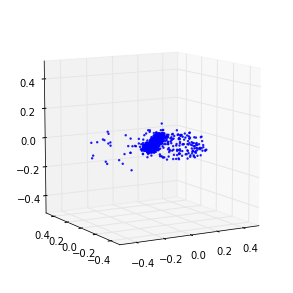

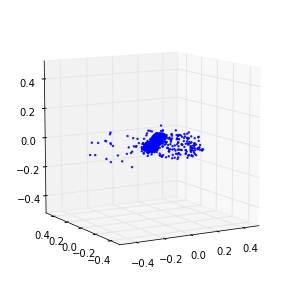

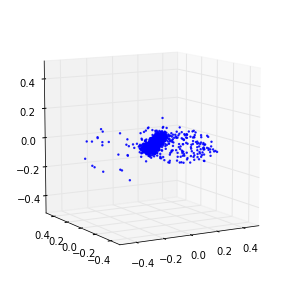

1111 (-49772741.737931035, 9216801227.034483) 36.1935749054
1112 (-18720139.475862067, 8943437117.7931042) 37.0125000477
1113 (-20751176.386206895, 9169325656.2758617) 36.5898249149
1114 (-23106750.67586207, 9678376500.965517) 37.2322871685
1115 (-21991706.482758619, 9649009240.2758617) 37.1078250408
1116 (-17862458.262068965, 9564777613.2413788) 37.49553895
1117 (-14964961.986206897, 9405375346.7586212) 37.3814139366
1118 (-21568865.103448275, 9586434612.965517) 37.0685591698
1119 (-23156213.40689655, 9317400823.1724129) 37.0198659897
1120 (-42661937.434482761, 9203334179.3103447) 38.2800130844
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1120 is not in all_model_checkpoint_paths. Manually adding it.


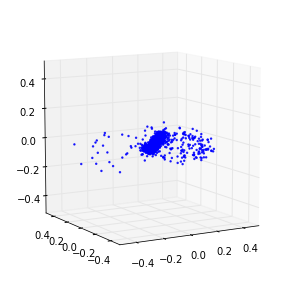

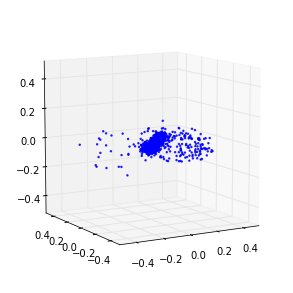

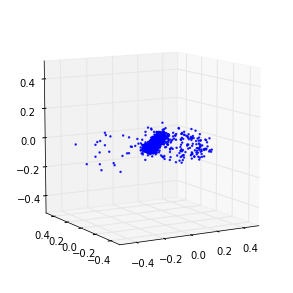

1121 (-30695413.40689655, 9184943457.1034489) 36.0703761578
1122 (-16590735.006896552, 9390378266.4827595) 38.0829210281
1123 (-17455428.855172414, 9448068943.4482765) 36.9565799236
1124 (-16129398.289655173, 9511839567.4482765) 37.1832780838
1125 (-12612904.606896551, 9630328443.5862064) 36.8365430832
1126 (-9523531.9172413796, 9528067884.1379318) 36.7988162041
1127 (-17695284.965517242, 9385295589.5172405) 37.1491620541
1128 (-11623692.35862069, 9207496880.5517235) 37.5733380318
1129 (-43446822.841379307, 9540857891.3103447) 37.2058141232
1130 (-16757639.944827586, 9690709345.1034489) 37.657184124
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1130 is not in all_model_checkpoint_paths. Manually adding it.


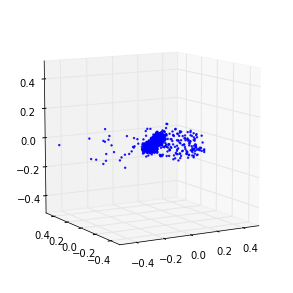

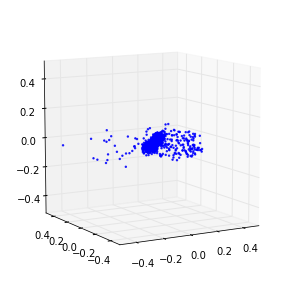

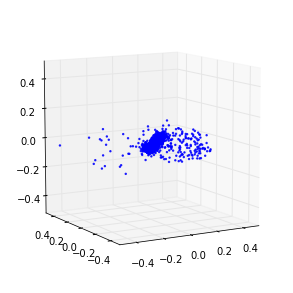

1131 (-15437936.993103448, 9751120013.2413788) 37.8092489243
1132 (-16587458.206896551, 10019827217.655172) 36.7627210617
1133 (-20018656.220689654, 10127485492.965517) 37.4306209087
1134 (-15783618.206896551, 10059245003.034483) 37.1666669846
1135 (-19622403.531034485, 10127874259.862068) 37.1018440723
1136 (-13018119.062068965, 10180591969.103449) 36.4771559238
1137 (-14320894.234482758, 10126813501.793104) 37.0292551517
1138 (-11221613.462068966, 10226373667.310345) 36.5391280651
1139 (-14502177.544827586, 10177887055.448277) 36.5601849556
1140 (-12886785.765517242, 10158062062.344828) 36.2562990189
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1140 is not in all_model_checkpoint_paths. Manually adding it.


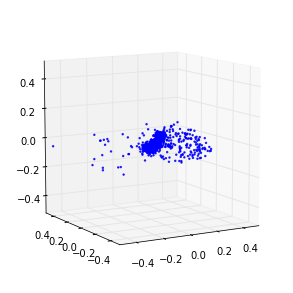

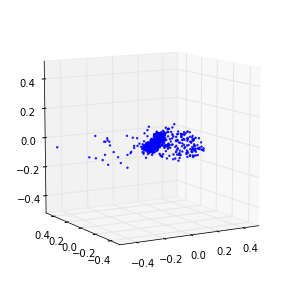

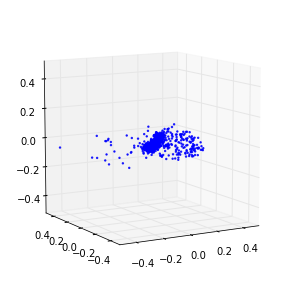

1141 (-15789451.475862069, 10181443478.068966) 37.4990808964
1142 (-11139410.979310345, 10219119333.517241) 36.4492311478
1143 (-17949865.489655171, 10271269817.379311) 37.1144881248
1144 (-34438800.77241379, 10601066813.793104) 37.090473175
1145 (-13360304.551724138, 10493030117.517241) 37.0182278156
1146 (-15492781.020689655, 10493800059.586206) 36.3061220646
1147 (-20294839.613793105, 10752323301.517241) 36.113563776
1148 (-18144623.227586206, 10523200300.137932) 36.956553936
1149 (-20501165.020689655, 10477051374.344828) 36.3000659943
1150 (-15258920.606896551, 10289897507.310345) 36.4655048847
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1150 is not in all_model_checkpoint_paths. Manually adding it.


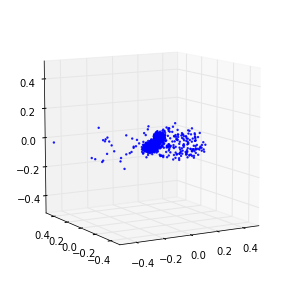

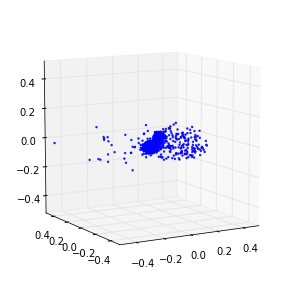

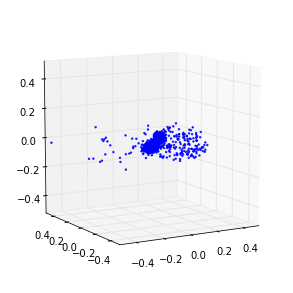

1151 (-23162512.772413794, 10064711362.206896) 36.7731921673
1152 (-32709744.993103448, 9871933369.3793106) 37.1753089428
1153 (-12837647.889655173, 9712495298.2068958) 37.1030459404
1154 (-21702422.951724138, 9575586886.6206894) 37.0676569939
1155 (-19793920.0, 9936467862.0689659) 36.4580090046
1156 (-7317193.2689655172, 9806618412.1379318) 36.8786120415
1157 (-13243504.993103448, 9814255192.2758617) 37.4504470825
1158 (-20284550.179310344, 9401064801.1034489) 37.0642619133
1159 (-20205384.386206895, 9651602996.965517) 36.8903579712
1160 (-14411634.758620691, 9784001995.034483) 36.7219929695
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1160 is not in all_model_checkpoint_paths. Manually adding it.


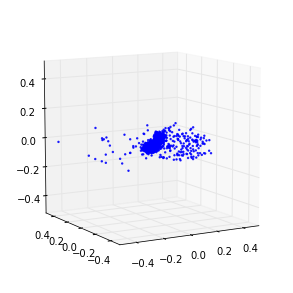

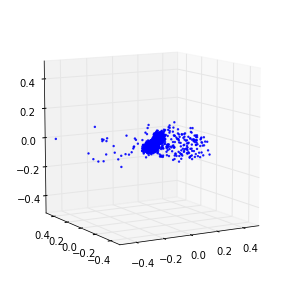

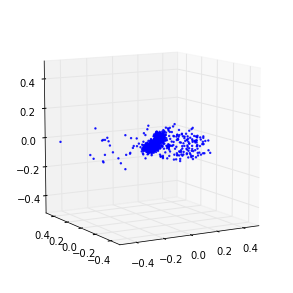

1161 (-15854994.537931034, 9815577035.034483) 37.2152431011
1162 (-13373750.731034482, 10122057092.413794) 38.008231163
1163 (-7247561.2689655172, 10291170657.103449) 37.2783567905
1164 (-18686382.786206897, 10211728384.0) 36.347135067
1165 (-15757093.075862069, 10003258756.413794) 37.0242528915
1166 (-8153165.6827586209, 10338716212.965517) 38.631196022
1167 (-11080612.193103448, 10380085565.793104) 37.3568191528
1168 (-12531083.475862069, 10207381751.172413) 37.78039217
1169 (-11289776.551724138, 10377694349.241379) 36.8352589607
1170 (-13050258.537931034, 10459842454.068966) 37.6782209873
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1170 is not in all_model_checkpoint_paths. Manually adding it.


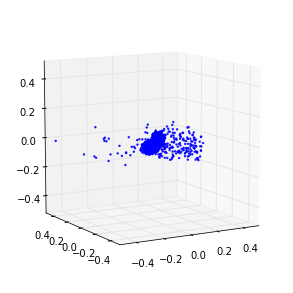

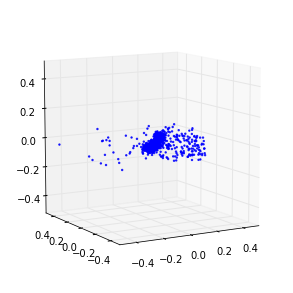

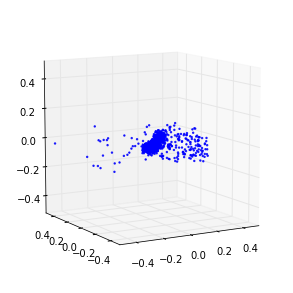

1171 (-9336803.7517241389, 10423747513.379311) 37.1296470165
1172 (-7409395.6413793107, 10441636758.068966) 36.7541408539
1173 (-49966715.586206898, 10628048225.103449) 37.5390949249
1174 (-82360164.634482756, 10368315815.724138) 37.4578859806
1175 (-17727466.813793104, 10345131467.034483) 38.7436978817
1176 (-21890450.537931036, 10337852062.896551) 37.1600830555
1177 (-20047349.40689655, 10473635451.586206) 37.1598939896
1178 (-5627889.8758620694, 10565435603.862068) 37.5845420361
1179 (-9191692.3586206902, 10920087057.655172) 37.403553009
1180 (-7776072.386206897, 11068290118.620689) 37.2231538296
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1180 is not in all_model_checkpoint_paths. Manually adding it.


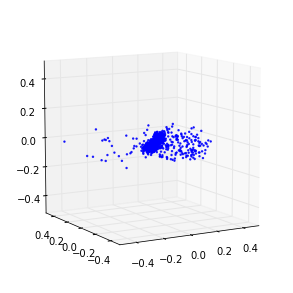

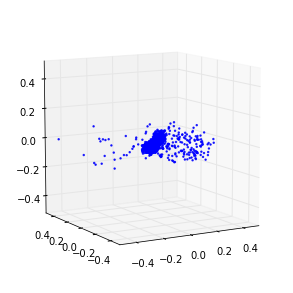

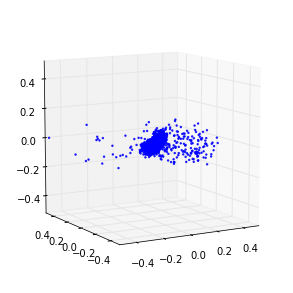

1181 (-8666910.0137931034, 10859321838.344828) 37.2155778408
1182 (-19581754.262068965, 10600283912.827587) 37.3879628181
1183 (-7156474.703448276, 10736552112.551723) 36.7328090668
1184 (-15619651.089655172, 11003980905.931034) 38.025854826
1185 (-9553715.1999999993, 10949404248.275862) 37.1953949928
1186 (-20916061.572413795, 10778994370.206896) 36.2730779648
1187 (287157.84827586205, 10557986745.379311) 37.5888209343
1188 (-10800488.165517241, 10606414565.517241) 36.4888858795
1189 (-3912117.8482758622, 10396951905.103449) 36.8957080841
1190 (-6824599.8344827583, 10669188378.482759) 37.0926060677
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1190 is not in all_model_checkpoint_paths. Manually adding it.


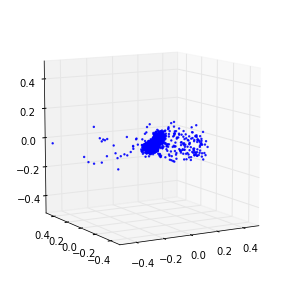

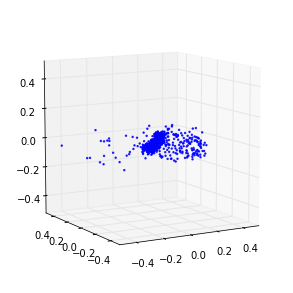

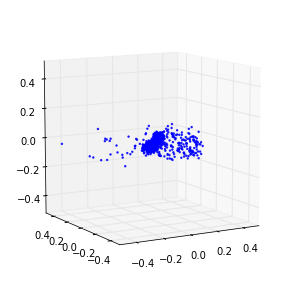

1191 (-59818393.600000001, 11364593134.344828) 36.4487879276
1192 (17283100.248275861, 11097948619.034483) 37.5296509266
1193 (-24413417.048275862, 10554149040.551723) 37.6579499245
1194 (3169703.7241379311, 10259437462.068966) 37.9631819725
1195 (-6804020.9655172415, 10288324678.620689) 38.0347812176
1196 (-21488724.744827587, 10448439013.517241) 40.0583839417
1197 (-19841129.931034483, 10396444601.379311) 37.5139091015
1198 (-7305703.2827586206, 10681396718.344828) 37.6531360149
1199 (-5810656.2206896553, 10811205490.758621) 37.6863479614
1200 (-10430273.324137932, 10934274224.551723) 36.9812879562
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1200 is not in all_model_checkpoint_paths. Manually adding it.


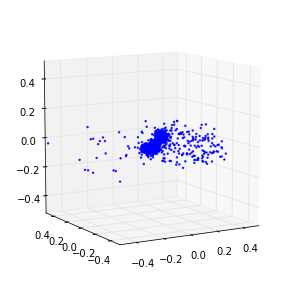

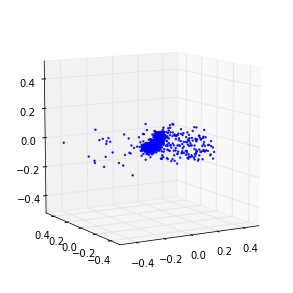

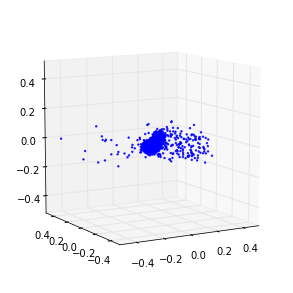

1201 (-11302368.220689654, 10925966689.103449) 36.9924368858
1202 (-17152621.462068964, 10998323659.034483) 36.9991161823
1203 (-10326849.324137932, 10890034493.793104) 36.8119530678
1204 (-9868803.5310344826, 10970696280.275862) 36.8812730312
1205 (-18907785.710344829, 11205332744.827587) 36.6857731342
1206 (-888584.82758620684, 11334459215.448277) 36.8192949295
1207 (-16610085.075862069, 11138475290.482759) 37.8357348442
1208 (-9500799.1172413789, 11008635798.068966) 37.3418519497
1209 (-3579833.3793103448, 10634133715.862068) 37.0495979786
1210 (-15426778.924137931, 10588895479.172413) 37.0583310127
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1210 is not in all_model_checkpoint_paths. Manually adding it.


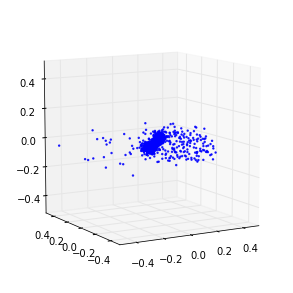

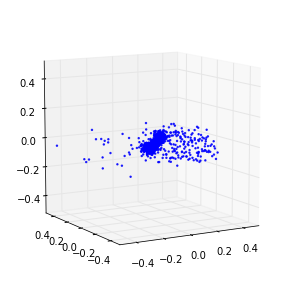

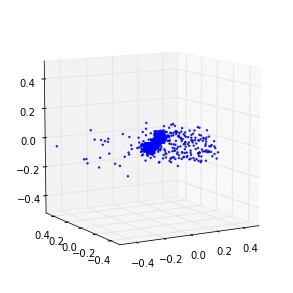

1211 (-29618550.289655171, 10593910183.724138) 37.1359729767
1212 (-5851580.9103448279, 10624696284.689655) 37.1193571091
1213 (-13384068.413793104, 10845064615.724138) 37.7268300056
1214 (-20215906.868965518, 10191773448.827587) 37.1550409794
1215 (-18228803.089655172, 10326163173.517241) 36.187210083
1216 (-8467131.1448275857, 10593124563.862068) 37.0978960991
1217 (-12805868.579310345, 10512099928.275862) 38.3221569061
1218 (-11516214.731034482, 10571796762.482759) 36.6554160118
1219 (-15772523.696551723, 10211087642.482759) 36.6167368889
1220 (-115380365.24137931, 10107562584.275862) 36.6884968281
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1220 is not in all_model_checkpoint_paths. Manually adding it.


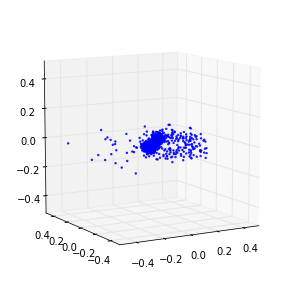

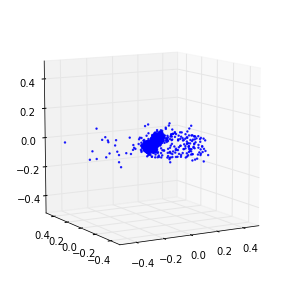

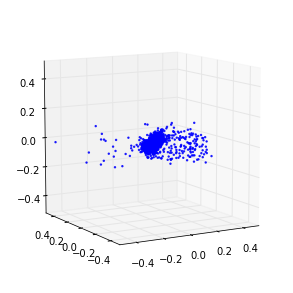

1221 (20951230.67586207, 10661738672.551723) 36.715364933
1222 (-25195230.455172412, 9381215567.4482765) 37.3056931496
1223 (-24891896.937931035, 9185728388.4137936) 36.5516638756
1224 (-28874448.331034482, 8471198596.4137936) 36.7666339874
1225 (-31788974.786206897, 8239849277.7931032) 36.7459750175
1226 (-41715846.179310344, 8548588808.8275862) 35.3972520828
1227 (-28251662.124137931, 9101190603.034483) 35.324837923
1228 (-14870439.72413793, 9304941532.6896553) 36.6546440125
1229 (-38133293.903448276, 8843928628.965517) 36.3170609474
1230 (-81908421.737931028, 8453426352.5517244) 36.4794950485
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1230 is not in all_model_checkpoint_paths. Manually adding it.


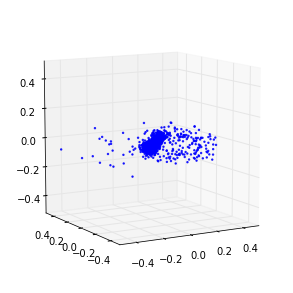

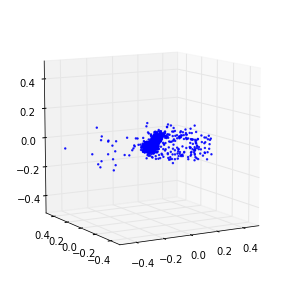

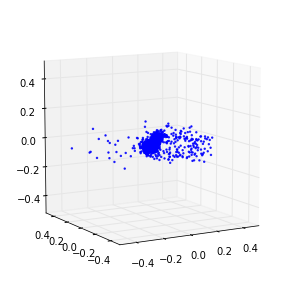

1231 (-65850484.524137929, 8407217046.0689659) 36.6487729549
1232 (-50909346.427586205, 7900887128.2758617) 36.21986413
1233 (-19677470.013793103, 7729894135.1724138) 37.5083441734
1234 (-34342371.751724139, 7761614900.965517) 35.846214056
1235 (-45926573.020689659, 7939231249.6551723) 36.9058549404
1236 (-44976099.751724139, 7702576110.3448277) 36.052077055
1237 (-45407157.848275863, 7535272606.8965521) 36.2332618237
1238 (-34612492.358620688, 7398242692.4137936) 36.6530759335
1239 (-28086671.006896552, 7755538326.0689659) 35.7681109905
1240 (-24473903.668965518, 7838022373.5172415) 36.7410030365
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1240 is not in all_model_checkpoint_paths. Manually adding it.


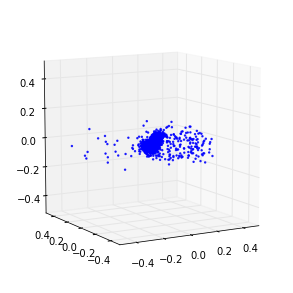

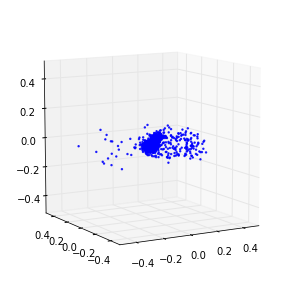

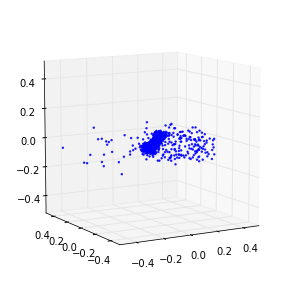

1241 (-39143597.020689659, 7625888361.9310341) 35.694314003
1242 (-26338046.234482758, 7581716850.7586203) 36.3352601528
1243 (-20645337.158620689, 7812761829.5172415) 36.0376520157
1244 (-29839243.475862067, 8014084254.8965521) 35.8815670013
1245 (-161619568.99310344, 8325495401.9310341) 36.8441748619
1246 (-21876308.744827587, 7557874917.5172415) 36.9792811871
1247 (-62953938.096551724, 7480615671.1724138) 36.7852048874
1248 (-14409328.993103448, 7883871920.5517244) 36.7940750122
1249 (-30313436.689655174, 7857897948.6896553) 36.139236927
1250 (-21696286.013793103, 7835697416.8275862) 36.3890688419
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1250 is not in all_model_checkpoint_paths. Manually adding it.


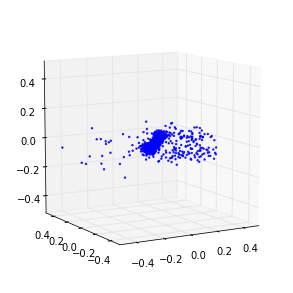

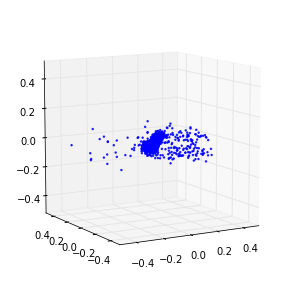

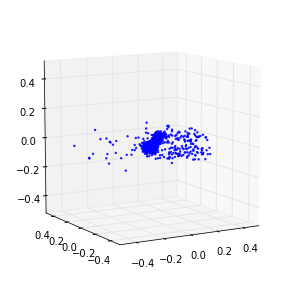

1251 (-35352240.551724136, 7737793394.7586203) 35.9000098705
1252 (-39063827.420689657, 7502753580.1379309) 36.9880640507
1253 (-37534762.372413792, 7178190318.3448277) 37.2681741714
1254 (-34060499.862068966, 7447863066.4827585) 36.5028572083
1255 (-23601099.034482758, 7483006287.4482756) 36.3805580139
1256 (-24539573.848275863, 7458848273.6551723) 36.5821659565
1257 (-23942398.234482758, 7379578262.0689659) 35.8330328465
1258 (-19669207.393103447, 7389580676.4137936) 35.4721858501
1259 (-26811893.40689655, 7161672986.4827585) 36.5729010105
1260 (-13513876.303448277, 7498575360.0) 36.6972198486
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1260 is not in all_model_checkpoint_paths. Manually adding it.


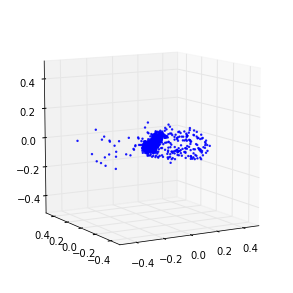

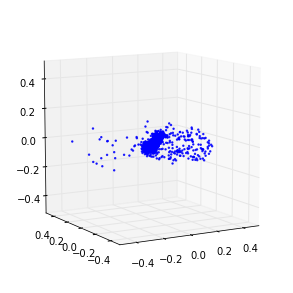

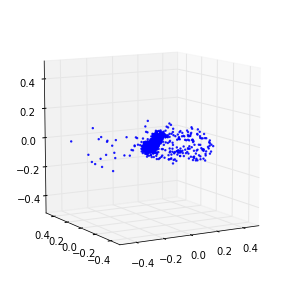

1261 (-15804447.779310346, 7662883892.965517) 35.6137821674
1262 (-11354924.137931034, 7581452482.2068968) 36.5909659863
1263 (-11169717.848275863, 7385750457.3793106) 35.9685628414
1264 (-16035818.813793104, 7039791386.4827585) 36.8434169292
1265 (-13214871.834482759, 7130540667.5862064) 36.6779060364
1266 (-18813369.379310343, 7527682701.2413797) 36.3528060913
1267 (-12775441.655172413, 7561943145.9310341) 36.3006091118
1268 (-13319803.586206896, 7577300656.5517244) 37.0414228439
1269 (-11879798.289655173, 7026452356.4137936) 36.849406004
1270 (-3752730.4827586208, 6645483696.5517244) 36.565210104
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1270 is not in all_model_checkpoint_paths. Manually adding it.


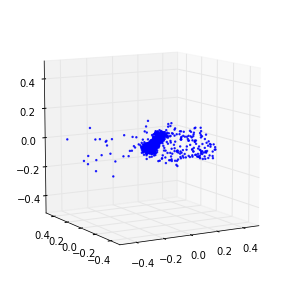

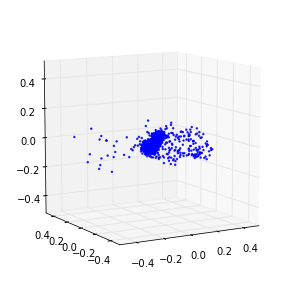

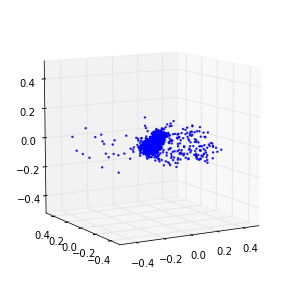

1271 (6930379.0344827585, 5978408730.4827585) 35.233301878
1272 (-886558.0137931034, 5555081180.6896553) 35.9526410103
1273 (-3368719.8896551724, 5667169862.6206894) 36.5004310608
1274 (-12479463.282758621, 5710083672.2758617) 36.6740710735
1275 (-48838264.055172414, 6316846733.2413797) 36.6061320305
1276 (-204479975.28275862, 6951885276.6896553) 35.8879308701
1277 (-259151430.62068966, 7384060839.7241383) 36.6079428196
1278 (-198069827.08965516, 7092518735.4482756) 36.532761097
1279 (-107162348.57931034, 6888665988.4137936) 36.3790888786
1280 (-117920273.65517241, 5635293307.5862064) 36.3948049545
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1280 is not in all_model_checkpoint_paths. Manually adding it.


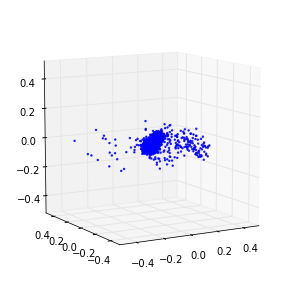

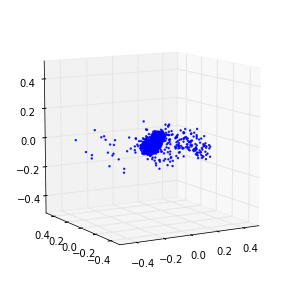

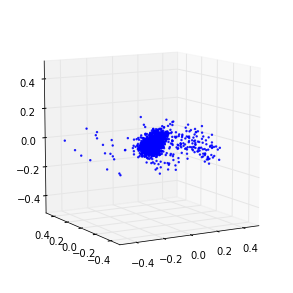

1281 (-61053644.799999997, 4116958693.5172415) 35.6398561001
1282 (5820806.1793103451, 3992741217.1034484) 36.671628952
1283 (-71525084.68965517, 3042987475.8620691) 36.2702538967
1284 (-17855087.227586206, 3009940762.4827585) 36.7326250076
1285 (-34988939.475862071, 3202468961.1034484) 37.0197710991
1286 (-13953144.055172414, 3203384787.8620691) 37.076114893
1287 (-2215348.9655172415, 2972916947.8620691) 36.3463718891
1288 (-160387887.66896552, 2812324449.1034484) 36.5375669003
1289 (-97061462.510344833, 2887219857.6551723) 36.7303240299
1290 (-1718589831.0620689, 2994110856.8275862) 36.2656509876
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1290 is not in all_model_checkpoint_paths. Manually adding it.


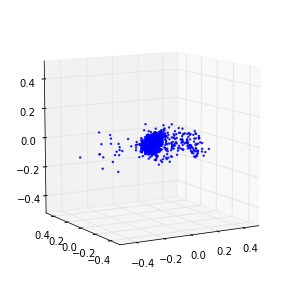

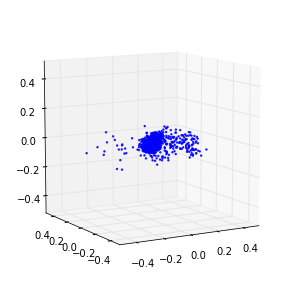

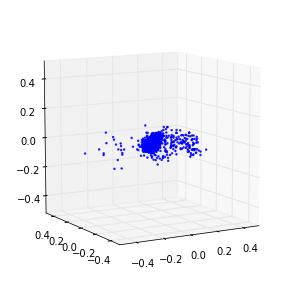

1291 (331063356.55172414, 2474767232.3448277) 36.2582509518
1292 (-130290112.71724138, -194641757.86206895) 36.216809988
1293 (-90042378.868965521, 1591018016.0) 36.0713851452
1294 (-288526152.82758623, 2246462945.1034484) 36.8269848824
1295 (-69916401.875862062, 2087361090.2068965) 36.5846309662
1296 (-74990057.048275858, 2013025262.3448277) 36.5418961048
1297 (-73254249.489655167, 2083471280.5517242) 36.3816628456
1298 (-8354225.4344827589, 2232920439.1724138) 36.0131559372
1299 (4762985.931034483, 2322982408.8275862) 36.5321009159
1300 (4095504.772413793, 2347873156.4137931) 36.441671133
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1300 is not in all_model_checkpoint_paths. Manually adding it.


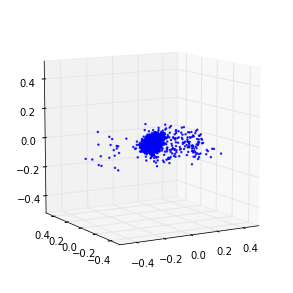

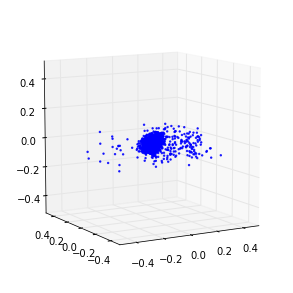

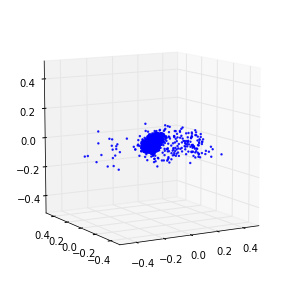

1301 (-7467294.0137931034, 2416484135.7241378) 36.3110311031
1302 (-42061931.696551725, 2459399463.7241378) 36.7199659348
1303 (1715883.2551724138, 2489273820.6896553) 36.4989910126
1304 (-40457292.799999997, 2144286976.0) 36.0989699364
1305 (-224012803.97241378, 1623154072.275862) 36.8020560741
1306 (-57581507.089655176, 908912901.39655173) 35.572163105
1307 (15608570.27586207, -80725404.241379306) 36.1968140602
1308 (-68298094.565517247, -31211754.0) 36.5702369213
1309 (-128108833.79310344, -288544034.89655173) 38.6630539894
1310 (-229411154.15172413, -80258461.103448272) 37.2329690456
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1310 is not in all_model_checkpoint_paths. Manually adding it.


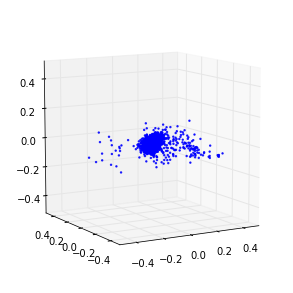

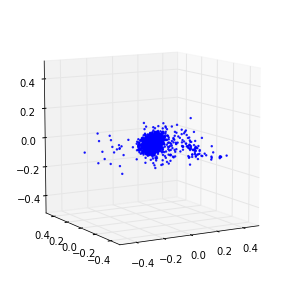

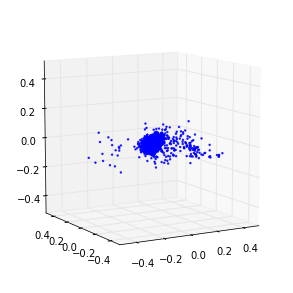

1311 (-169008593.18620691, 5298541.4827586208) 36.4693181515
1312 (-237571219.86206895, -120349929.79310344) 37.0755369663
1313 (-130533767.80689655, 540032343.4482758) 37.1555960178
1314 (-92374938.951724142, 650957660.68965518) 36.7220189571
1315 (-85642023.282758623, 1226602685.7931035) 37.0883929729
1316 (-60248563.200000003, 1804140427.0344827) 36.7321441174
1317 (-37198860.358620688, 1757906030.3448277) 35.7882730961
1318 (-53832219.365517244, 1762646969.3793104) 36.2822539806
1319 (-70353202.758620694, 1607975724.1379311) 37.6344249249
1320 (-63962600.165517241, 1409699233.1034484) 38.2358908653
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1320 is not in all_model_checkpoint_paths. Manually adding it.


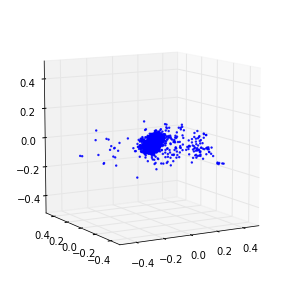

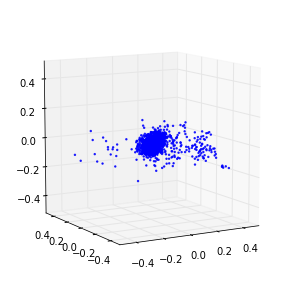

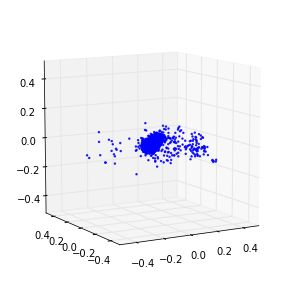

1321 (-98648884.08275862, 1402820610.2068965) 36.4795820713
1322 (-90976832.799999997, 771830693.51724136) 36.8812930584
1323 (-106400345.29655172, 120371102.44827586) 35.9564960003
1324 (-78156571.875862062, 1112650164.4137931) 37.8677959442
1325 (-102984465.90344827, 1107605455.0344827) 36.5672578812
1326 (-84540474.262068972, 1664911540.9655173) 36.1070899963
1327 (-104935203.5862069, 1345953044.4137931) 35.756994009
1328 (-75487481.765517235, 49257762.896551721) 38.1878240108
1329 (-78317383.365517244, -152056056.6724138) 36.3188979626
1330 (-59064870.206896551, 755623004.96551728) 37.3645420074
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1330 is not in all_model_checkpoint_paths. Manually adding it.


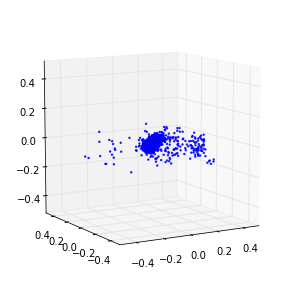

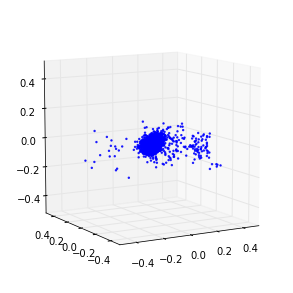

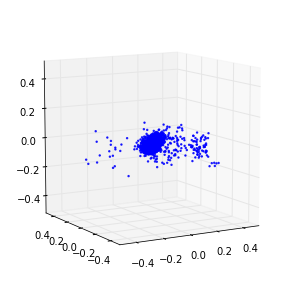

1331 (-58623423.799999997, 1168938425.3793104) 36.0278768539
1332 (-73384894.675862074, 1669297019.5862069) 36.6823780537
1333 (-85208129.324137926, 1611881992.8275862) 36.520375967
1334 (-92252337.434482753, 1528393255.724138) 36.4248058796
1335 (-44160298.372413792, 1258786599.724138) 36.7604379654
1336 (-140100117.93103448, 1292187920.5517242) 36.7683501244
1337 (-19722282.372413792, 1737720214.0689654) 36.9936590195
1338 (-139711918.34482759, 1526021462.0689654) 36.5940878391
1339 (-100052478.8275862, 221320278.89655173) 36.4369990826
1340 (-70054135.751724139, -107467459.10344827) 39.4642319679
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1340 is not in all_model_checkpoint_paths. Manually adding it.


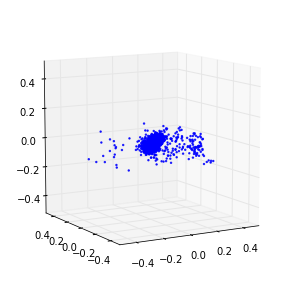

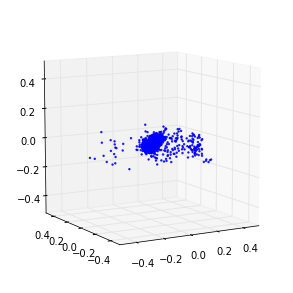

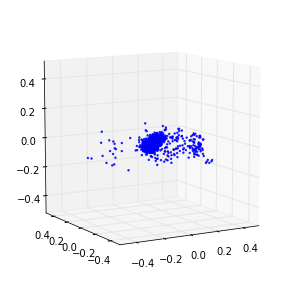

1341 (-72627023.889655173, 31742046.55172414) 37.4111230373
1342 (-71241393.22758621, -194039841.89655173) 36.8769910336
1343 (-102872101.59999999, -276610699.34482759) 37.5049631596
1344 (-112618179.97241379, -323443760.41379309) 37.5243060589
1345 (-65639761.172413796, -77229656.0) 37.3749680519
1346 (-51813160.993103445, 1091525861.7931035) 37.0080530643
1347 (-55004339.862068966, 1444243639.1724138) 37.1937630177
1348 (-67692410.262068972, 1297685139.8620689) 38.0005319118
1349 (-88327457.103448272, 1429906427.5862069) 37.4536650181
1350 (-52962459.365517244, 1612064688.5517242) 36.7977869511
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1350 is not in all_model_checkpoint_paths. Manually adding it.


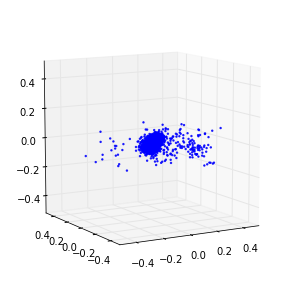

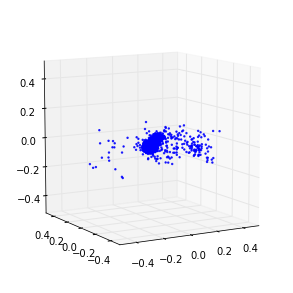

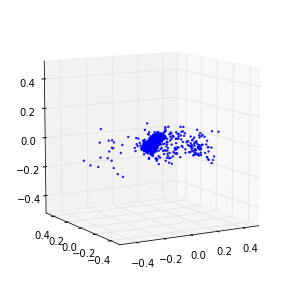

1351 (-42989885.35172414, 1667908788.9655173) 37.3490579128
1352 (-69414002.979310349, 1334249551.4482758) 37.589673996
1353 (-42709355.255172417, 1618828265.9310346) 37.8656909466
1354 (-56623531.034482762, 1104832105.9310346) 37.4762990475
1355 (-42975545.820689656, 1482049149.7931035) 38.5530538559
1356 (-33995652.634482756, 1188965394.7586207) 37.8493561745
1357 (-174011584.3862069, 149960271.24137932) 38.0068819523
1358 (-138578641.24137932, -266514071.58620688) 37.9269239902
1359 (-98360261.517241374, -485721946.48275864) 37.7781338692
1360 (-53658638.317241378, 394536180.37931037) 37.4201800823
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1360 is not in all_model_checkpoint_paths. Manually adding it.


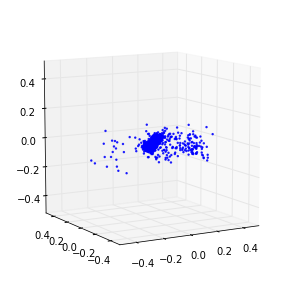

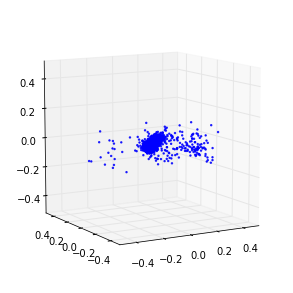

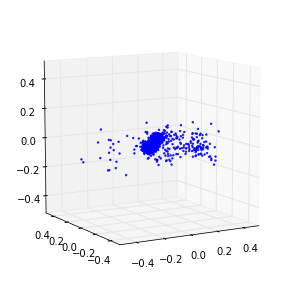

1361 (-81325901.186206892, -250726230.20689654) 36.432461977
1362 (-148596934.40000001, 1349918939.0344827) 39.172123909
1363 (-124956285.79310344, 1535537121.1034484) 37.319674015
1364 (-100794255.00689656, 1944969939.8620689) 45.6114149094
1365 (-163794514.09655172, 2003864280.275862) 43.487169981
1366 (-260705759.33793104, 1080889601.1034484) 47.274463892
1367 (-331618780.91034484, -257908583.65517241) 43.848320961
1368 (-145328981.71034482, 577574995.86206901) 43.0555138588
1369 (-68379840.965517238, -443759164.41379309) 45.0641498566
1370 (-51546072.937931031, -1123052.6206896552) 46.7935361862
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1370 is not in all_model_checkpoint_paths. Manually adding it.


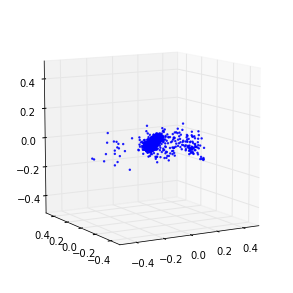

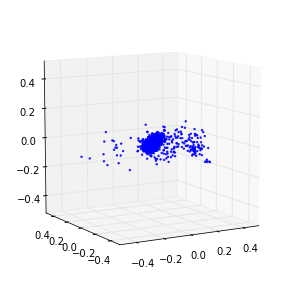

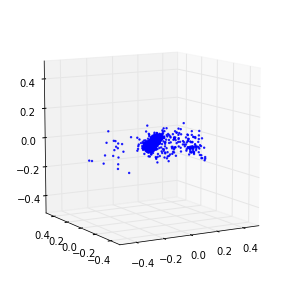

1371 (-66628735.282758623, 150542398.89655173) 42.7512979507
1372 (-92856637.751724139, -439605933.51724136) 43.5160341263
1373 (-67817901.351724133, 744640093.4482758) 43.0761399269
1374 (-275265667.53103447, 2115700762.4827585) 43.3043980598
1375 (-282881876.74482757, 2080892111.4482758) 42.2460520267
1376 (-188987391.11724138, 1972527845.5172415) 44.0979120731
1377 (-599022795.91724133, 2178966236.6896553) 42.829472065
1378 (-429171404.80000001, 2300176317.7931032) 43.4451391697
1379 (-169628323.31034482, 2042169794.2068965) 45.0592718124
1380 (-60156433.655172415, 1996166876.6896551) 48.0510840416
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1380 is not in all_model_checkpoint_paths. Manually adding it.


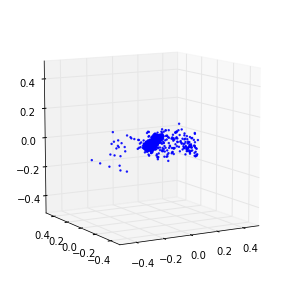

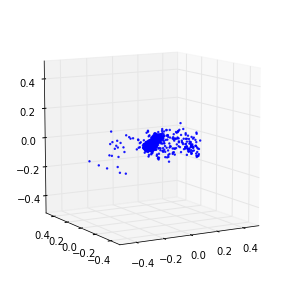

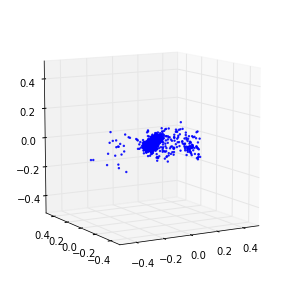

1381 (-26515740.248275861, 2048982435.3103449) 42.8573739529
1382 (-26761906.317241378, 2220341585.6551723) 43.8029670715
1383 (-75572482.868965521, 2252284363.034483) 43.5100588799
1384 (-34634579.641379312, 2735924301.2413793) 42.6256599426
1385 (-49873448.0, 2640100008.8275862) 47.5311248302
1386 (-27548901.517241381, 2987791183.448276) 43.2689139843
1387 (-48954586.924137928, 3411076705.1034484) 46.9345810413
1388 (-56576007.062068969, 3464437592.2758622) 46.3042991161
1389 (-37582373.075862072, 3734478494.8965516) 42.564576149
1390 (-51757458.096551724, 3553151084.1379309) 46.8241620064
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1390 is not in all_model_checkpoint_paths. Manually adding it.


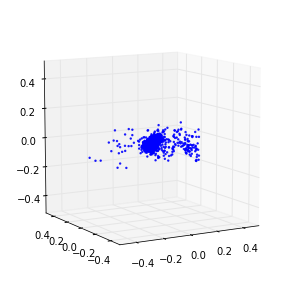

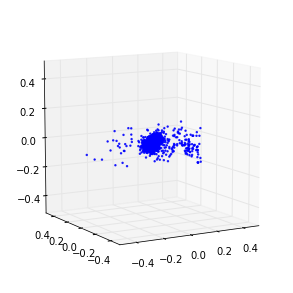

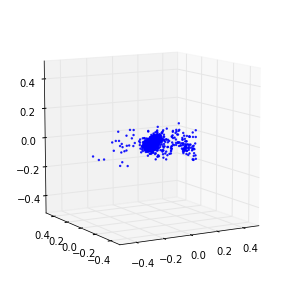

1391 (-82484760.717241377, 3797983051.034483) 41.7377250195
1392 (-155965996.13793105, 4153717760.0) 43.6661961079
1393 (-28087557.296551723, 4528764151.1724138) 41.244781971
1394 (-37904117.406896554, 4786526861.2413797) 42.6394739151
1395 (17249880.275862068, 4719052852.965517) 43.3521509171
1396 (-92621396.744827583, 4954332071.7241383) 43.4559490681
1397 (-54447630.124137931, 5140363069.7931032) 43.9643440247
1398 (-3256803.7517241379, 5444505211.5862064) 46.9755108356
1399 (1423783.7241379311, 5738203683.3103447) 41.9320299625
1400 (-8526851.5310344826, 6402961920.0) 42.6413788795
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1400 is not in all_model_checkpoint_paths. Manually adding it.


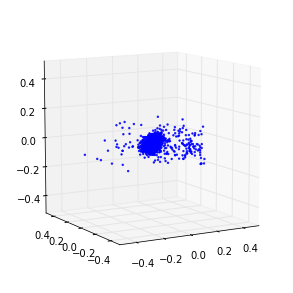

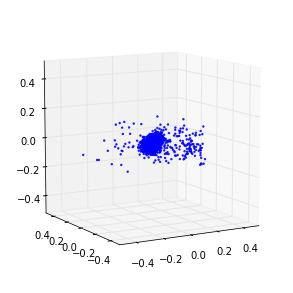

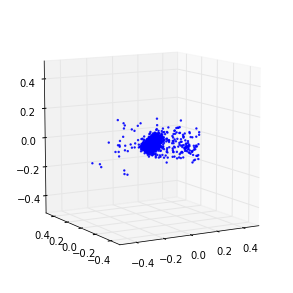

1401 (-7459144.386206897, 6769163970.2068968) 46.3853769302
1402 (-5014874.0413793102, 6573473191.7241383) 46.6334609985
1403 (-12676233.710344827, 6545737251.3103447) 44.2847099304
1404 (-14681833.048275862, 6477236188.6896553) 42.2230331898
1405 (-11964769.103448275, 6557522096.5517244) 41.064841032
1406 (-11687628.800000001, 6714210992.5517244) 41.5216219425
1407 (-33539915.91724138, 6691899727.4482756) 42.15417099
1408 (-7184260.4137931038, 6708672282.4827585) 42.0408930779
1409 (-9507977.7103448268, 7139145886.8965521) 41.5190238953
1410 (-13607653.517241379, 7210102148.4137936) 39.6638240814
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1410 is not in all_model_checkpoint_paths. Manually adding it.


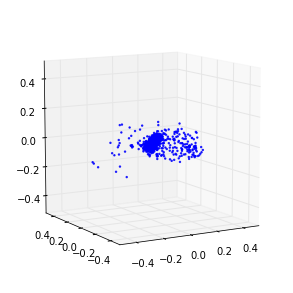

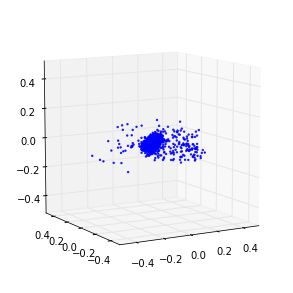

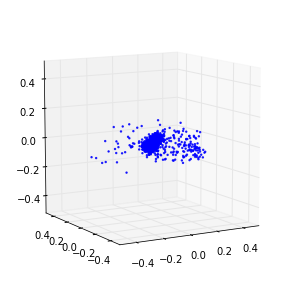

1411 (-39639873.324137934, 7073739581.7931032) 37.4327571392
1412 (-37223367.503448278, 7519457968.5517244) 37.4061019421
1413 (-14256572.910344828, 7194922496.0) 37.7728641033
1414 (-47198723.531034485, 7268402635.034483) 36.9681620598
1415 (-41029533.131034486, 6970413356.1379309) 36.8982019424
1416 (-26127773.131034482, 6580156133.5172415) 38.3832108974
1417 (-13500719.668965517, 5529829870.3448277) 38.4889161587
1418 (-16267546.482758621, 5073736033.1034479) 37.5200650692
1419 (-10880515.531034483, 5538699740.6896553) 37.2380888462
1420 (-28650672.55172414, 5694485715.8620691) 37.3229560852
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1420 is not in all_model_checkpoint_paths. Manually adding it.


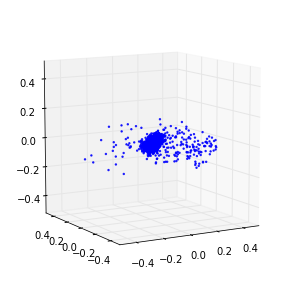

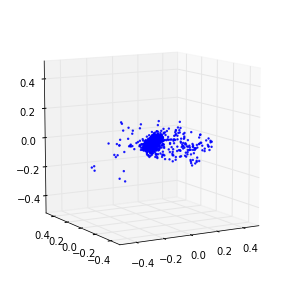

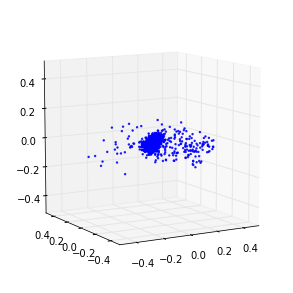

1421 (454818.42758620688, 5540240013.2413797) 36.9581859112
1422 (-11758973.351724138, 4956310492.6896553) 37.3080968857
1423 (-36921852.468965515, 5131107186.7586203) 37.0315980911
1424 (-29358630.841379311, 5265028608.0) 37.9642689228
1425 (-17171286.510344829, 4898033116.6896553) 37.4255609512
1426 (-9876776.6068965513, 5005585672.8275862) 36.4382469654
1427 (-27433556.744827587, 5284364093.7931032) 37.2833008766
1428 (-8604686.1241379306, 4881652665.3793106) 37.1021978855
1429 (-18574900.965517242, 5110851319.1724138) 37.3665268421
1430 (-37331805.572413795, 5432737544.8275862) 37.8124289513
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1430 is not in all_model_checkpoint_paths. Manually adding it.


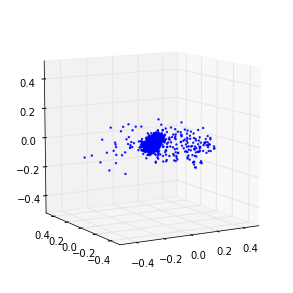

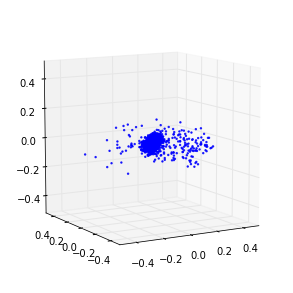

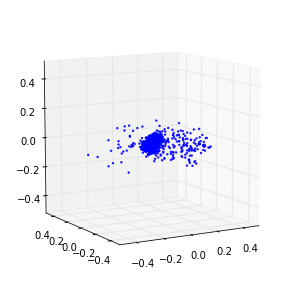

1431 (-16009314.868965518, 5196507118.3448277) 35.9632680416
1432 (-5877329.2137931036, 5340947791.4482756) 38.0037529469
1433 (-26015917.020689655, 5637973927.7241383) 38.8998279572
1434 (-39545188.634482756, 5619730273.1034479) 37.8310461044
1435 (-69721261.020689651, 5768265745.6551723) 37.7192258835
1436 (-40797014.510344826, 5608682743.1724138) 37.1413328648
1437 (-19756854.731034484, 5825215664.5517244) 37.4755618572
1438 (-41617891.751724139, 6258902775.1724138) 38.2683429718
1439 (-24560251.586206898, 6413107482.4827585) 36.6441922188
1440 (-70056843.475862071, 6409575741.7931032) 37.5817360878
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1440 is not in all_model_checkpoint_paths. Manually adding it.


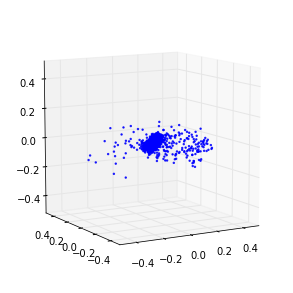

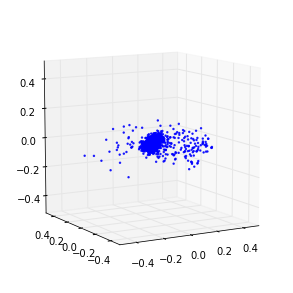

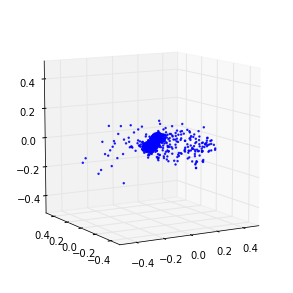

1441 (-12567912.165517241, 6075314352.5517244) 37.0964069366
1442 (-26170664.606896553, 5657816505.3793106) 36.2507259846
1443 (-27737737.710344829, 6185751710.8965521) 37.7776520252
1444 (-14948521.489655172, 6439292221.7931032) 38.0783929825
1445 (-17424454.620689657, 6443302294.0689659) 37.286919117
1446 (-33025744.331034482, 6059250070.0689659) 37.1256070137
1447 (-16943686.620689657, 5944684632.2758617) 38.5423779488
1448 (-43094775.172413796, 6413167845.5172415) 37.4250118732
1449 (-36945916.468965515, 6170067544.2758617) 37.1314721107
1450 (-24456845.241379309, 6288674798.3448277) 38.2199549675
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1450 is not in all_model_checkpoint_paths. Manually adding it.


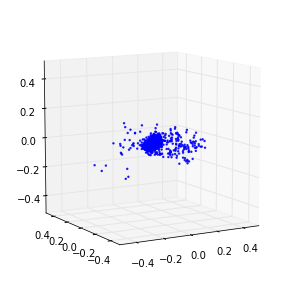

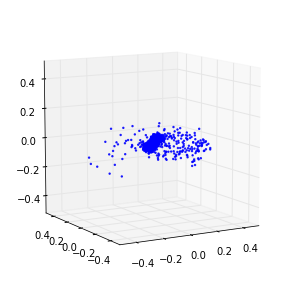

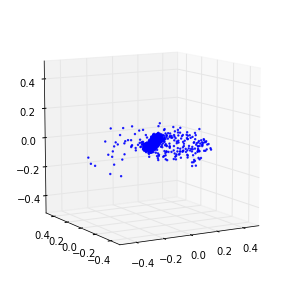

1451 (-30998076.027586207, 6829277236.965517) 36.6559751034
1452 (-21264634.703448277, 6688526795.034483) 37.4461510181
1453 (-2800618.8137931037, 6370521794.2068968) 37.2256119251
1454 (-13849328.110344827, 5999218882.2068968) 38.229403019
1455 (-2392399.4482758623, 6091806772.965517) 37.3580288887
1456 (-2555218.9793103449, 6147598318.3448277) 37.2212128639
1457 (-1934297.1586206898, 6487693682.7586203) 38.7540669441
1458 (-4597057.3241379308, 6994406929.6551723) 37.3532409668
1459 (-15897652.965517242, 7270794628.4137936) 38.0943660736
1460 (-796576.6620689655, 6925984768.0) 37.3589589596
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/models/nips/gan/raw_wgan/car_mlp_arch_raw_wgan_2048_pts/models.ckpt-1460 is not in all_model_checkpoint_paths. Manually adding it.


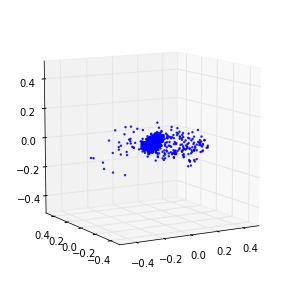

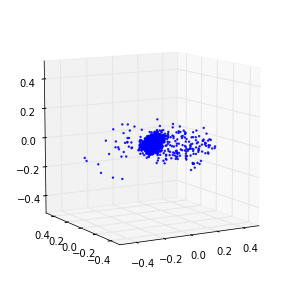

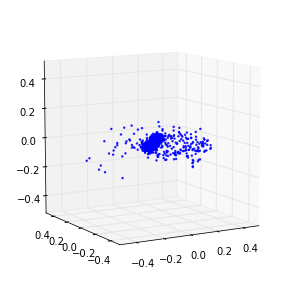

1461 (-18212775.724137932, 7307021841.6551723) 37.9376430511


In [ ]:
if do_training:
    for _ in range(max_epochs + 1):
        loss, duration = gan._single_epoch_train(training_data, batch_size, noise_params)
        epoch = int(gan.sess.run(gan.epoch.assign_add(tf.constant(1.0))))
        print epoch, loss, duration
        if save_model and epoch % 10 == 0:
            checkpoint_path = osp.join(train_dir, model_saver_id)
            gan.saver.save(gan.sess, checkpoint_path, global_step=gan.epoch)
            syn_d = gan.generate(n_syn_samples, noise_params)
            accum_syn_data.append(syn_d)
            for k in range(3):
                Point_Cloud(syn_d[k]).plot(in_u_sphere=True)
        train_stats.append((epoch,) + loss)

In [ ]:
if do_plotting:
    x = range(len(train_stats))
    d_loss = [t[1] for t in train_stats]
    g_loss = [t[2] for t in train_stats]
    plt.plot(x, d_loss, '--')
    plt.plot(x, g_loss)
    plt.title('Latent GAN training. (%s, %s)' %(class_name, ae_loss))
    plt.legend(['Discriminator', 'Generator'], loc=0)
    
    plt.tick_params(axis='x', which='both', bottom='off', top='off')
    plt.tick_params(axis='y', which='both', left='off', right='off')
    
    plt.xlabel('Epochs.') 
    plt.ylabel('Loss.')

In [17]:
# saved_epochs = read_saved_epochs(train_dir)
# print saved_epochs
save_dir = osp.join(synthetic_data_out_dir, experiment_name)
create_dir(save_dir)
# for epoc in saved_epochs:
for epoc in range(0,1600,100):    
    print epoc
    if epoc == 0:
        continue
    gan.saver.restore(gan.sess, osp.join(train_dir,'models.ckpt' + '-' + str(epoc)))
    d = gan.generate(n_syn_samples, noise_params)
    np.savez(osp.join(save_dir, 'epoch_' + str(epoc)), d)

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500


In [ ]:
epoch_to_check = 1500
n_check = 5
check_data = accum_syn_data[(epoch_to_check / 10)-1]
rids = np.random.choice(range(len(check_data)), size=n_check, replace=False)
for i in range(n_check):
    Point_Cloud(check_data[rids[i]]).plot(in_u_sphere=True)    

In [ ]:
synthetic_data_out_dir = '/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/nips/our_synthetic_samples/'
saver_step = 10
if save_synthetic_samples:    
    create_dir(save_dir)
    for i, d in enumerate(accum_syn_data):
        epoc = str((i + 1) * saver_step)
        np.savez(osp.join(save_dir, 'epoch_' + epoc), d)